In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

ERROR 1: PROJ: proj_create_from_database: Open of /nesi/project/niwa00018/rampaln/envs/ml_env_v2/share/proj failed


In [3]:
import glob
from dask.diagnostics import ProgressBar

In [9]:
import os
AI_indicators = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/NIWA-REMS_AI_P_T_indicators_final_v150425.nc')
AI_indicators['CC_signal'] =100* ( AI_indicators.seasonal_pr_future - AI_indicators.seasonal_pr_hist)/AI_indicators.seasonal_pr_hist
access_esm = AI_indicators.sel(GCM_variant = AI_indicators.GCM =='ACCESS-ESM1-5')
AI_indicators['CC_signal_tasmax'] =( AI_indicators.seasonal_tasmax_future - AI_indicators.seasonal_tasmax_hist)#/AI_indicators.seasonal_pr_hist

## UThings

1. Update joint uncertainty plot to include the 3 GCMs (ACCESS-CM2, EC-Earth3, NorESM2-MM) in the imperfect
2. Update the plot to also include SST driven runs a bit more clearly;

In [10]:
static_fields = xr.open_dataset(r'/nesi/project/niwa03712/group_shared/Emulator_training_data/ERA5_eval_ccam_12km.198110_NZ_Invariant.nc')

In [750]:
merged_dset_updated = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Low_res_ACCESS-ESM1-5_ensemble.nc')
merged_dset = merged_dset_updated.copy()
merged_dset['CC_signal_pr'] = 100*(merged_dset['pr_seasonal_future'] -merged_dset['pr_seasonal_hist'])/merged_dset['pr_seasonal_hist']
#merged_dset= merged_dset.interp(lat = static_fields.lat, lon = static_fields.lon, method ='nearest')

In [751]:
merged_dset['CC_signal_tasmax'] = (merged_dset['tasmax_seasonal_future'] -merged_dset['tasmax_seasonal_hist'])#/merged_dset['pr_seasonal_hist']
merged_dset= merged_dset.interp(lat = static_fields.lat, lon = static_fields.lon, method ='nearest')

In [752]:
def compute_obs_metrics():
    observations = xr.open_dataset(r'/nesi/project/niwa00018/gibsonp/dload_data/VCSN_Rain_Council/rainfall_council_ni_si_start_cumulation.nc').sel(time = slice("1986","2005"))
    tasmax_obs = xr.open_dataset(r'/nesi/project/niwa00004/ML_DATA/VCSN/temperature_maximum/tmax_N/VCSN_Tmaxn5k_1972-2018.nc').sel(time = slice("1986","2005")).ffill("latitude",limit =2).ffill("longitude",limit =2)
    tasmax_obs = tasmax_obs.interp(latitude = observations.latitude, longitude = observations.longitude, method ='nearest', kwargs = dict(fill_value ='extrapolate'))
    rx1day = observations.groupby('time.year').max().mean("year")
    txx = tasmax_obs.groupby('time.year').max().mean("year")
    ann_precip = observations.groupby('time.season').mean()#.mean("year")
    ann_tasmax = tasmax_obs.groupby('time.season').mean()#.mean("year")
    return ann_precip, ann_tasmax, rx1day, txx
precip, tasmax, rx1day, txx = compute_obs_metrics()

In [17]:
merged_dset

<xarray.Dataset>
Dimensions:                 (GCM_variant: 40, season: 4, lat: 172, lon: 179, year: 151)
Coordinates:
  * GCM_variant             (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' .....
    height                  float64 2.0
    height_2                float64 10.0
  * season                  (season) object 'DJF' 'JJA' 'MAM' 'SON'
  * year                    (year) int64 1950 1951 1952 1953 ... 2098 2099 2100
  * lat                     (lat) float32 -51.21 -51.11 -51.0 ... -32.97 -32.86
  * lon                     (lon) float32 164.9 165.0 165.1 ... 183.9 184.0
Data variables:
    tasmax_seasonal_future  (GCM_variant, season, lat, lon) float32 286.0 ......
    pr_seasonal_future      (GCM_variant, season, lat, lon) float32 4.153e-05...
    tasmax_seasonal_hist    (GCM_variant, season, lat, lon) float32 284.7 ......
    pr_seasonal_hist        (GCM_variant, season, lat, lon) float32 3.884e-05...
    TXx                     (GCM_variant, year, lat, lon) float32 286.7 ... 3...
    Rx1day                  (GCM_variant, year, lat, lon) float32 0.000301 .....
    CC_signal_pr            (GCM_variant, season, lat, lon) float32 6.928 ......
    CC_signal_tasmax        (GCM_variant, season, lat, lon) float32 1.361 ......

In [753]:
def get_low_res_indicators(merged_dset):
    ccam_historical = merged_dset#xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/CCAM_P_T_indicators.nc')
    rx1day_ccam = interp_data(ccam_historical.Rx1day.sel(year = slice("1986","2005")).mean("year") * 86400)
    txx_ccam = interp_data(ccam_historical.TXx.sel(year = slice("1986","2005")).mean("year"))
    ann_precip_ccam = interp_data(ccam_historical.pr_seasonal_hist *86400)
    ann_tasmax_ccam = interp_data(ccam_historical.tasmax_seasonal_hist)
    return ann_precip_ccam, ann_tasmax_ccam, rx1day_ccam, txx_ccam
def interp_data(df, precip = precip):
    try:
        df = df.interp(lat = precip.latitude, lon = precip.longitude,method ='nearest', kwargs =dict(fill_value ='extrapolate'))
    except:
        df = df.interp(latitude = precip.latitude,
                       longitude = precip.longitude, method ='nearest', kwargs =dict(fill_value ='extrapolate'))
    return df



In [754]:
ann_precip_gcm, ann_tasmax_gcm, rx1day_gcm, txx_gcm = get_low_res_indicators(merged_dset)

In [51]:
def get_ensemble_season(season = 'JJA', varname ='PR'):
    files_ai = glob.glob(f'//nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_indicators/output_v3/historical/static_maps/{varname}/*base_bp1986-2005_{season}_NZ12km.nc')
    dfs = []
    gcms = []
    for file in files_ai:
        df = xr.open_dataset(file)
        dfs.append(df.squeeze().drop("time"))
        gcm = file.split('/')[-1].split('_')[2]
        variant = file.split('/')[-1].split('_')[3]
        gcm_string = f'{gcm}_{variant}'
        gcms.append(gcm_string)
    #concat = xr.concat(dfs, dim ="GCM")
    #gcm = [files_ai[i].split('_')[4] for i in range(len(files_ai))]
    concat = xr.concat(dfs, dim ="GCM_variant")
    concat['GCM_variant'] =(('GCM_variant'), gcms)
    return concat

In [755]:
mape_ann = np.sqrt(abs(ann_precip_gcm - precip)**2)#/precip
mae_ann_txx = np.sqrt(abs(txx_gcm - txx)**2)
mae_ann_rx1day = np.sqrt(abs(rx1day_gcm - rx1day)**2)
mae_ann_tasmax = np.sqrt(abs(ann_tasmax_gcm - tasmax)**2)

In [757]:
mape_ann 

<xarray.Dataset>
Dimensions:       (GCM_variant: 40, season: 4, latitude: 268, longitude: 248)
Coordinates:
  * latitude      (latitude) float64 -47.47 -47.42 -47.37 ... -34.17 -34.12
  * longitude     (longitude) float64 166.3 166.4 166.4 ... 178.6 178.6 178.7
  * season        (season) object 'DJF' 'JJA' 'MAM' 'SON'
  * GCM_variant   (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'ACCESS-...
    height        float64 2.0
    height_2      float64 10.0
    lat           (latitude) float64 -47.47 -47.42 -47.37 ... -34.17 -34.12
    lon           (longitude) float64 166.3 166.4 166.4 ... 178.6 178.6 178.7
Data variables:
    rain_council  (GCM_variant, season, latitude, longitude) float64 nan ... nan

In [758]:
season ='DJF'
# Obtain historical Emulator Data
precip_Emul = get_ensemble_season(season =season, varname ='PR')
tasmax_Emul = get_ensemble_season(season =season, varname ='TX')
Txx_Emul = get_ensemble_season(season ='ANN', varname ='TXx')
rx1day_Emul = get_ensemble_season(season ='ANN', varname ='Rx1day')

<xarray.Dataset>
Dimensions:      (GCM_variant: 77, latitude: 268, longitude: 248)
Coordinates:
  * GCM_variant  (GCM_variant) <U25 'ACCESS-ESM1-5_r18i1p1f1' ... 'MPI-ESM1-2...
  * latitude     (latitude) float64 -47.47 -47.42 -47.37 ... -34.17 -34.12
  * longitude    (longitude) float64 166.3 166.4 166.4 ... 178.6 178.6 178.7
Data variables:
    TXx          (GCM_variant, latitude, longitude) float64 nan nan ... nan nan
Attributes: (12/29)
    Conventions:     CF-1.7
    title:           Generative AI Downscaled data
    il:              288
    kl:              1
    version:         NIWA-REMS_v110425_pr of CCAM Version: CCAM r5251:5254M
    dt:              240.0
    ...              ...
    git_remote:      https://git.niwa.local/climate-variability/cmip6-downsca...
    relative_path:   ccam_cmip6_indicators/static_maps_v2.py
    git_sha:         bbda796b072db0a39a2edb100b77745cf2310794
    author:          Neelesh Rampal
    author_email:    neelesh.rampal@niwa.co.nz
    CDO:             Climate Data Operators version 1.9.5 (http://mpimet.mpg....

In [759]:
# Imperfect Metrics
precip_Emul = interp_data(precip_Emul)
tasmax_Emul = interp_data(tasmax_Emul)
Txx_Emul = interp_data(Txx_Emul)
rx1day_Emul = interp_data(rx1day_Emul)

In [760]:
precip_Emul_error = np.sqrt(abs(precip_Emul.PR- precip.rain_council.sel(season = season))**2)#/precip.rain_council.sel(season = season)
tasmax_Emul_error = np.sqrt(abs(tasmax_Emul.TX - tasmax.tmax.sel(season = season))**2)#interp_data(tasmax)
Txx_Emul_error =np.sqrt( abs(Txx_Emul.TXx - txx.tmax)**2)#interp_data(Txx )
rx1day_Emul_error = np.sqrt(abs(rx1day_Emul.Rx1day - rx1day.rain_council)**2)#/rx1day.rain_council

In [741]:
#precip_Emul_error = 100*(precip_Emul.PR- precip.rain_council.sel(season = season))/precip.rain_council.sel(season = season)
#tasmax_Emul_error = tasmax_Emul.TX - tasmax.tmax.sel(season = season)#interp_data(tasmax)
#Txx_Emul_error = Txx_Emul.TXx - txx.tmax#interp_data(Txx )
rx1day_Emul_mae = (rx1day_Emul.Rx1day - rx1day.rain_council)#/rx1day.rain_council
mae_ann_rx1day_ = (rx1day_gcm - rx1day.rain_council)

In [742]:
accessesm1 = ['ACCESS-ESM1-5_r10i1p1f1',
       'ACCESS-ESM1-5_r11i1p1f1', 'ACCESS-ESM1-5_r12i1p1f1',
       'ACCESS-ESM1-5_r13i1p1f1', 'ACCESS-ESM1-5_r14i1p1f1',
       'ACCESS-ESM1-5_r15i1p1f1', 'ACCESS-ESM1-5_r16i1p1f1',
       'ACCESS-ESM1-5_r17i1p1f1', 'ACCESS-ESM1-5_r18i1p1f1',
       'ACCESS-ESM1-5_r19i1p1f1', 'ACCESS-ESM1-5_r1i1p1f1',
       'ACCESS-ESM1-5_r20i1p1f1', 'ACCESS-ESM1-5_r21i1p1f1',
       'ACCESS-ESM1-5_r22i1p1f1', 'ACCESS-ESM1-5_r23i1p1f1',
       'ACCESS-ESM1-5_r24i1p1f1', 'ACCESS-ESM1-5_r25i1p1f1',
       'ACCESS-ESM1-5_r26i1p1f1', 'ACCESS-ESM1-5_r27i1p1f1',
       'ACCESS-ESM1-5_r28i1p1f1', 'ACCESS-ESM1-5_r29i1p1f1',
       'ACCESS-ESM1-5_r2i1p1f1', 'ACCESS-ESM1-5_r30i1p1f1',
       'ACCESS-ESM1-5_r31i1p1f1', 'ACCESS-ESM1-5_r32i1p1f1',
       'ACCESS-ESM1-5_r33i1p1f1', 'ACCESS-ESM1-5_r34i1p1f1',
       'ACCESS-ESM1-5_r35i1p1f1', 'ACCESS-ESM1-5_r36i1p1f1',
       'ACCESS-ESM1-5_r37i1p1f1', 'ACCESS-ESM1-5_r38i1p1f1',
       'ACCESS-ESM1-5_r39i1p1f1', 'ACCESS-ESM1-5_r3i1p1f1',
       'ACCESS-ESM1-5_r40i1p1f1', 'ACCESS-ESM1-5_r4i1p1f1',
       'ACCESS-ESM1-5_r5i1p1f1', 'ACCESS-ESM1-5_r6i1p1f1',
       'ACCESS-ESM1-5_r7i1p1f1', 'ACCESS-ESM1-5_r8i1p1f1',
       'ACCESS-ESM1-5_r9i1p1f1']

In [865]:
def get_ccam_indicators():
    ccam_historical = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/CCAM_P_T_indicators_final.nc')
    rx1day_ccam = interp_data(ccam_historical.Rx1day.sel(year = slice("1986","2005")).mean("year"))
    txx_ccam = interp_data(ccam_historical.TXx.sel(year = slice("1986","2005")).mean("year"))
    ann_precip_ccam = interp_data(ccam_historical.seasonal_pr_hist* 86400)
    ann_tasmax_ccam = interp_data(ccam_historical.seasonal_tasmax_hist)
    return ann_precip_ccam, ann_tasmax_ccam, rx1day_ccam, txx_ccam

ann_precip_ccam, ann_tasmax_ccam, rx1day_ccam, txx_ccam  = get_ccam_indicators()

In [866]:
ccam_rx1day_Emul_error = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
ccam_rx1day_Emul_mae = (rx1day_ccam - rx1day.rain_council)#/rx1day.rain_council

In [867]:
#ccam_txx_Emul_error = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
ccam_txx_Emul_mae = (txx_ccam -txx.tmax)#/rx1day.rain_council

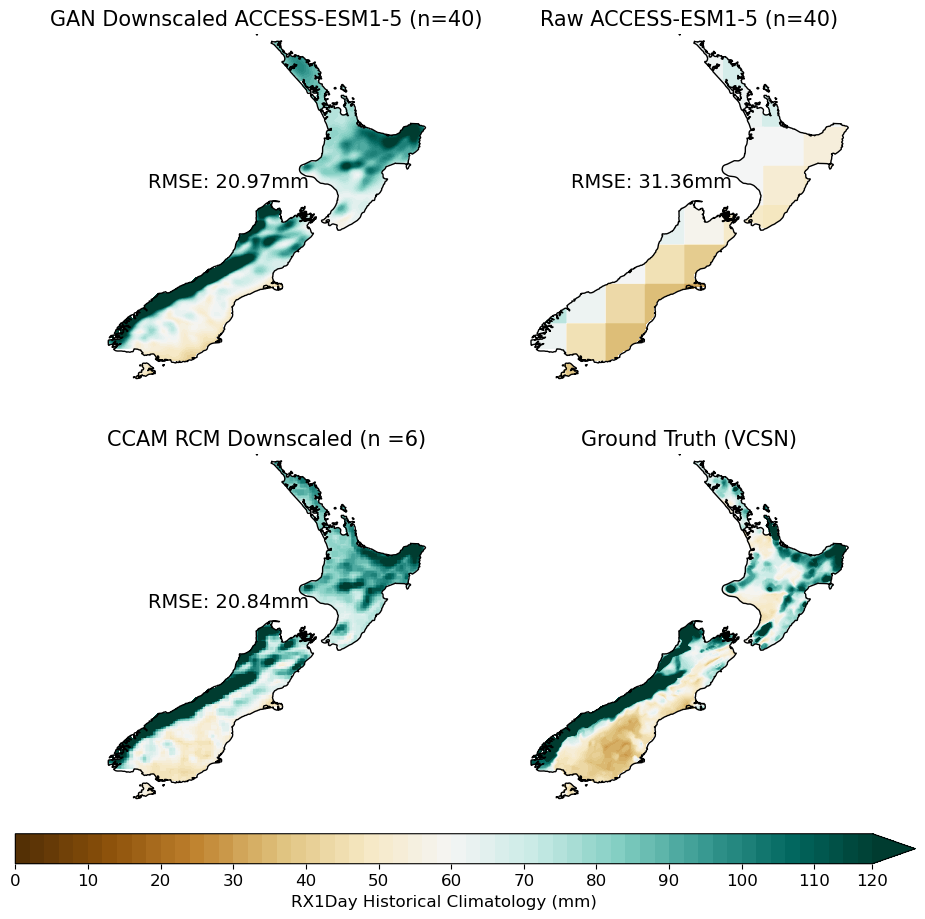

In [1228]:
levels = np.arange(0, 120, 2)
fig, ax = plt.subplots(2, 2, figsize = (10, 10), subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)))
ax = ax.ravel()
cs = rx1day_Emul.Rx1day.sel(GCM_variant = accessesm1).mean(["GCM_variant"]).plot.contourf(vmin =0, vmax =120, cmap ='BrBG', ax = ax[0], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
rx1day_gcm.mean(["GCM_variant"]).where(~(rx1day_Emul.Rx1day.isel(GCM_variant =0).isnull()), np.nan).plot.contourf(vmin =0, vmax =120, cmap ='BrBG', ax = ax[1], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
rx1day.rain_council.plot.contourf(vmin =0, vmax =120, cmap ='BrBG', ax = ax[-1], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
rx1day_ccam.mean("GCM").where(~(rx1day_Emul.Rx1day.isel(GCM_variant =0).isnull()), np.nan).plot.contourf(vmin =0, vmax =120, cmap ='BrBG', ax = ax[2], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
[ax[i].set_frame_on(False) for i in range(4)]
[ax[i].coastlines('10m') for i in range(4)]
#ax[0].text(169, -40, 'MAE: %.1f' % abs(rx1day_Emul_error).mean(), transform = ccrs.PlateCarree(), fontsize =14)
ax[0].text(
    168, -40,
    f"RMSE: {abs(rx1day_Emul_mae).mean().values:.2f}mm",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
ax[1].text(
    168, -40,
    f"RMSE: {abs(mae_ann_rx1day_).mean().values:.2f}mm",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
ax[2].text(
    168, -40,
    f"RMSE: {abs(ccam_rx1day_Emul_mae).mean().values:.2f}mm",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
#ccam_rx1day_Emul_error = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
#ccam_rx1day_Emul_mae = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
ax[0].set_title('GAN Downscaled ACCESS-ESM1-5 (n=40)', fontsize =15)
ax[1].set_title('Raw ACCESS-ESM1-5 (n=40)', fontsize =15)
ax[-1].set_title('Ground Truth (VCSN)', fontsize =15)
ax[-2].set_title('CCAM RCM Downscaled (n =6)', fontsize =15)
ax4 = fig.add_axes([0.05, 0.05, 0.9, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('RX1Day Historical Climatology (mm)', fontsize =12)
cbar.ax.tick_params(labelsize =12)
cbar.set_ticks(np.arange(0,130, 10))
#fig.tight_layout()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_added_value_rx1day.png', dpi =500, bbox_inches ='tight')
#fig.tight_layout()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_added_value_rx1day.pdf', dpi =300, bbox_inches ='tight')

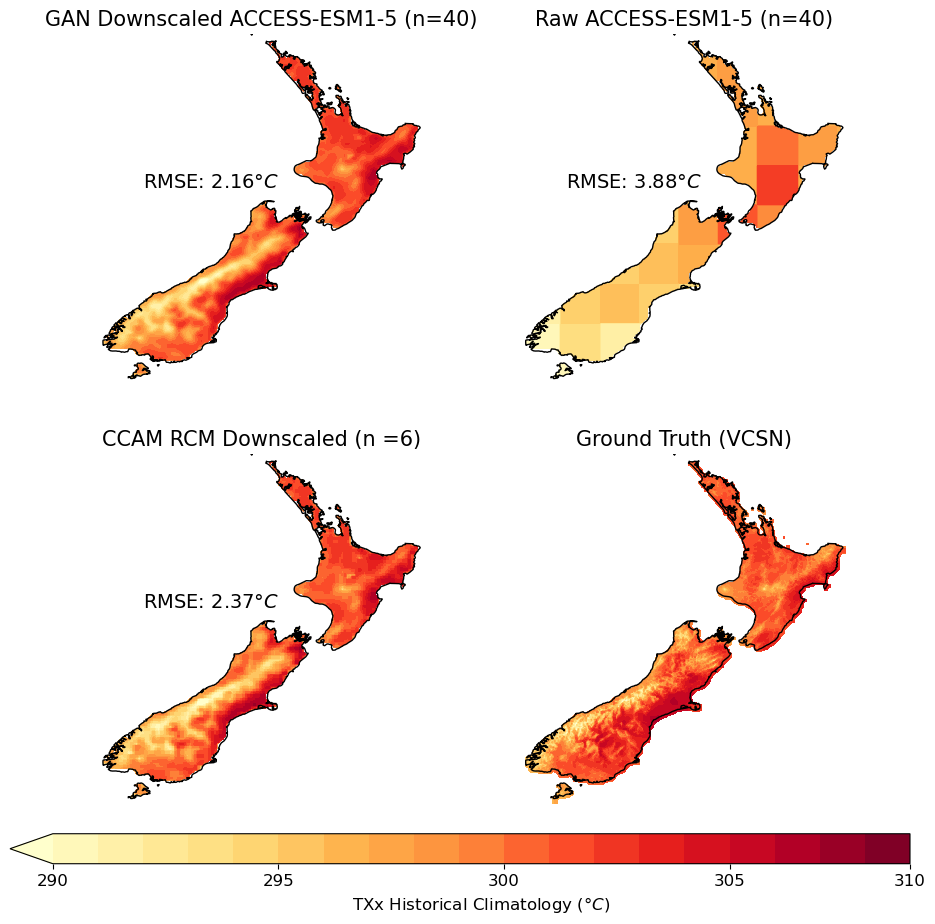

In [1227]:
levels = np.arange(290, 310, 1)
fig, ax = plt.subplots(2, 2, figsize = (10, 10), subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)))
ax = ax.ravel()
vmin = 290
cmap ='YlOrRd'
vmax = 310
cs = Txx_Emul.TXx.sel(GCM_variant = accessesm1).mean(["GCM_variant"]).plot.contourf(vmin =vmin, vmax =vmax, cmap =cmap, ax = ax[0], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
txx_gcm.mean(["GCM_variant"]).where(~(rx1day_Emul.Rx1day.isel(GCM_variant =0).isnull()), np.nan).plot.contourf(vmin =vmin, vmax =vmax, cmap =cmap, ax = ax[1], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
txx.tmax.plot.contourf(vmin =vmin, vmax =vmax, cmap =cmap, ax = ax[-1], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
txx_ccam.mean("GCM").where(~(rx1day_Emul.Rx1day.isel(GCM_variant =0).isnull()), np.nan).plot.contourf(vmin =vmin, vmax =vmax, cmap =cmap, ax = ax[2], transform = ccrs.PlateCarree(), add_colorbar = False, levels = levels )
[ax[i].set_frame_on(False) for i in range(4)]
[ax[i].coastlines('10m') for i in range(4)]
#ax[0].text(169, -40, 'MAE: %.1f' % abs(rx1day_Emul_error).mean(), transform = ccrs.PlateCarree(), fontsize =14)
ax[0].text(
    168, -40,
    f"RMSE: {abs(Txx_Emul_error).mean().values:.2f}$\degree C$",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
ax[1].text(
    168, -40,
    f"RMSE: {abs(mae_ann_txx.tmax).mean().values:.2f}$\degree C$",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
ax[2].text(
    168, -40,
    f"RMSE: {abs(ccam_txx_Emul_mae).mean().values:.2f}$\degree C$",
    transform=ccrs.PlateCarree(),
    fontsize=14
)
#ccam_rx1day_Emul_error = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
#ccam_rx1day_Emul_mae = 100 *(rx1day_ccam - rx1day.rain_council)/rx1day.rain_council
ax[0].set_title('GAN Downscaled ACCESS-ESM1-5 (n=40)', fontsize =15)
ax[1].set_title('Raw ACCESS-ESM1-5 (n=40)', fontsize =15)
ax[-1].set_title('Ground Truth (VCSN)', fontsize =15)
ax[-2].set_title('CCAM RCM Downscaled (n =6)', fontsize =15)
ax4 = fig.add_axes([0.05, 0.05, 0.9, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('TXx Historical Climatology ($\degree C$)', fontsize =12)
cbar.ax.tick_params(labelsize =12)
cbar.set_ticks(np.arange(290,315, 5))
#fig.tight_layout()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_added_value_TXX.png', dpi =500, bbox_inches ='tight')
#fig.tight_layout()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/historical_added_value_TXX.pdf', dpi =300, bbox_inches ='tight')

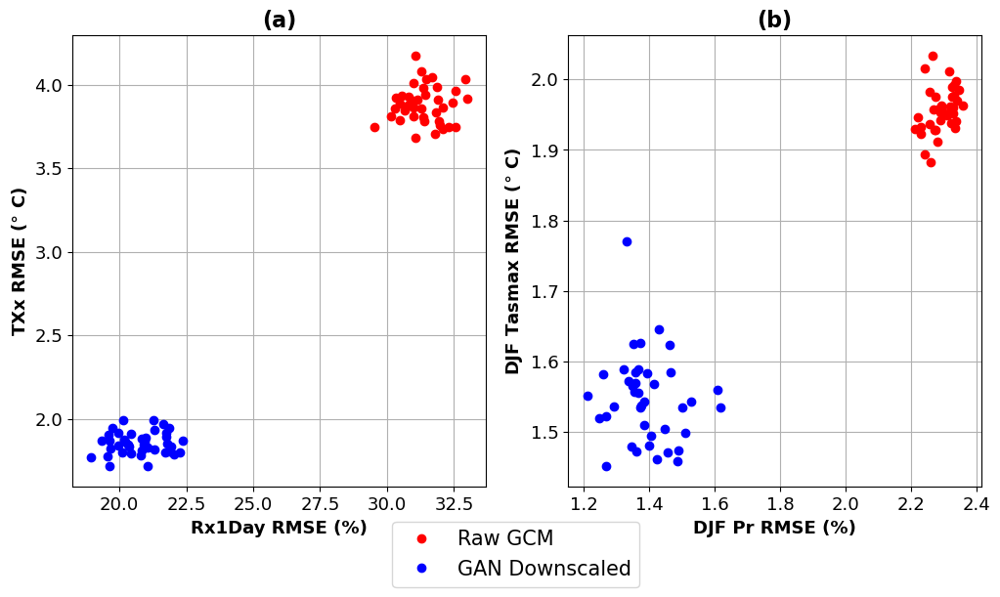

In [1229]:
fig, ax = plt.subplots(1,2, figsize = (12, 6))
ax[0].set_xlabel('Rx1Day RMSE (%)', weight ='bold', fontsize =13)
ax[0].set_ylabel('TXx RMSE ($\degree$ C)', weight ='bold', fontsize =13)
ax[1].set_xlabel('DJF Pr RMSE (%)', weight ='bold', fontsize =13)
ax[1].set_ylabel('DJF Tasmax RMSE ($\degree$ C)', weight ='bold', fontsize =13)
ax[1].plot(abs(mape_ann).mean(["latitude","longitude"]).isel(season =0).rain_council, abs(mae_ann_tasmax).mean(["latitude","longitude"]).isel(season =0).tmax,'ro', label ='Raw GCM')
ax[1].plot(abs(precip_Emul_error.sel(GCM_variant = accessesm1)).mean(["latitude","longitude"]), abs(tasmax_Emul_error.sel(GCM_variant = accessesm1)).mean(["latitude","longitude"]), 'bo', label ='GAN Downscaled')

ax[0].plot(abs(mae_ann_rx1day).mean(["latitude","longitude"]).rain_council, abs(mae_ann_txx ).mean(["latitude","longitude"]).tmax,'ro')
ax[0].plot(abs(rx1day_Emul_error.sel(GCM_variant = accessesm1)).mean(["latitude","longitude"]), abs(Txx_Emul_error .sel(GCM_variant = accessesm1)).mean(["latitude","longitude"]), 'bo')
ax[0].grid('on')
ax[1].grid('on')
ax[1].legend(loc =6, fontsize =15, bbox_to_anchor=(-0.45, -0.15))
ax[0].tick_params(labelsize =13)
ax[1].tick_params(labelsize =13)
ax[0].set_title('(a)', fontsize =16, weight ='bold')
ax[1].set_title('(b)', fontsize =16, weight ='bold')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Historical_Evaulation_Full.png', dpi =500, bbox_inches ='tight')

In [353]:
hist_signal = merged_dset.Rx1day.sel(year =slice(1986, 2005)).mean("year")
future_signal = merged_dset.Rx1day.sel(year =slice(2080, 2099)).mean("year")
cc_signal = 100 * (future_signal - hist_signal)/hist_signal

In [1648]:
hist_signal_v2 = merged_dset.Rx1day.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_v2 = merged_dset.Rx1day.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_v2 = 100 * (future_signal_v2 - hist_signal_v2)/hist_signal_v2

In [352]:
hist_signal_txx = merged_dset.TXx.sel(year =slice(1986, 2005)).mean("year")
future_signal_txx = merged_dset.TXx.sel(year =slice(2080, 2099)).mean("year")
cc_signal_txx = (future_signal_txx  - hist_signal_txx )#/hist_signal

In [1864]:
hist_signal_txx_v2 = merged_dset.TXx.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_txx_v2 = merged_dset.TXx.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_txx_v2 = (future_signal_txx_v2  - hist_signal_txx_v2 )#/hist_signal

In [798]:
hist_signal_txx = merged_dset.tasmax_seasonal_hist
future_signal_txx = merged_dset.tasmax_seasonal_future
cc_signal_tasmax_gcm = (future_signal_txx  - hist_signal_txx )#/hist_signal

In [872]:

hist_signal_em = access_esm.Rx1day.sel(year =slice(1986, 2005)).mean("year")
future_signal_em = access_esm.Rx1day.sel(year =slice(2080, 2099)).mean("year")
cc_signal_em = 100 * (future_signal_em - hist_signal_em)/hist_signal_em

In [1649]:

hist_signal_em_v2 = access_esm.Rx1day.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_em_v2 = access_esm.Rx1day.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_em_v2 = 100 * (future_signal_em_v2 - hist_signal_em_v2)/hist_signal_em_v2

In [873]:
hist_signal_em_txx = access_esm.TXx.sel(year =slice(1986, 2005)).mean("year")
future_signal_em_txx = access_esm.TXx.sel(year =slice(2080, 2099)).mean("year")
cc_signal_em_txx = (future_signal_em_txx - hist_signal_em_txx)#/hist_signal_em

In [1863]:
hist_signal_em_txx_v2 = access_esm.TXx.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_em_txx_v2 = access_esm.TXx.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_em_txx_v2 = (future_signal_em_txx_v2 - hist_signal_em_txx_v2)#/hist_signal_em

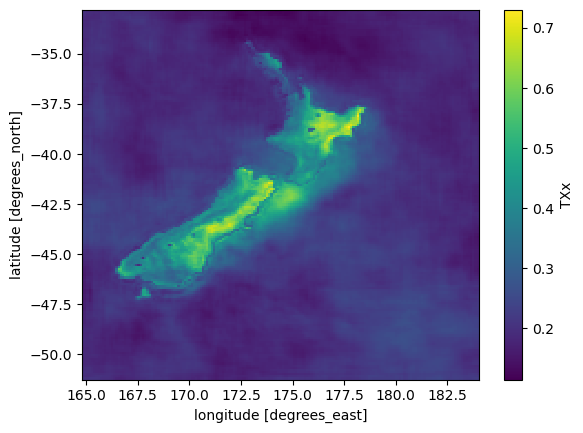

In [346]:
cc_signal_em_txx.std("GCM_variant").plot()

In [861]:
ccam_historical = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/CCAM_P_T_indicators_final.nc')

In [1610]:

hist_signal_ccam = ccam_historical.Rx1day.sel(year =slice(1986, 2005)).mean("year")
future_signal_ccam = ccam_historical.Rx1day.sel(year =slice(2080, 2099)).mean("year")
cc_signal_ccam = 100 * (future_signal_ccam - hist_signal_ccam)/hist_signal_ccam

In [1602]:

hist_signal_ccam_v2 = ccam_historical.Rx1day.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_ccam_v2 = ccam_historical.Rx1day.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_ccam_v2 = 100 * (future_signal_ccam_v2 - hist_signal_ccam_v2)/hist_signal_ccam_v2

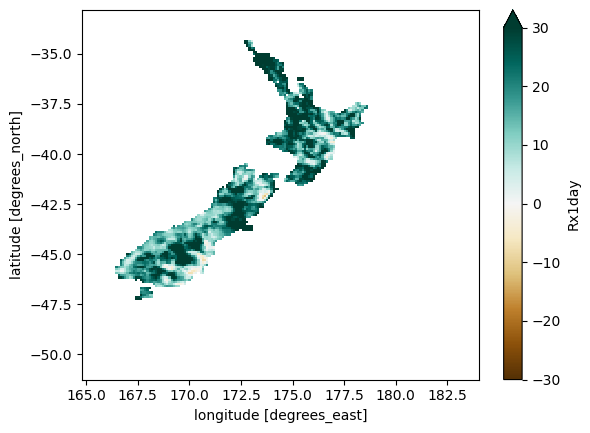

In [1613]:
cc_signal_ccam_v2.mean(["GCM"]).where(static_fields.orog>0, np.nan).plot(vmax =30, cmap ='BrBG')

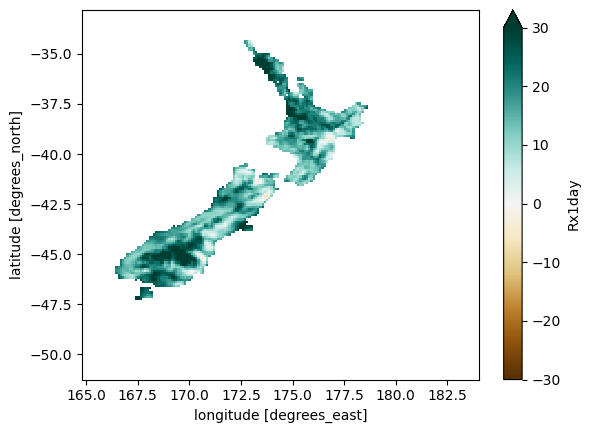

In [1612]:
cc_signal_ccam.mean(["GCM"]).where(static_fields.orog>0, np.nan).plot(vmax =30, cmap ='BrBG')

In [ ]:
hist_signal_ccam_txx = ccam_historical.TXx.sel(year =slice(1986, 2005)).mean("year")
future_signal_ccam_txx = ccam_historical.TXx.sel(year =slice(2080, 2099)).mean("year")
cc_signal_ccam_txx = (future_signal_ccam_txx - hist_signal_ccam_txx)#/hist_signal_ccam

In [1608]:
hist_signal_ccam_txx = ccam_historical.TXx.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_ccam_txx = ccam_historical.TXx.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_ccam_txx_v2 = (future_signal_ccam_txx - hist_signal_ccam_txx)#/hist_signal_ccam

In [885]:

hist_signal_ccam = ccam_historical.seasonal_tasmax_hist
future_signal_ccam = ccam_historical.seasonal_tasmax_future
cc_signal_ccam_tasmax =  (future_signal_ccam - hist_signal_ccam)#/hist_signal_ccam

In [886]:
hist_signal_ccam_txx = ccam_historical.TXx.sel(year =slice(1986, 2005)).mean("year")
future_signal_ccam_txx = ccam_historical.TXx.sel(year =slice(2080, 2099)).mean("year")
cc_signal_ccam_txx = (future_signal_ccam_txx - hist_signal_ccam_txx)#/hist_signal_ccam

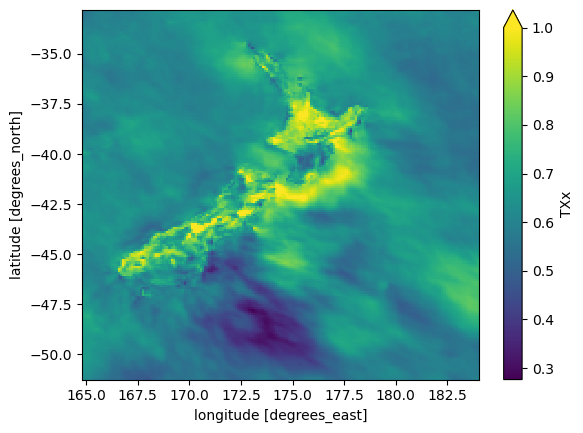

In [878]:
cc_signal_ccam_txx.std("GCM").plot(vmax =1)

In [235]:
list_of_gcms = ['CNRM-CM6-1_r1i1p1f2', 'UKESM1-0-LL_r1i1p1f2',
       'GISS-E2-1-G_r1i1p1f2', 'IITM-ESM_r1i1p1f1', 'CanESM5_r1i1p1f1',
       'INM-CM5-0_r1i1p1f1', 'INM-CM4-8_r1i1p1f1', 'TaiESM1_r1i1p1f1',
       'EC-Earth3-Veg-LR_r1i1p1f1', 'EC-Earth3_r1i1p1f1',
       'EC-Earth3-Veg_r1i1p1f1', 'CMCC-ESM2_r1i1p1f1', 'CMCC-CM2-SR5_r1i1p1f1',
       'ACCESS-ESM1-5_r1i1p1f1', 'ACCESS-CM2_r4i1p1f1', 'IPSL-CM6A-LR_r1i1p1f1',
       'NorESM2-LM_r1i1p1f1', 'NorESM2-MM_r1i1p1f1', 'MPI-ESM1-2-LR_r1i1p1f1',
       'MPI-ESM1-2-HR_r1i1p1f1']

In [879]:
multi_model_ensemble = AI_indicators.sel(GCM_variant = list_of_gcms)

hist_signal_mme = multi_model_ensemble.Rx1day.sel(year =slice(1986, 2005)).mean("year")
future_signal_mme = multi_model_ensemble.Rx1day.sel(year =slice(2080, 2099)).mean("year")
cc_signal_mme = 100 * (future_signal_mme - hist_signal_mme)/hist_signal_mme

In [1650]:
multi_model_ensemble = AI_indicators.sel(GCM_variant = list_of_gcms)

hist_signal_mme_v2 = multi_model_ensemble.Rx1day.rolling(year =10).max().sel(year =slice(1986, 2005)).mean("year")
future_signal_mme_v2 = multi_model_ensemble.Rx1day.rolling(year =10).max().sel(year =slice(2080, 2099)).mean("year")
cc_signal_mme_v2 = 100 * (future_signal_mme_v2 - hist_signal_mme_v2)/hist_signal_mme_v2

In [880]:
#multi_model_ensemble = AI_indicators.sel(GCM_variant = list_of_gcms)

hist_signal_mme_txx = multi_model_ensemble.TXx.sel(year =slice(1986, 2005)).mean("year")
future_signal_mme_txx = multi_model_ensemble.TXx.sel(year =slice(2080, 2099)).mean("year")
cc_signal_mme_txx = (future_signal_mme_txx - hist_signal_mme_txx)#/hist_signal_mme

In [795]:
multi_model_ensemble 

<xarray.Dataset>
Dimensions:                 (GCM_variant: 20, year: 152, lat: 172, lon: 179, season: 4)
Coordinates:
  * GCM_variant             (GCM_variant) object 'CNRM-CM6-1_r1i1p1f2' ... 'M...
  * year                    (year) int64 1950 1951 1952 1953 ... 2098 2099 2100
  * lon                     (lon) float32 164.9 165.0 165.1 ... 183.9 184.0
  * lat                     (lat) float32 -51.21 -51.11 -51.0 ... -32.97 -32.86
    GCM                     (GCM_variant) object 'CNRM-CM6-1' ... 'MPI-ESM1-2...
  * season                  (season) object 'DJF' 'JJA' 'MAM' 'SON'
    scenario                (year) object 'historical' 'historical' ... 'ssp370'
Data variables:
    Rx1day                  (GCM_variant, year, lat, lon) float64 ...
    seasonal_pr_hist        (GCM_variant, season, lat, lon) float64 ...
    seasonal_pr_future      (GCM_variant, season, lat, lon) float64 ...
    TXx                     (GCM_variant, year, lat, lon) float64 ...
    seasonal_tasmax_hist    (GCM_variant, season, lat, lon) float64 ...
    seasonal_tasmax_future  (GCM_variant, season, lat, lon) float64 ...
    CC_signal               (GCM_variant, season, lat, lon) float64 9.479 ......
    CC_signal_tasmax        (GCM_variant, season, lat, lon) float64 1.934 ......

In [870]:

hist_signal_mme_txx = multi_model_ensemble.seasonal_tasmax_hist
future_signal_mme_txx = multi_model_ensemble.seasonal_tasmax_future
cc_signal_mme_tasmax = (future_signal_mme_txx - hist_signal_mme_txx)#/hist_signal_mme

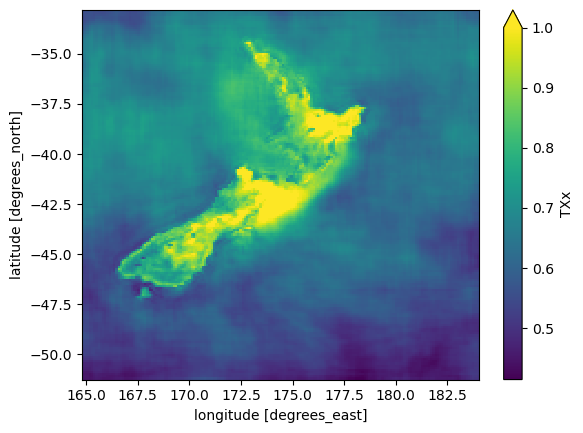

In [350]:
cc_signal_mme_txx.std("GCM_variant").plot(vmax =1)

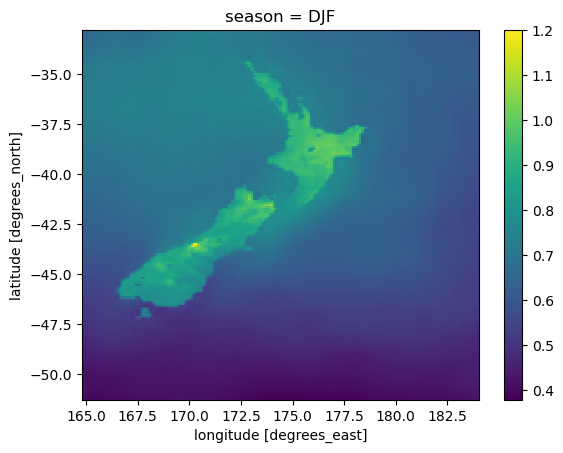

In [881]:
cc_signal_mme_tasmax.std("GCM_variant").sel(season ='DJF').plot(vmax =1.2)

In [887]:
cc_signal_ccam_tasmax.isel(season =0
                          ).where(static_fields.orog>0, np.nan).mean(["lat","lon"])#.plot(vmin =2, vmax =4, cmap ='YlOrRd')#.std("GCM").sel(season ='DJF').plot()

<xarray.DataArray (GCM: 6)>
array([4.6657515, 3.3787224, 4.25676  , 4.004622 , 3.7535417, 2.722133 ],
      dtype=float32)
Coordinates:
  * GCM      (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
    season   <U3 'DJF'

In [1647]:
cc_signal_ccam_v2

<xarray.DataArray 'Rx1day' (GCM: 6, lat: 172, lon: 179)>
array([[[ 1.41713372e+01,  1.42236182e+01,  1.38733523e+01, ...,
         -1.32283202e+01, -1.54541344e+01, -1.18687134e+01],
        [ 1.47346183e+01,  1.66116729e+01,  9.63097954e+00, ...,
         -1.16777856e+01, -1.87036843e+01, -8.19321196e+00],
        [ 1.43817911e+01,  1.62117194e+01,  1.67247912e+01, ...,
         -1.25531421e+01, -2.42160120e+01, -1.20870334e+01],
        ...,
        [ 1.80123115e+01,  4.81690100e+01,  9.20316010e+01, ...,
          2.08287126e+01,  3.16084427e+01,  6.86603691e+01],
        [ 4.53735090e+01,  4.11308688e+01,  7.90363509e+01, ...,
         -1.19802970e+01, -1.10999278e+00,  3.54353463e+01],
        [ 7.73642598e+01,  8.38081291e+01,  1.13255048e+02, ...,
         -2.83607517e+01, -4.12842656e+00, -1.83142191e+01]],

       [[-1.69274284e+01, -2.01472252e+01, -2.30101309e+01, ...,
         -2.04401571e+00, -2.31854998e+00,  2.81198023e+01],
        [-2.29657452e+01, -2.52831648e+01, -2.65674360e+01, ...,
          1.03489028e+01,  1.36176537e+01,  1.17081090e+01],
        [-2.38874560e+01, -2.57942443e+01, -2.66695694e+01, ...,
          5.06179070e+00,  6.29649662e+00,  8.82857002e+00],
...
        [ 5.91157831e+01,  7.89374538e+01,  6.91772588e+01, ...,
          6.22193173e+01,  5.66641067e+01,  5.17523384e+01],
        [ 5.66669752e+01,  7.10532995e+01,  5.98859505e+01, ...,
          7.67129344e+01,  5.73794767e+01,  4.27399598e+01],
        [ 4.26675853e+01,  5.02562682e+01,  5.29307504e+01, ...,
          4.54108789e+01,  3.75296227e+01,  1.37050469e+01]],

       [[ 4.79233629e+01,  5.71425359e+01,  6.25005500e+01, ...,
         -4.66637666e+00, -1.92551294e-02,  8.33818551e+00],
        [ 5.16542135e+01,  5.73977573e+01,  5.85785069e+01, ...,
         -6.06876009e+00,  2.21748627e+00, -2.59481237e+00],
        [ 5.52483641e+01,  5.42534010e+01,  4.70045353e+01, ...,
         -4.94447340e+00, -8.22865041e+00, -9.94138805e+00],
        ...,
        [ 4.94818278e+00, -2.73329828e+01, -3.42809183e+01, ...,
          2.74169593e+01,  2.88113393e+01,  1.62162575e+01],
        [ 6.48989961e+00, -2.76398141e+00, -1.45451871e+01, ...,
          1.45777687e+01,  1.56017655e+01, -9.12912736e+00],
        [ 1.61667514e+01,  9.97052561e+00,  1.04267082e+01, ...,
         -2.13870193e-01,  1.90278052e+00, -2.88707449e+01]]])
Coordinates:
  * GCM      (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
  * lon      (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat      (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86

In [17]:
static_fields = xr.open_dataset(r'/nesi/project/niwa03712/group_shared/Emulator_training_data/ERA5_eval_ccam_12km.198110_NZ_Invariant.nc')

In [1770]:
stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) < threshold)

In [1767]:
import numpy as np

def create_df(lat, lon, season ='DJF'):
    df1 = pd.DataFrame()
    # V1
    
    access_arr = cc_signal_em_v2.interp(lat=lat, lon=lon).values.flatten()
    df1.loc[:len(access_arr)-1, '    GAN \nACCESS-ESM1-5 \n   (n=40)'] = access_arr
    df1['Metric'] = 'Rx[10 year]'
    df1 = df1.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df2 = pd.DataFrame()
    #V2
    access_seasonal =  cc_signal_em.interp(lat=lat, lon=lon).values.flatten()
    df2.loc[:len(access_seasonal)-1  , '    GAN \nACCESS-ESM1-5 \n   (n=40)'] = access_seasonal
    df2['Metric'] = 'Rx1Day'
    df2 = df2.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V3
    df3 = pd.DataFrame()
    other_gcms = cc_signal_mme_v2.interp(lat=lat, lon=lon).values.flatten()
    df3.loc[:len(other_gcms)-1, "GAN \nCMIP6 \n(n=18)"] = other_gcms
    df3['Metric'] = 'Rx[10 year]'
    df3 = df3.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V4
    df4 = pd.DataFrame()
    other_gcms = cc_signal_mme.interp(lat=lat, lon=lon).values.flatten()
    df4.loc[:len(other_gcms)-1, "GAN \nCMIP6 \n(n=18)"] = other_gcms
    df4['Metric'] = 'Rx1Day'
    df4 = df4.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V5
    df5 = pd.DataFrame()
    canesm_arr = cc_signal_v2.interp(lat=lat, lon=lon).values.flatten()
    df5.loc[:len(canesm_arr)-1, '  Raw \nACCESS-ESM1-5 \n   (n=40)'] = canesm_arr
    df5['Metric'] = 'Rx[10 year]'
    df5 = df5.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    #V6
    
    df6 = pd.DataFrame()
    canesm_arr2 = cc_signal.interp(lat=lat, lon=lon).values.flatten()
    df6.loc[:len(canesm_arr2)-1, '  Raw \nACCESS-ESM1-5 \n   (n=40)'] = canesm_arr2
    df6['Metric'] = 'Rx1Day'
    df6 = df6.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df7 = pd.DataFrame()
    ccam_arr = cc_signal_ccam_v2.interp(lat=lat, lon=lon).values.flatten()
    df7.loc[:len(ccam_arr)-1, 'CCAM \n(n=6)'] = ccam_arr
    df7['Metric'] = 'Rx[10 year]'
    df7 = df7.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df8 = pd.DataFrame()
    ccam_arr =  cc_signal_ccam.interp(lat=lat, lon=lon).values.flatten()
    df8.loc[:len(ccam_arr)-1, 'CCAM \n(n=6)'] = ccam_arr
    df8['Metric'] = 'Rx1Day'
    df8 = df8.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df = pd.concat([df1, df2, df5, df6,df3,df4, df7,df8])
    

    return df

In [1698]:
regions = {'Auckland': (-36.7928, 174.6131),
 'Tauranga': (-37.6870, 176.1654),
 'New Plymouth': (-39.0572, 174.0794),
 'Nelson': (-41.2732,  173.2854),
 'Christchurch': (-43.5320, 172.6366),
 'Milford Sound': (-44.6414, 167.8974),
 'Napier': (-39.4893, 176.9192)}

regions = {'Auckland': (-36.7928, 174.6131),
 'Wellington': (-41.2924, 174.7787),
 'Christchurch': (-43.5320, 172.6366),
 'Milford Sound': (-44.6414, 167.8974)}

offsets = {'Auckland': (0.1, -0.2),
 'Tauranga': (0.07, 0.025),
 'New Plymouth': (0.05, -0.15),
 'Nelson': (0.0,  -0.15),
 'Christchurch': (-0.12, 0.13),
 'Milford Sound': (0.08, -0.05),
 'Napier': (-0.17, 0.02)}

offsets = {'Auckland': (0.1, -0.02),
 'Tauranga': (0.07, 0.025),
 'Wellington': (0.0, -0.32),
 'Nelson': (0.0,  -0.15),
 'Christchurch': (-0.22, 0.15),
 'Milford Sound': (-0.3, -0.03),
 'Napier': (-0.17, 0.02)}

offset_lon = [-0.25,0.15,-0.15, -0.25, -0.35, +0.25, 0.00]
offset_lat = [0,0,0.0, -0.15,0,0,-0.15]
#offset_lat = [0.0,0.0 

In [1777]:
df

,Metric,GCM Variant,CC Signal
0,Rx[10 year],GAN \nACCESS-ESM1-5 \n (n=40),-2.462564
1,Rx[10 year],GAN \nACCESS-ESM1-5 \n (n=40),-4.942936
2,Rx[10 year],GAN \nACCESS-ESM1-5 \n (n=40),36.365300
3,Rx[10 year],GAN \nACCESS-ESM1-5 \n (n=40),42.867053
4,Rx[10 year],GAN \nACCESS-ESM1-5 \n (n=40),9.905801
...,...,...,...
1,Rx1Day,CCAM \n(n=6),11.799576
2,Rx1Day,CCAM \n(n=6),48.998940
3,Rx1Day,CCAM \n(n=6),46.656359
4,Rx1Day,CCAM \n(n=6),10.429351


In [1797]:
cc_signal_v2.var("GCM_variant")

<xarray.DataArray 'Rx1day' (lat: 172, lon: 179)>
array([[438.3452 , 438.3452 , 438.3452 , ..., 429.35553, 429.35553,
        429.35553],
       [458.03726, 458.03726, 458.03726, ..., 591.80615, 591.80615,
        591.80615],
       [458.03726, 458.03726, 458.03726, ..., 591.80615, 591.80615,
        591.80615],
       ...,
       [442.57742, 442.57742, 442.57742, ..., 421.98914, 421.98914,
        421.98914],
       [442.57742, 442.57742, 442.57742, ..., 421.98914, 421.98914,
        421.98914],
       [442.57742, 442.57742, 442.57742, ..., 421.98914, 421.98914,
        421.98914]], dtype=float32)
Coordinates:
    height    float64 2.0
    height_2  float64 10.0
  * lat       (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
  * lon       (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0

/home/rampaln/.local/lib/python3.8/site-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)
/home/rampaln/.local/lib/python3.8/site-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)
/home/rampaln/.local/lib/python3.8/site-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)


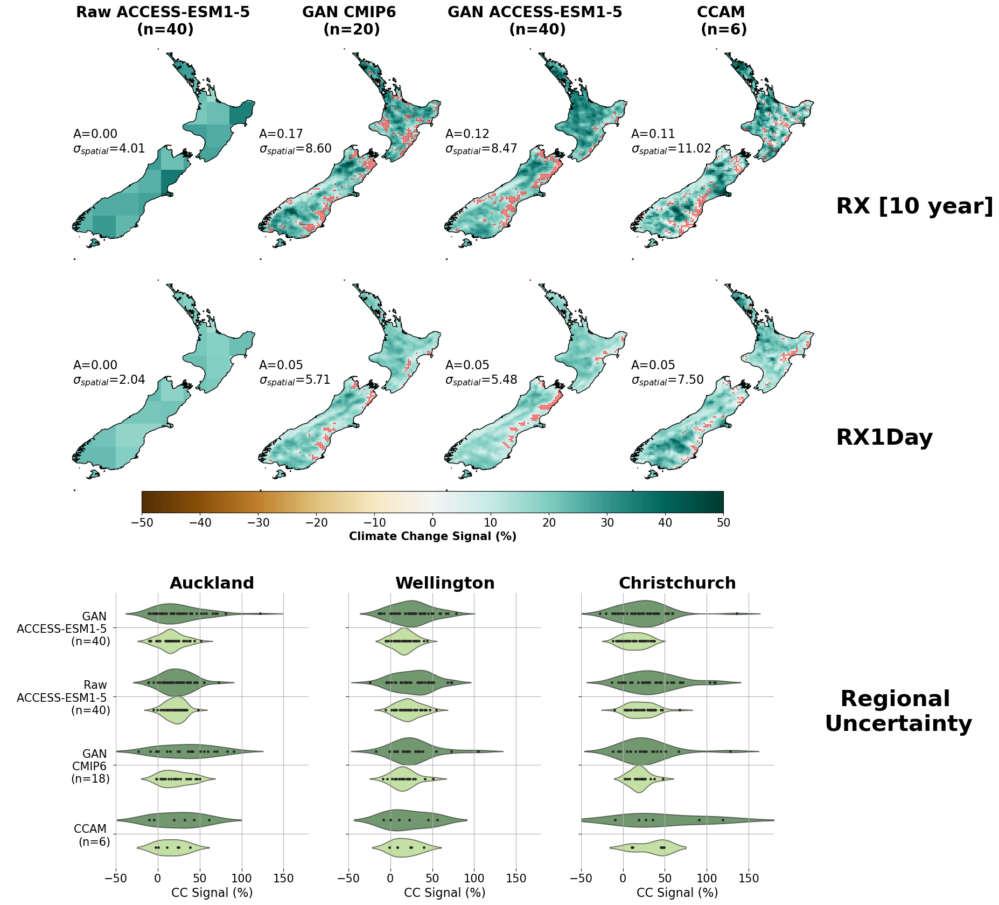

In [1803]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fig = plt.figure(figsize=(18, 20))
gs = gridspec.GridSpec(18, 16, wspace=-0.13, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))

ax0 = fig.add_subplot(gs[:5, 0:4], **projections)
ax1 = fig.add_subplot(gs[:5, 4:8], **projections)
ax2 = fig.add_subplot(gs[:5, 8:12], **projections)
ax3 = fig.add_subplot(gs[:5, 12:16], **projections)
axes = [ax0, ax1, ax2, ax3]

ax3.text(180,-45, 'RX [10 year]', weight ='bold', fontsize =30, rotation =0, transform = ccrs.PlateCarree())

ax00 = fig.add_subplot(gs[5:10, 0:4], **projections)
ax11 = fig.add_subplot(gs[5:10, 4:8], **projections)
ax22 = fig.add_subplot(gs[5:10, 8:12], **projections)
ax33 = fig.add_subplot(gs[5:10, 12:16], **projections)

ax33.text(180,-45, 'RX1Day', weight ='bold', fontsize =30, rotation =0, transform = ccrs.PlateCarree())
axes_ = [ax00, ax11, ax22, ax33]
vmin, vmax = -50, 50
levels = np.arange(vmin, vmax + 0.5, 0.5)
threshold = 4/6
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='BrBG'):
    mean_signal = signal.mean(groupby).where(static_fields.orog > 0, np.nan)
    spatial_variance = mean_signal.stack(z = ['lat','lon']).std("z").values
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize =20)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)


    agreement = (signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    agreement2 = (signal <= 0).sum(groupby[0]) / signal[groupby[0]].size
    agreement = xr.concat([agreement, agreement2], dim ="axes").max("axes")
    stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) < threshold)
    lons, lats = np.meshgrid(signal.lon, signal.lat)
    ax.scatter(lons[stippling_mask], lats[stippling_mask], color='r', s=4.0, 
               transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    A = len(stippling_mask[0]) / total_land_pixels
    ax.text(166.5, -41, f'A={"%.2f" % A}\n' + '$\sigma_{spatial}$'+ f'={"%.2f" % spatial_variance}', transform=ccrs.PlateCarree(), fontsize=16, zorder =13)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return cs
# Plotting each panel
plot_panel(axes[0], cc_signal_v2, 'Raw ACCESS-ESM1-5 \n(n=40)', ['GCM_variant'])
plot_panel(axes[1], cc_signal_mme_v2, 'GAN CMIP6 \n(n=20)', ['GCM_variant'])
plot_panel(axes[2], cc_signal_em_v2, 'GAN ACCESS-ESM1-5 \n(n=40)', ['GCM_variant'])
cs = plot_panel(axes[3], cc_signal_ccam_v2, 'CCAM \n(n=6)', ['GCM'])


plot_panel(axes_[0], cc_signal, '', ['GCM_variant'])
plot_panel(axes_[1], cc_signal_mme, '', ['GCM_variant'])
plot_panel(axes_[2], cc_signal_em, '', ['GCM_variant'])
cs = plot_panel(axes_[3], cc_signal_ccam, '', ['GCM'])
ax4 = fig.add_axes([0.2, 0.44, 0.6, 0.02])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('Climate Change Signal (%)', weight ='bold', fontsize =15)
cbar.set_ticks(np.arange(-50, 60, 10))
cbar.ax.tick_params(labelsize =15)
# Set shared extent for last panel
ax00_ = fig.add_subplot(gs[12:, 1:5])
ax11_ = fig.add_subplot(gs[12:, 6:10])
ax22_ = fig.add_subplot(gs[12:, 11:15])
#ax33_ = fig.add_subplot(gs[12:, 12:15])


axes__ = [ax00_, ax11_, ax22_]#, ax33_]
index =0
for region, (lat, lon) in regions.items():
    df = create_df(lat, lon)
    ax_violin = axes__[index]

#     sns.boxplot(
# data=df.reset_index(), y="GCM Variant", x="CC Signal",
# ax=ax_violin, palette=cb_colors, hue ="Metric", legend = False
# )
        
    sns.violinplot(
    data=df.reset_index(), y="GCM Variant", x="CC Signal",
    ax=ax_violin, palette=cb_colors,alpha =0.65, inner ='point', hue ="Metric", legend = False, split =False
)#inner="box"
    #sns.swarmplot(y="GCM Variant", x="CC Signal",hue ='Metric', data=df, color='k', alpha=0.35, palette=cb_colors, split =False)
    #
    #x_violin.
    #ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    #ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("CC Signal (%)", fontsize =16)
    ax_violin.set_title(region, fontsize=22, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    ax_violin.set_frame_on(False)
    #ax_violin.set_ylabel('', fontsize =8)
    _ = ax_violin.set_ylabel(' ', fontsize =12)
    ax_violin.tick_params(labelsize =15
                         )
    ax_violin.set_xlim(-50, 180)
    if index>0:
        #ax_violin.set_yticks([])
        ax_violin.set_yticklabels([])
    index+=1


legend_labels = ["Rx [10 year]", "Rx1day"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]
ax22_.text(240,1.5, '  Regional \nUncertainty', weight ='bold', fontsize =30, rotation =0)
# Add legend to figure
#fig.legend(handles=patches, loc="lower center",fontsize =13, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.02))

#plt.tight_layout()
#plt.show()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure4_RX1Day_max_region_uncertainty_v2.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure4_RX1Day_max_uncertainty_v2.pdf', dpi =300, bbox_inches ='tight')

# Plots to Do

1. The above bit tidy the internal variability at reginoal scales bit
2. Hawkins and Sutton, but for TXX and RX1Day at start and end of century
3. Hottest and coldest ensemble members, but also showing ensemble variance in the GCM and in the AI

Thats it!

In [ ]:
cc_signal_v2
cc_signal_mme_v2
cc_signal_em_v2
cc_signal_ccam_v2

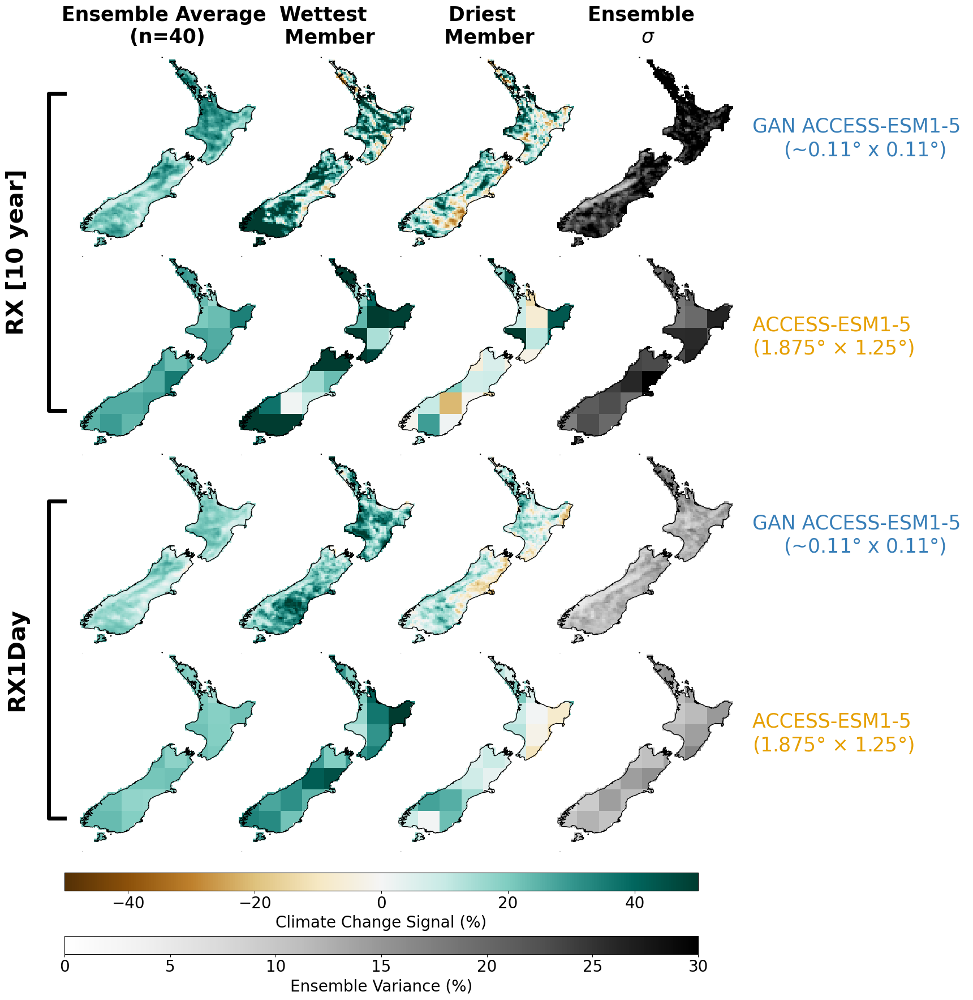

In [ ]:
wettest_r10 = np.argmax(cc_signal_em_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest_r10 = np.argmin(cc_signal_em_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)


wettest_r10_gcm = np.nanargmax(cc_signal_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest_r10_gcm = np.nanargmin(cc_signal_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)


wettest_gcm = np.nanargmax(cc_signal.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest_gcm = np.nanargmin(cc_signal.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
wettest = np.argmax(cc_signal_em.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest = np.argmin(cc_signal_em.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)

fig, ax = plt.subplots(4,4, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (14, 16),sharex=True,sharey=True)
#hillshade_dset.hillshade.plot(ax = ax[0,0], cmap ='Greys_r', alpha =0.25, levels =50, zorder =4, add_colorbar =False, transform =ccrs.PlateCarree())
vmin =-50
vmax =50
cc_signal_em_v2.where(static_fields.orog>0, np.nan).mean("GCM_variant").plot(ax = ax[0,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', zorder =3, alpha =1, vmin =vmin, vmax =vmax)
cc_signal_v2.mean("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[1,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cs22 = cc_signal_em_v2.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[0,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =30)
cc_signal_em.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[-2,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =30)

cc_signal_em_v2.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest_r10).plot(ax = ax[0,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
#cc_signal_v2.sel(GCM_variant = cc_signal_em_v2.GCM_variant.values[wettest_r10]).where(static_fields.orog>0, np.nan).plot(ax = ax[1,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal_v2.isel(GCM_variant = wettest_r10_gcm).where(static_fields.orog>0, np.nan).plot(ax = ax[1,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal_v2.isel(GCM_variant = driest_r10_gcm).where(static_fields.orog>0, np.nan).plot(ax = ax[1,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)

#cc_signal_v2.sel(GCM_variant = cc_signal_em_v2.GCM_variant.values[driest_r10]).where(static_fields.orog>0, np.nan).plot(ax = ax[1,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal_em_v2.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest_r10).plot(ax = ax[0,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal_v2.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[1,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =30)
cc_signal.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[-1,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =30)


cc_signal_em.where(static_fields.orog>0, np.nan).mean("GCM_variant").plot(ax = ax[2,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cs1 = cc_signal_em.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest).plot(ax = ax[2,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal_em.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest).plot(ax = ax[2,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax = vmax)
#cc_signal.sel(GCM_variant = cc_signal_em.GCM_variant.values[wettest]).where(static_fields.orog>0, np.nan).plot(ax = ax[3,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal.mean("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[3,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)
cc_signal.isel(GCM_variant = wettest_gcm).where(static_fields.orog>0, np.nan).plot(ax = ax[3,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax =vmax)

cc_signal.isel(GCM_variant = driest_gcm).where(static_fields.orog>0, np.nan).where(static_fields.orog>0, np.nan).plot(ax = ax[3,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax=vmax)

#cc_signal.sel(GCM_variant = cc_signal_em.GCM_variant.values[driest]).where(static_fields.orog>0, np.nan).where(static_fields.orog>0, np.nan).plot(ax = ax[3,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =vmin, vmax=vmax)
[ax[i,j].set_title(' ') for i in range(4) for j in range(4)]
[ax[i,j].set_frame_on(False) for i in range(4) for j in range(4)]
ax[0,0].set_extent([165, 180, -48, -33.5], crs = ccrs.PlateCarree())
ax[0,0].set_title('Ensemble Average \n(n=40)', fontsize =25, weight ='bold')
ax[0,1].set_title('Wettest \n Member', fontsize =25, weight ='bold')
ax[0,2].set_title('Driest \n Member', fontsize =25, weight ='bold')
ax[0,3].set_title('Ensemble \n $\sigma$', fontsize =25, weight ='bold')

[ax[i,j].coastlines('10m', zorder =8) for i in range(4) for j in range(4)]

# Remove extra space


# Add text label ("JJA") on the left
fig.text(-0.01, 0.5 + (0.85 - 0.5)/2, "RX [10 year]", fontsize=30, va='center', ha='center', weight ='bold', rotation =90)

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.85, 0.85, 0.5, 0.5]  # Y-coordinates
ax5 = fig.add_axes([0, 0.5, 0.05, 0.4])

ax5.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax5.set_frame_on(False)
ax5.set_yticks([])
ax5.set_xticks([])


gan_color = "#377EB8"  # Blue for GAN ACCESS-ESM1-5
esm_color = "#E69F00"  # Orange for ACCESS-ESM1-5

fig.text(-0.01, 0.05 + (0.4 - 0.05)/2, "RX1Day", fontsize=30, va='center', ha='center', weight ='bold', rotation =90)

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.4, 0.4, 0.05, 0.05]  # Y-coordinates
ax6 = fig.add_axes([0, 0.05, 0.05, 0.4])

ax6.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax6.set_frame_on(False)
ax6.set_yticks([])
ax6.set_xticks([])
ax[0,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
plt.subplots_adjust(left=0.0125, right=0.95, top=0.9, bottom=0.0125, wspace=-0.4, hspace=-0.05)
ax[1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax[2,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
ax[-1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax7 = fig.add_axes([0.05, -0.03, 0.8, 0.02])
cbar = fig.colorbar(cs1, cax = ax7, orientation = 'horizontal')
cbar.set_label('Climate Change Signal (%)', fontsize =20)
cbar.ax.tick_params(labelsize =20)


ax8 = fig.add_axes([0.05, -0.1, 0.8, 0.02])
cbar2 = fig.colorbar(cs22, cax = ax8, orientation = 'horizontal')
cbar2.set_label('Ensemble Variance (%)', fontsize =20)
cbar2.ax.tick_params(labelsize =20)
#fig.tight_layout()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots_extreme.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots_extreme.pdf', dpi =300, bbox_inches ='tight')

In [1865]:
wettest_r10 = np.argmax(cc_signal_em_txx_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest_r10 = np.argmin(cc_signal_em_txx_v2.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
wettest = np.argmax(cc_signal_em_txx.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)
driest = np.argmin(cc_signal_em_txx.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).values)

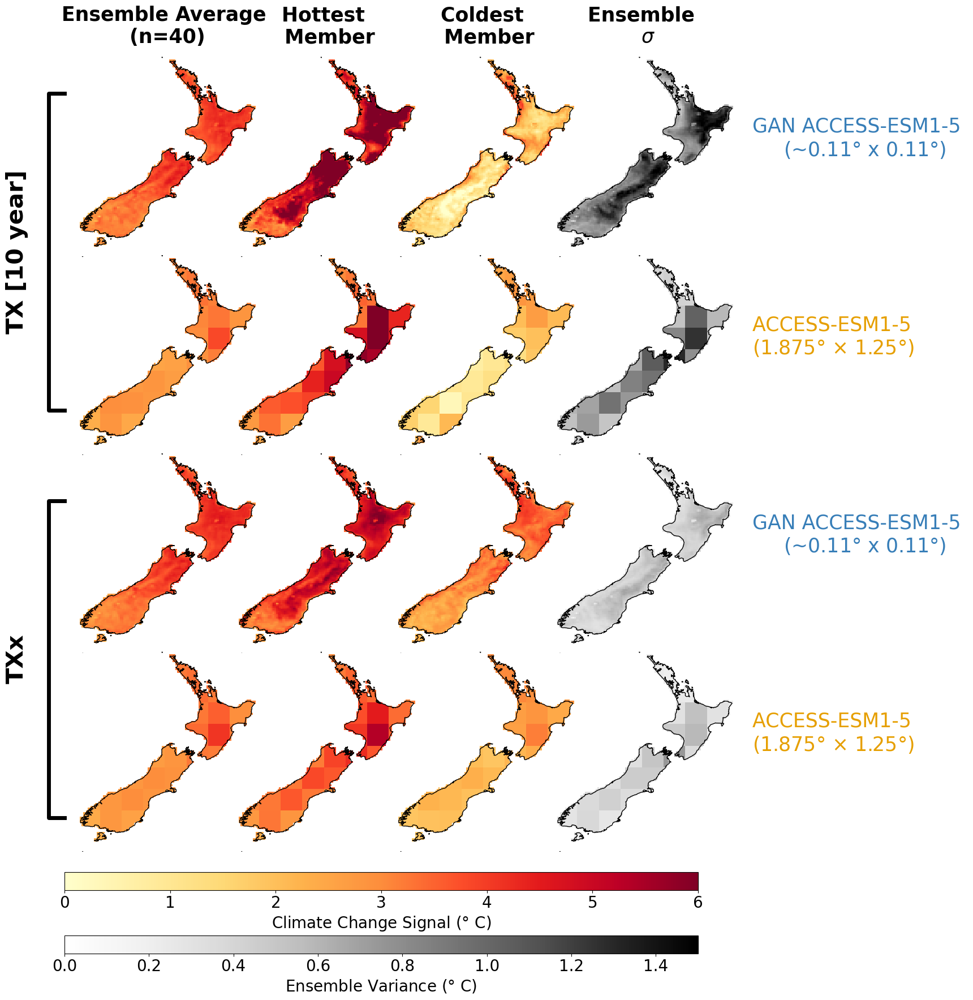

In [1877]:


fig, ax = plt.subplots(4,4, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (14, 16),sharex=True,sharey=True)
#hillshade_dset.hillshade.plot(ax = ax[0,0], cmap ='Greys_r', alpha =0.25, levels =50, zorder =4, add_colorbar =False, transform =ccrs.PlateCarree())
vmin =0
vmax =6
cmap = 'YlOrRd'
cc_signal_em_txx_v2.where(static_fields.orog>0, np.nan).mean("GCM_variant").plot(ax = ax[0,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, zorder =3, alpha =1, vmin =vmin, vmax =vmax)
cc_signal_txx_v2.mean("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[1,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cs22 = cc_signal_em_txx_v2.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[0,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =1.5)
cc_signal_em_txx.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[-2,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =1.5)

cc_signal_em_txx_v2.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest_r10).plot(ax = ax[0,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_txx_v2.sel(GCM_variant = cc_signal_em_txx_v2.GCM_variant.values[wettest_r10]).where(static_fields.orog>0, np.nan).plot(ax = ax[1,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)

cc_signal_txx_v2.sel(GCM_variant = cc_signal_em_txx_v2.GCM_variant.values[driest_r10]).where(static_fields.orog>0, np.nan).plot(ax = ax[1,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_em_txx_v2.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest_r10).plot(ax = ax[0,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_txx_v2.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[1,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =1.5)
cc_signal_txx.std("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[-1,-1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='Greys', vmin =0, vmax =1.5)


cc_signal_em_txx.where(static_fields.orog>0, np.nan).mean("GCM_variant").plot(ax = ax[2,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cs1 = cc_signal_em_txx.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest).plot(ax = ax[2,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_em_txx.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest).plot(ax = ax[2,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax = vmax)
cc_signal_txx.sel(GCM_variant = cc_signal_em_txx.GCM_variant.values[wettest]).where(static_fields.orog>0, np.nan).plot(ax = ax[3,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_txx.mean("GCM_variant").where(static_fields.orog>0, np.nan).plot(ax = ax[3,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax =vmax)
cc_signal_txx.sel(GCM_variant = cc_signal_em_txx.GCM_variant.values[driest]).where(static_fields.orog>0, np.nan).where(static_fields.orog>0, np.nan).plot(ax = ax[3,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap =cmap, vmin =vmin, vmax=vmax)
[ax[i,j].set_title(' ') for i in range(4) for j in range(4)]
[ax[i,j].set_frame_on(False) for i in range(4) for j in range(4)]
ax[0,0].set_extent([165, 180, -48, -33.5], crs = ccrs.PlateCarree())
ax[0,0].set_title('Ensemble Average \n(n=40)', fontsize =25, weight ='bold')
ax[0,1].set_title('Hottest \n Member', fontsize =25, weight ='bold')
ax[0,2].set_title('Coldest \n Member', fontsize =25, weight ='bold')
ax[0,3].set_title('Ensemble \n $\sigma$', fontsize =25, weight ='bold')

[ax[i,j].coastlines('10m', zorder =8) for i in range(4) for j in range(4)]

# Remove extra space


# Add text label ("JJA") on the left
fig.text(-0.01, 0.5 + (0.85 - 0.5)/2, "TX [10 year]", fontsize=30, va='center', ha='center', weight ='bold', rotation =90)

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.85, 0.85, 0.5, 0.5]  # Y-coordinates
ax5 = fig.add_axes([0, 0.5, 0.05, 0.4])

ax5.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax5.set_frame_on(False)
ax5.set_yticks([])
ax5.set_xticks([])


gan_color = "#377EB8"  # Blue for GAN ACCESS-ESM1-5
esm_color = "#E69F00"  # Orange for ACCESS-ESM1-5

fig.text(-0.01, 0.05 + (0.4 - 0.05)/2, "TXx", fontsize=30, va='center', ha='center', weight ='bold', rotation =90)

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.4, 0.4, 0.05, 0.05]  # Y-coordinates
ax6 = fig.add_axes([0, 0.05, 0.05, 0.4])

ax6.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax6.set_frame_on(False)
ax6.set_yticks([])
ax6.set_xticks([])
ax[0,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
plt.subplots_adjust(left=0.0125, right=0.95, top=0.9, bottom=0.0125, wspace=-0.4, hspace=-0.05)
ax[1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax[2,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
ax[-1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax7 = fig.add_axes([0.05, -0.03, 0.8, 0.02])
cbar = fig.colorbar(cs1, cax = ax7, orientation = 'horizontal')
cbar.set_label('Climate Change Signal ($\degree$ C)', fontsize =20)
cbar.ax.tick_params(labelsize =20)


ax8 = fig.add_axes([0.05, -0.1, 0.8, 0.02])
cbar2 = fig.colorbar(cs22, cax = ax8, orientation = 'horizontal')
cbar2.set_label('Ensemble Variance ($\degree$ C)', fontsize =20)
cbar2.ax.tick_params(labelsize =20)
#fig.tight_layout()
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_hottest_and_coldest_plots_extreme.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_hottest_and_coldest_plots_extreme.pdf', dpi =300, bbox_inches ='tight')

/tmp/ipykernel_203802/189811214.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


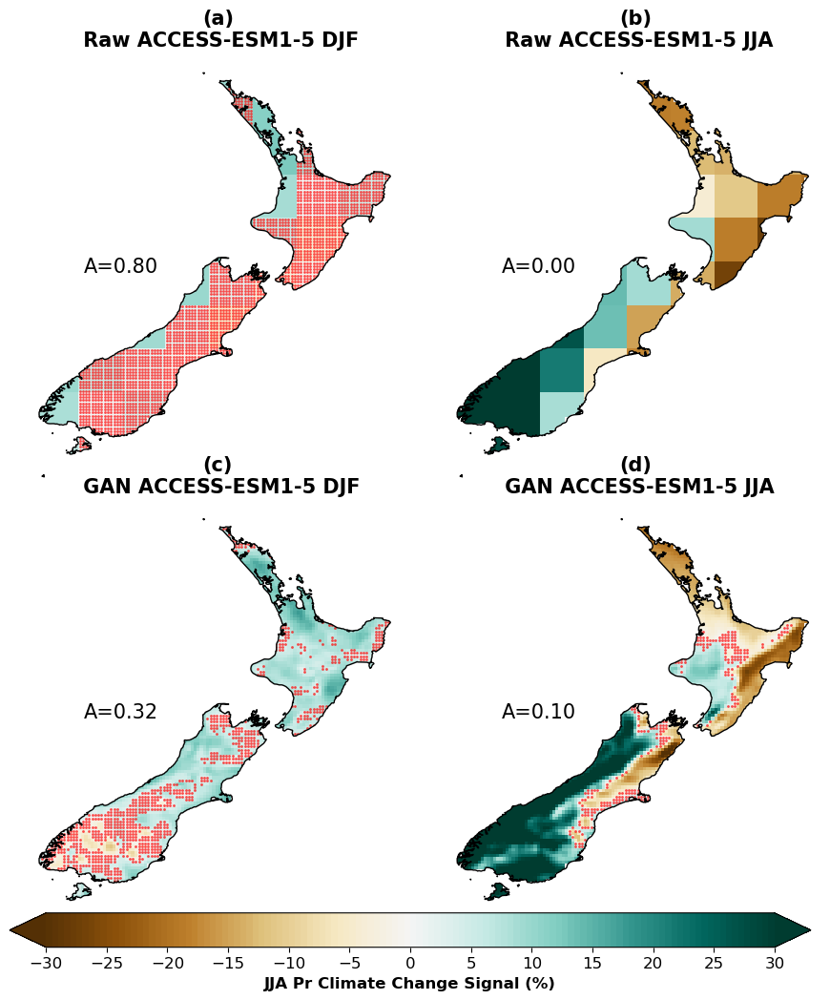

In [771]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(4, 5, wspace=0.05, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))

ax0 = fig.add_subplot(gs[0:2, 0:3], **projections)
ax1 = fig.add_subplot(gs[0:2, 2:5], **projections)
ax2 = fig.add_subplot(gs[2:, 0:3], **projections)
ax3 = fig.add_subplot(gs[2:, 2:5], **projections)
axes = [ax0, ax1, ax2, ax3]
vmin, vmax = -30, 30
levels = np.arange(vmin, vmax + 0.5, 0.5)
threshold = 4/6
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='BrBG'):
    mean_signal = signal.mean(groupby).where(static_fields.orog > 0, np.nan)
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize =15)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)

    agreement = (signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    agreement2 = (signal <= 0).sum(groupby[0]) / signal[groupby[0]].size
    agreement = xr.concat([agreement, agreement2], dim ="axes").max("axes")
    stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) < threshold)
    lons, lats = np.meshgrid(signal.lon, signal.lat)
    ax.scatter(lons[stippling_mask], lats[stippling_mask], color='r', s=4.0, 
               transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    A = len(stippling_mask[0]) / total_land_pixels
    ax.text(168, -41, f'A={"%.2f" % A}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return cs
# Plotting each panel
cs =plot_panel(axes[0], cc_signal_pr, '(a)\n Raw ACCESS-ESM1-5 DJF', ['GCM_variant'])
plot_panel(axes[1], cc_signal_pr_jja, '(b)\n Raw ACCESS-ESM1-5 JJA', ['GCM_variant'])
plot_panel(axes[2], cc_signal_pr_em, '(c)\n GAN ACCESS-ESM1-5 DJF', ['GCM_variant'])
cs = plot_panel(axes[3], cc_signal_pr_em_jja, '(d)\n GAN ACCESS-ESM1-5 JJA', ['GCM_variant'])
ax4 = fig.add_axes([0.2, 0.1, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('JJA Pr Climate Change Signal (%)', weight ='bold', fontsize =12)
cbar.set_ticks(np.arange(-30, 35, 5))
cbar.ax.tick_params(labelsize =12)
# Set shared extent for last panel


plt.tight_layout()
plt.show()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_DJF_uncertainty.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_DJF_uncertainty.pdf', dpi =300, bbox_inches ='tight')

In [718]:
np.sign(cc_signal_pr).min()

<xarray.DataArray ()>
array(-1.)
Coordinates:
    height    float64 2.0
    height_2  float64 10.0
    season    <U3 'DJF'

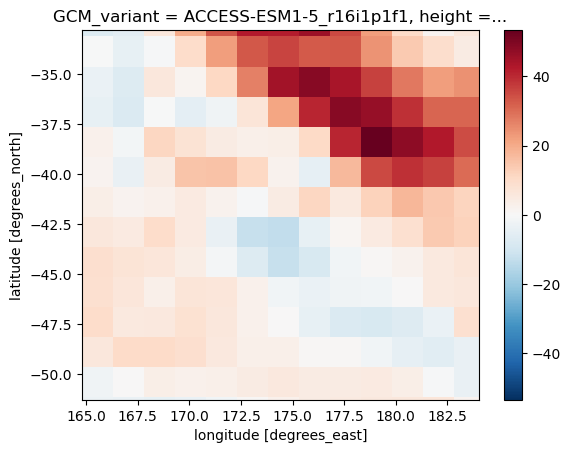

In [732]:
cc_signal_pr.isel(GCM_variant =6).plot()

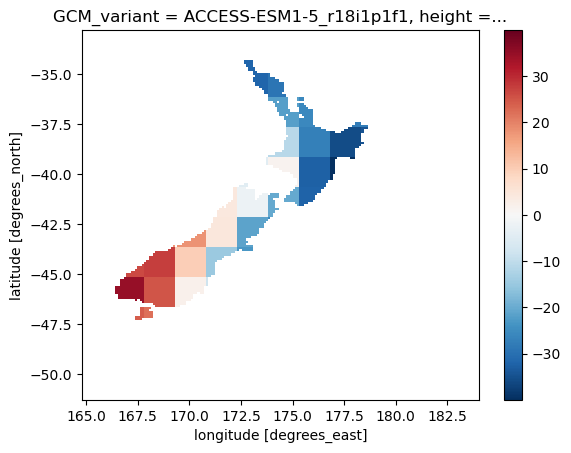

In [714]:
cc_signal_pr.isel(GCM_variant =8).where(static_fields.orog>0,np.nan).plot()

In [697]:
cc_signal_pr_jja

<xarray.DataArray (GCM_variant: 40, lat: 172, lon: 179)>
array([[[ 27.867756 ,  27.867756 ,  27.867756 , ...,  11.262663 ,
          11.262663 ,  11.262663 ],
        [ 26.998053 ,  26.998053 ,  26.998053 , ...,  12.701548 ,
          12.701548 ,  12.701548 ],
        [ 26.998053 ,  26.998053 ,  26.998053 , ...,  12.701548 ,
          12.701548 ,  12.701548 ],
        ...,
        [-23.34366  , -23.34366  , -23.34366  , ...,  -9.521343 ,
          -9.521343 ,  -9.521343 ],
        [-23.34366  , -23.34366  , -23.34366  , ...,  -9.521343 ,
          -9.521343 ,  -9.521343 ],
        [-23.34366  , -23.34366  , -23.34366  , ...,  -9.521343 ,
          -9.521343 ,  -9.521343 ]],

       [[ 30.5034   ,  30.5034   ,  30.5034   , ...,  27.949125 ,
          27.949125 ,  27.949125 ],
        [ 36.18404  ,  36.18404  ,  36.18404  , ...,  27.785116 ,
          27.785116 ,  27.785116 ],
        [ 36.18404  ,  36.18404  ,  36.18404  , ...,  27.785116 ,
          27.785116 ,  27.785116 ],
...
        [-33.816624 , -33.816624 , -33.816624 , ..., -17.814259 ,
         -17.814259 , -17.814259 ],
        [-33.816624 , -33.816624 , -33.816624 , ..., -17.814259 ,
         -17.814259 , -17.814259 ],
        [-33.816624 , -33.816624 , -33.816624 , ..., -17.814259 ,
         -17.814259 , -17.814259 ]],

       [[ 14.252822 ,  14.252822 ,  14.252822 , ...,   3.7625115,
           3.7625115,   3.7625115],
        [ 16.062395 ,  16.062395 ,  16.062395 , ...,   1.9975958,
           1.9975958,   1.9975958],
        [ 16.062395 ,  16.062395 ,  16.062395 , ...,   1.9975958,
           1.9975958,   1.9975958],
        ...,
        [-35.02079  , -35.02079  , -35.02079  , ...,  -4.269747 ,
          -4.269747 ,  -4.269747 ],
        [-35.02079  , -35.02079  , -35.02079  , ...,  -4.269747 ,
          -4.269747 ,  -4.269747 ],
        [-35.02079  , -35.02079  , -35.02079  , ...,  -4.269747 ,
          -4.269747 ,  -4.269747 ]]], dtype=float32)
Coordinates:
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'ACCESS-E...
    height       float64 2.0
    height_2     float64 10.0
    season       <U3 'JJA'
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0

In [693]:
cc_signal_pr_em

<xarray.DataArray (GCM_variant: 40, lat: 172, lon: 179)>
array([[[ 6.86568701e+00,  5.42296437e+00,  4.02594586e+00, ...,
          9.66794977e+00,  9.79474653e+00,  8.48221806e+00],
        [ 8.73122758e+00,  7.80689685e+00,  6.60773234e+00, ...,
          1.13553977e+01,  1.26956944e+01,  1.17731900e+01],
        [ 1.10655061e+01,  1.04860227e+01,  9.90496018e+00, ...,
          1.09524275e+01,  1.26338751e+01,  1.05631740e+01],
        ...,
        [-9.07932017e-01,  4.10325686e-01,  2.19032789e+00, ...,
          3.68712821e+01,  4.57710513e+01,  4.74872653e+01],
        [-3.79931835e+00, -4.48640393e+00, -4.56015379e+00, ...,
          3.73550570e+01,  4.35522388e+01,  4.42195814e+01],
        [-1.79257586e-01, -1.28766616e+00, -4.02325688e+00, ...,
          4.19902080e+01,  3.58991357e+01,  4.09032522e+01]],

       [[-1.31922594e+00, -7.76326833e-01, -1.10140021e+00, ...,
         -4.04810819e+00, -3.79886171e+00, -4.50347895e+00],
        [ 4.61162780e-02,  1.29069593e-01, -1.67240189e-01, ...,
         -5.61662482e+00, -4.53018938e+00, -5.16900320e+00],
        [-7.98273674e-01, -1.13021611e+00, -5.09532980e-01, ...,
         -5.39849685e+00, -5.79799450e+00, -6.02726654e+00],
...
        [-8.31249665e+00, -9.18476701e+00, -4.29122852e+00, ...,
          8.78561045e+01,  7.68404272e+01,  7.01853395e+01],
        [-1.05397210e+01, -7.37544380e+00,  3.94707577e+00, ...,
          8.91138857e+01,  6.74069059e+01,  5.71421532e+01],
        [-8.98463908e+00, -6.25677206e+00,  8.34656558e+00, ...,
          7.74739276e+01,  6.21616148e+01,  6.04833366e+01]],

       [[-8.93183017e-01, -1.07762003e+00, -5.07318407e-01, ...,
          7.73322151e+00,  8.13642959e+00,  7.81634108e+00],
        [-6.49857740e-01, -2.89980246e-01,  8.02938511e-02, ...,
          6.54888095e+00,  8.23106919e+00,  7.26854432e+00],
        [-2.39362494e+00, -1.49917616e+00,  4.22678671e-01, ...,
          8.64145118e+00,  8.59937407e+00,  6.84379515e+00],
        ...,
        [-1.62700195e+01, -1.64170022e+01, -1.38937078e+01, ...,
          3.16980237e+01,  3.99031449e+01,  4.66575693e+01],
        [-1.99211127e+01, -1.47309152e+01, -1.73597739e+01, ...,
          3.09816225e+01,  3.93736995e+01,  4.91650792e+01],
        [-1.22001334e+01, -1.95077363e+01, -2.10960320e+01, ...,
          2.54317447e+01,  3.05374492e+01,  4.43080820e+01]]])
Coordinates:
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'ACCESS-E...
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
    GCM          (GCM_variant) object 'ACCESS-ESM1-5' ... 'ACCESS-ESM1-5'
    season       <U3 'DJF'

/tmp/ipykernel_203802/478799252.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


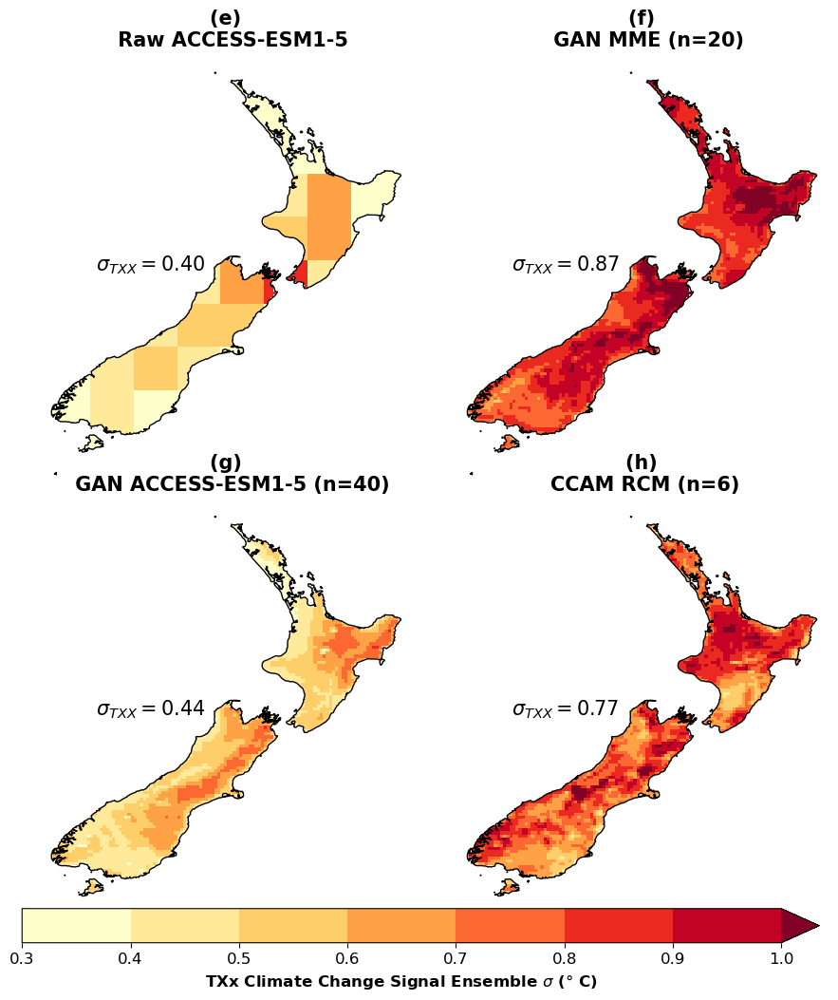

In [416]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(4, 5, wspace=0.05, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))

ax0 = fig.add_subplot(gs[0:2, 0:3], **projections)
ax1 = fig.add_subplot(gs[0:2, 2:5], **projections)
ax2 = fig.add_subplot(gs[2:, 0:3], **projections)
ax3 = fig.add_subplot(gs[2:, 2:5], **projections)
axes = [ax0, ax1, ax2, ax3]
vmin, vmax = 0.3, 1
levels = np.arange(vmin, vmax + 0.1, 0.1)
threshold = 1
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='YlOrRd'):
    mean_signal = signal.std(groupby).where(static_fields.orog > 0, np.nan)
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize =15)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)
    #agreement = signal.std(groupby)# >0.5#(signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    #stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) > threshold)
    #lons, lats = np.meshgrid(signal.lon, signal.lat)
    #ax.scatter(lons[stippling_mask], lats[stippling_mask], color='k', s=4.0, 
    #           transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    #A = len(stippling_mask[0]) / total_land_pixels
    #ax.text(168, -41, f'A={"%.2f" % A}', transform=ccrs.PlateCarree(), fontsize=15)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return mean_signal, cs
# Plotting each panel
low_res, cs = plot_panel(axes[0], cc_signal_txx, '(e) \n Raw ACCESS-ESM1-5', ['GCM_variant'])
A_mean = low_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[0].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

gan_mme_high, cs = plot_panel(axes[1], cc_signal_mme_txx, '(f) \n GAN MME (n=20)', ['GCM_variant'])
A_mean = gan_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[1].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

high_res, cs = plot_panel(axes[2], cc_signal_em_txx, '(g) \n GAN ACCESS-ESM1-5 (n=40)', ['GCM_variant'])
A_mean = high_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[2].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

ccam_mme_high, cs = plot_panel(axes[3], cc_signal_ccam_txx, '(h) \nCCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15)
# Set shared extent for last panel
A_mean =ccam_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

#cs = plot_panel(axes[3], cc_signal_ccam, '(d)\n RCM Downscaled MME (n=6)', ['GCM'])
ax4 = fig.add_axes([0.2, 0.1, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('TXx Climate Change Signal Ensemble $\sigma$ ($\degree$ C)', weight ='bold', fontsize =12)
cbar.set_ticks(np.arange(0.3, 1.1, 0.1))
cbar.ax.tick_params(labelsize =12)

plt.tight_layout()
plt.show()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_SIGMA_uncertainty.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_sigma_uncertainty.pdf', dpi =300, bbox_inches ='tight')

/tmp/ipykernel_203802/2962194731.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


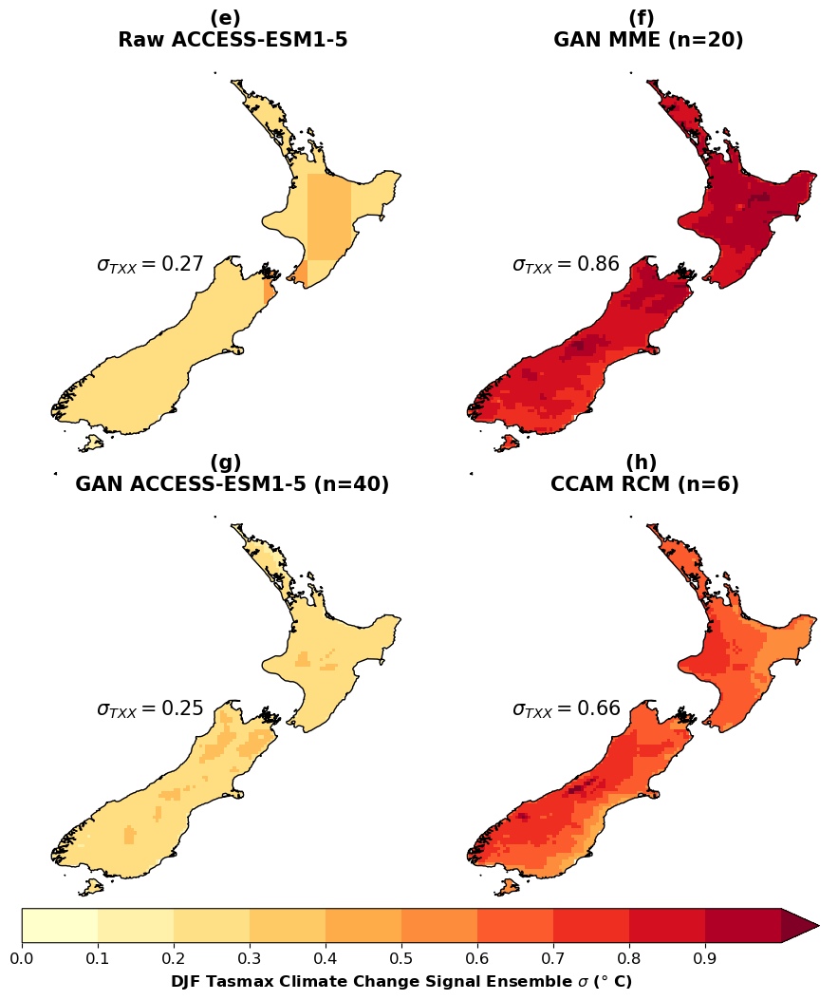

In [895]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(4, 5, wspace=0.05, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))
season ='DJF'
ax0 = fig.add_subplot(gs[0:2, 0:3], **projections)
ax1 = fig.add_subplot(gs[0:2, 2:5], **projections)
ax2 = fig.add_subplot(gs[2:, 0:3], **projections)
ax3 = fig.add_subplot(gs[2:, 2:5], **projections)
axes = [ax0, ax1, ax2, ax3]
vmin, vmax = 0.0, 1
levels = np.arange(vmin, vmax + 0.1, 0.1)
threshold = 1
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='YlOrRd'):
    mean_signal = signal.std(groupby).where(static_fields.orog > 0, np.nan)
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize =15)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)
    #agreement = signal.std(groupby)# >0.5#(signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    #stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) > threshold)
    #lons, lats = np.meshgrid(signal.lon, signal.lat)
    #ax.scatter(lons[stippling_mask], lats[stippling_mask], color='k', s=4.0, 
    #           transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    #A = len(stippling_mask[0]) / total_land_pixels
    #ax.text(168, -41, f'A={"%.2f" % A}', transform=ccrs.PlateCarree(), fontsize=15)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return mean_signal, cs
# Plotting each panel
low_res, cs = plot_panel(axes[0], cc_signal_tasmax_gcm.sel(season = season), '(e) \n Raw ACCESS-ESM1-5', ['GCM_variant'])
A_mean = low_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[0].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

gan_mme_high, cs = plot_panel(axes[1], cc_signal_mme_tasmax.sel(season  = season), '(f) \n GAN MME (n=20)', ['GCM_variant'])
A_mean = gan_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[1].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

high_res, cs = plot_panel(axes[2], cc_signal_tasmax_em, '(g) \n GAN ACCESS-ESM1-5 (n=40)', ['GCM_variant'])
A_mean = high_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[2].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

ccam_mme_high, cs = plot_panel(axes[3], cc_signal_ccam_tasmax.sel(season = season), '(h) \nCCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15)
# Set shared extent for last panel
A_mean =ccam_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\sigma_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

#cs = plot_panel(axes[3], cc_signal_ccam, '(d)\n RCM Downscaled MME (n=6)', ['GCM'])
ax4 = fig.add_axes([0.2, 0.1, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('DJF Tasmax Climate Change Signal Ensemble $\sigma$ ($\degree$ C)', weight ='bold', fontsize =12)
cbar.set_ticks(np.arange(0.0, 1, 0.1))
cbar.ax.tick_params(labelsize =12)

plt.tight_layout()
plt.show()
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_DJF_SIGMA_uncertainty.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_sigma_uncertainty.pdf', dpi =300, bbox_inches ='tight')

/tmp/ipykernel_203802/3481986577.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


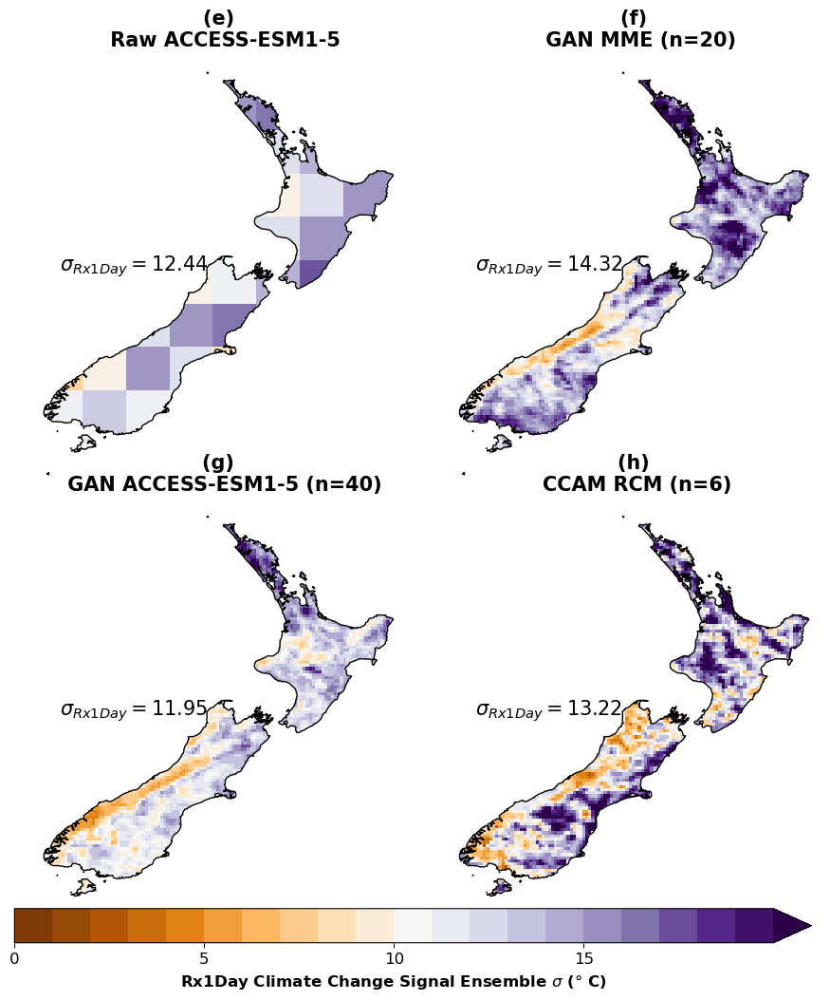

In [901]:

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(4, 5, wspace=0.05, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))
season ='DJF'
ax0 = fig.add_subplot(gs[0:2, 0:3], **projections)
ax1 = fig.add_subplot(gs[0:2, 2:5], **projections)
ax2 = fig.add_subplot(gs[2:, 0:3], **projections)
ax3 = fig.add_subplot(gs[2:, 2:5], **projections)
axes = [ax0, ax1, ax2, ax3]
vmin, vmax = 0.0, 20
levels = np.arange(vmin, vmax + 0.1, 1)
threshold = 1
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='PuOr'):
    mean_signal = signal.std(groupby).where(static_fields.orog > 0, np.nan)
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize =15)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)
    #agreement = signal.std(groupby)# >0.5#(signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    #stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) > threshold)
    #lons, lats = np.meshgrid(signal.lon, signal.lat)
    #ax.scatter(lons[stippling_mask], lats[stippling_mask], color='k', s=4.0, 
    #           transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    #A = len(stippling_mask[0]) / total_land_pixels
    #ax.text(168, -41, f'A={"%.2f" % A}', transform=ccrs.PlateCarree(), fontsize=15)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return mean_signal, cs
# Plotting each panel


# plot_panel(axes[0], cc_signal, '(a)\n Raw ACCESS-ESM1-5', ['GCM_variant'])
# plot_panel(axes[1], cc_signal_mme, '(b)\n GAN MME (n=20)', ['GCM_variant'])
# plot_panel(axes[2], cc_signal_em, '(c)\n GAN ACCESS-ESM1-5 (n=40)', ['GCM_variant'])
# cs = plot_panel(axes[3], cc_signal_ccam, '(d)\n RCM Downscaled MME (n=6)', ['GCM'])


low_res, cs = plot_panel(axes[0], cc_signal, '(e) \n Raw ACCESS-ESM1-5', ['GCM_variant'])
A_mean = low_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[0].text(167, -41, '$\sigma_{Rx1Day}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

gan_mme_high, cs = plot_panel(axes[1], cc_signal_mme, '(f) \n GAN MME (n=20)', ['GCM_variant'])
A_mean = gan_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[1].text(167, -41, '$\sigma_{Rx1Day}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

high_res, cs = plot_panel(axes[2], cc_signal_em, '(g) \n GAN ACCESS-ESM1-5 (n=40)', ['GCM_variant'])
A_mean = high_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[2].text(167, -41, '$\sigma_{Rx1Day}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

ccam_mme_high, cs = plot_panel(axes[3], cc_signal_ccam, '(h) \nCCAM RCM (n=6)', ['GCM'])
axes[3].text(167, -41, '$\sigma_{Rx1Day}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15)
# Set shared extent for last panel
A_mean =ccam_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[3].text(167, -41, '$\sigma_{Rx1Day}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

#cs = plot_panel(axes[3], cc_signal_ccam, '(d)\n RCM Downscaled MME (n=6)', ['GCM'])
ax4 = fig.add_axes([0.2, 0.1, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('Rx1Day Climate Change Signal Ensemble $\sigma$ ($\degree$ C)', weight ='bold', fontsize =12)
cbar.set_ticks(np.arange(0.0, 20, 5))
cbar.ax.tick_params(labelsize =12)

plt.tight_layout()
plt.show()
#fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_SIGMA_uncertainty.png', dpi =500, bbox_inches ='tight')
#fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_sigma_uncertainty.pdf', dpi =300, bbox_inches ='tight')




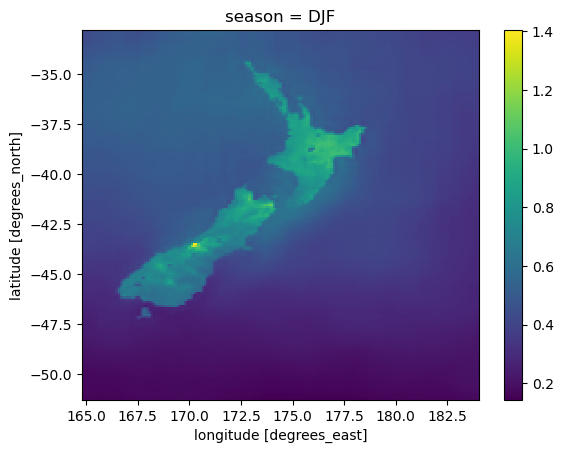

In [809]:
cc_signal_mme_tasmax.sel(season  = season).var("GCM_variant").plot()

In [804]:
cc_signal_ccam_tasmax

<xarray.DataArray (GCM: 6, season: 4, lat: 172, lon: 179)>
array([[[[1.3109741 , 1.3095093 , 1.3086243 , ..., 1.1215515 ,
          1.1217651 , 1.1219788 ],
         [1.322815  , 1.3215637 , 1.3206482 , ..., 1.1342468 ,
          1.1343384 , 1.1337585 ],
         [1.335022  , 1.3342285 , 1.3343811 , ..., 1.1489563 ,
          1.1486206 , 1.1481934 ],
         ...,
         [2.9249878 , 2.9281006 , 2.9304504 , ..., 2.5391235 ,
          2.5364075 , 2.5326233 ],
         [2.9154663 , 2.9197388 , 2.9214172 , ..., 2.5404663 ,
          2.537506  , 2.5331726 ],
         [2.906952  , 2.9105225 , 2.9139404 , ..., 2.5388184 ,
          2.5350647 , 2.53302   ]],

        [[1.2747803 , 1.2753601 , 1.2759705 , ..., 1.3881836 ,
          1.3883362 , 1.3893738 ],
         [1.2798767 , 1.2799072 , 1.2801514 , ..., 1.3912048 ,
          1.3910522 , 1.3922424 ],
         [1.2845459 , 1.2838135 , 1.2837219 , ..., 1.3932495 ,
          1.3933105 , 1.3947449 ],
...
         [0.90509033, 0.9072571 , 0.90930176, ..., 1.2427368 ,
          1.2449951 , 1.2466431 ],
         [0.907074  , 0.9086304 , 0.9118042 , ..., 1.2502136 ,
          1.2521973 , 1.2539062 ],
         [0.9081726 , 0.9111023 , 0.9125366 , ..., 1.2546692 ,
          1.2571411 , 1.258606  ]],

        [[0.4267273 , 0.4260254 , 0.42486572, ..., 0.58010864,
          0.5827942 , 0.5850525 ],
         [0.42797852, 0.42697144, 0.42575073, ..., 0.59194946,
          0.59439087, 0.59716797],
         [0.43041992, 0.42971802, 0.42871094, ..., 0.6051941 ,
          0.60891724, 0.61239624],
         ...,
         [0.8920593 , 0.88949585, 0.88668823, ..., 1.086792  ,
          1.0885315 , 1.0907593 ],
         [0.88671875, 0.8843689 , 0.8829651 , ..., 1.094574  ,
          1.0956421 , 1.0971985 ],
         [0.88101196, 0.87905884, 0.8795166 , ..., 1.1009827 ,
          1.1036682 , 1.1057434 ]]]], dtype=float32)
Coordinates:
  * GCM      (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
  * lon      (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat      (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

/tmp/ipykernel_203802/1960714082.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


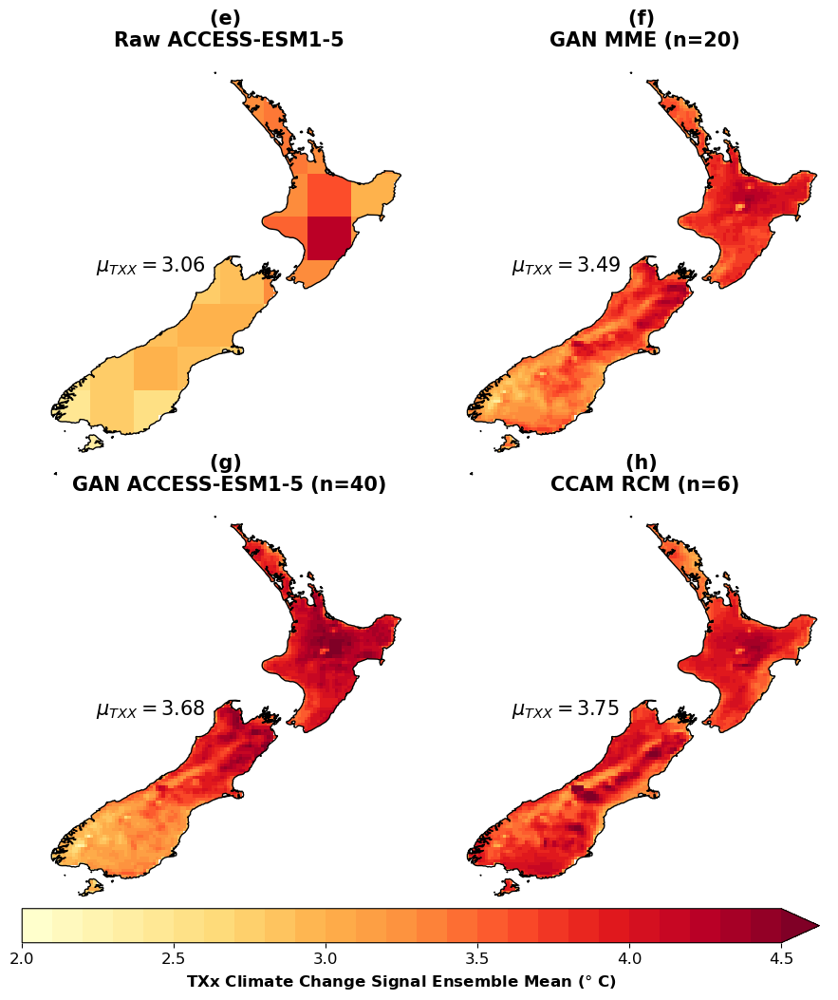

In [417]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import cartopy.crs as ccrs

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(4, 5, wspace=0.05, hspace=0.05)
projections = dict(projection=ccrs.PlateCarree(central_longitude=171.77))

ax0 = fig.add_subplot(gs[0:2, 0:3], **projections)
ax1 = fig.add_subplot(gs[0:2, 2:5], **projections)
ax2 = fig.add_subplot(gs[2:, 0:3], **projections)
ax3 = fig.add_subplot(gs[2:, 2:5], **projections)
axes = [ax0, ax1, ax2, ax3]
vmin, vmax = 2, 4.5
levels = np.arange(vmin, vmax + 0.1, 0.1)
threshold = 1
total_land_pixels = (static_fields.orog > 0).sum().values

# Helper function to plot maps and stippling
def plot_panel(ax, signal, title, groupby, cmap='YlOrRd'):
    mean_signal = signal.mean(groupby).where(static_fields.orog > 0, np.nan)
    cs = mean_signal.plot(ax=ax, transform=ccrs.PlateCarree(), 
                              add_colorbar=False, levels=levels, cmap=cmap)
    #ax.coastlines('10m')
    ax.set_frame_on(False)
    ax.set_title(title, weight='bold', fontsize = 15)
    ax.add_feature(cfeature.OCEAN.with_scale('10m'),ec ='k', fc ='white', zorder =12)
    #agreement = signal.std(groupby)# >0.5#(signal > 0).sum(groupby[0]) / signal[groupby[0]].size
    #stippling_mask = np.where(agreement.where(static_fields.orog > 0, np.nan) > threshold)
    #lons, lats = np.meshgrid(signal.lon, signal.lat)
    #ax.scatter(lons[stippling_mask], lats[stippling_mask], color='k', s=4.0, 
    #           transform=ccrs.PlateCarree(), alpha=0.7, linewidth=0)
    #A = len(stippling_mask[0]) / total_land_pixels
    #ax.text(168, -41, f'A={"%.2f" % A}', transform=ccrs.PlateCarree(), fontsize=15)
    ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
    return mean_signal, cs
# Plotting each panel
low_res, cs = plot_panel(axes[0], cc_signal_txx, '(e) \nRaw ACCESS-ESM1-5', ['GCM_variant'])
A_mean = low_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[0].text(168, -41, '$\mu_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

gan_mme_high, cs = plot_panel(axes[1], cc_signal_mme_txx, '(f) \nGAN MME (n=20)', ['GCM_variant'])
A_mean = gan_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[1].text(168, -41, '$\mu_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

high_res, cs = plot_panel(axes[2], cc_signal_em_txx, '(g) \nGAN ACCESS-ESM1-5 (n=40)', ['GCM_variant'])
A_mean = high_res.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[2].text(168, -41, '$\mu_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

ccam_mme_high, cs = plot_panel(axes[3], cc_signal_ccam_txx, '(h) \nCCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\mu_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15)
# Set shared extent for last panel
A_mean =ccam_mme_high.where(static_fields.orog>0, np.nan).mean().mean()
#plot_panel(axes[3], cc_signal_ccam_txx, 'CCAM RCM (n=6)', ['GCM'])
axes[3].text(168, -41, '$\mu_{TXX}=$'+ f'{"%.2f" % A_mean}', transform=ccrs.PlateCarree(), fontsize=15, zorder =13)

#cs = plot_panel(axes[3], cc_signal_ccam, '(d)\n RCM Downscaled MME (n=6)', ['GCM'])
ax4 = fig.add_axes([0.2, 0.1, 0.6, 0.03])
cbar = fig.colorbar(cs, cax = ax4, orientation ='horizontal')
cbar.set_label('TXx Climate Change Signal Ensemble Mean ($\degree$ C)', weight ='bold', fontsize =12)
cbar.set_ticks(np.arange(2, 5, 0.5))
cbar.ax.tick_params(labelsize =12)

plt.tight_layout()
plt.show()

fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_mu_uncertainty.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Figure2_TXX_mu_uncertainty.pdf', dpi =300, bbox_inches ='tight')

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

def confidence_ellipse2(x, y, factor =2):
    x = x.ravel()/factor
    y = y.ravel()
    index = ~np.isnan(x)
    x = x[index]
    y = y[index]
    """Plot a confidence ellipse of the covariance of x and y"""
    if x.size != y.size:
        raise ValueError("x and y must be the same size")
    n_std = 2.0
    cov = np.cov(x, y)
    joint_uncertainty = cov[0,0] *  cov[1, 1] - cov[1, 0] *cov[0, 1]
    return joint_uncertainty

ellipse_area = xr.apply_ufunc(confidence_ellipse2,cc_signal, cc_signal_txx, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

ellipse_area2 = xr.apply_ufunc(confidence_ellipse2,cc_signal_em, cc_signal_em_txx, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)


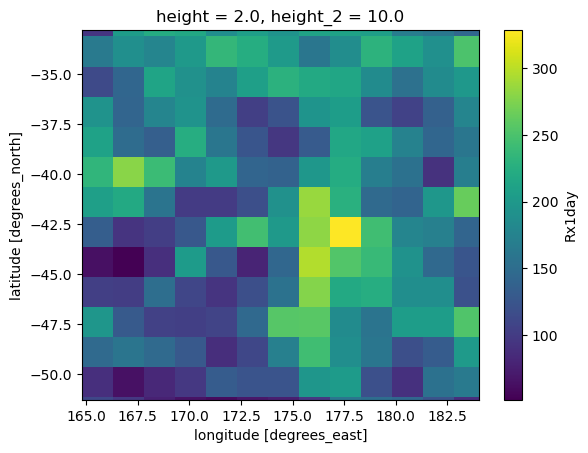

In [641]:
cc_signal.var("GCM_variant").plot()

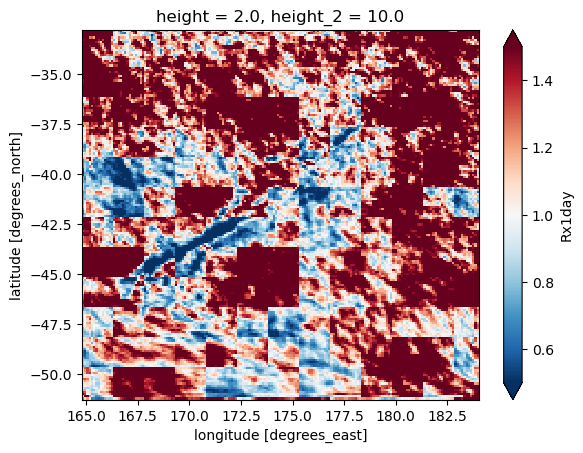

In [660]:
(cc_signal_em.var("GCM_variant")/cc_signal.var("GCM_variant")).plot(vmin =0.5, vmax =1.5, cmap ='RdBu_r')

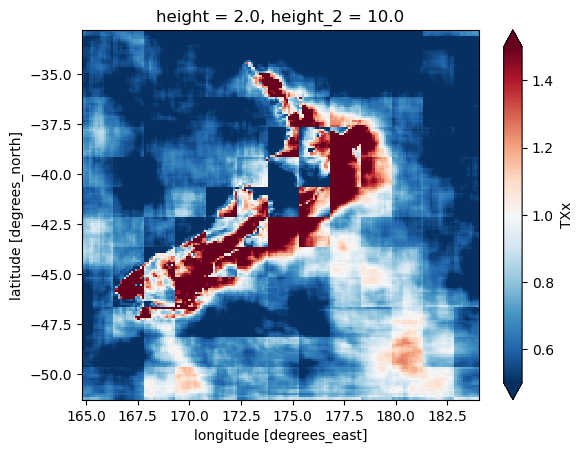

In [659]:
(cc_signal_em_txx.var("GCM_variant")/cc_signal_txx.var("GCM_variant")).plot(vmin =0.5, vmax =1.5, cmap ='RdBu_r')

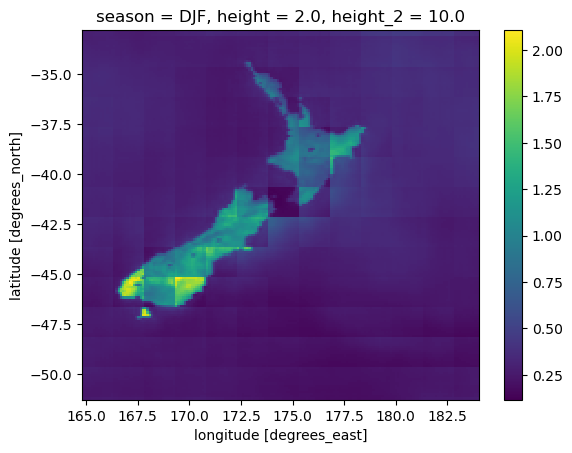

In [658]:
(cc_signal_tasmax_em.var("GCM_variant")/cc_signal_tasmax.var("GCM_variant")).plot()


In [654]:
(cc_signal_tasmax_em.var("GCM_variant")/cc_signal_tasmax.var("GCM_variant")).where(static_fields.orog>0, np.nan).mean()

<xarray.DataArray ()>
array(0.95307459)
Coordinates:
    season    <U3 'DJF'
    height    float64 2.0
    height_2  float64 10.0

In [ ]:
(cc_signal_em_txx.var("GCM_variant")/cc_signal_txx.var("GCM_variant")).where(static_fields.orog>0, np.nan).plot(vmin =0.5, vmax =1.5, cmap ='RdBu_r')

In [440]:
cc_signal_tasmax_em = (access_esm.seasonal_tasmax_future - access_esm.seasonal_tasmax_hist).sel(season ='DJF')
cc_signal_pr_em = 100*((access_esm.seasonal_pr_future - access_esm.seasonal_pr_hist)/(access_esm.seasonal_pr_hist)).sel(season ='DJF')

In [505]:
cc_signal_tasmax_em_jja = (access_esm.seasonal_tasmax_future - access_esm.seasonal_tasmax_hist).sel(season ='JJA')
cc_signal_pr_em_jja = 100*((access_esm.seasonal_pr_future - access_esm.seasonal_pr_hist)/(access_esm.seasonal_pr_hist)).sel(season ='JJA')

In [506]:
cc_signal_tasmax_jja = (merged_dset.tasmax_seasonal_future - merged_dset.tasmax_seasonal_hist).sel(season ='JJA')
cc_signal_pr_jja = 100*((merged_dset.pr_seasonal_future- merged_dset.pr_seasonal_hist)/merged_dset.pr_seasonal_hist).sel(season ='JJA')

In [439]:
cc_signal_tasmax = (merged_dset.tasmax_seasonal_future - merged_dset.tasmax_seasonal_hist).sel(season ='DJF')
cc_signal_pr = 100*((merged_dset.pr_seasonal_future- merged_dset.pr_seasonal_hist)/merged_dset.pr_seasonal_hist).sel(season ='DJF')

In [688]:
ellipse_area_extreme_gcm = xr.apply_ufunc(confidence_ellipse2,cc_signal, cc_signal_txx, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

ellipse_area_extreme_em = xr.apply_ufunc(confidence_ellipse2,cc_signal_em, cc_signal_em_txx, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

In [689]:
ellipse_area_gcm = xr.apply_ufunc(confidence_ellipse2,cc_signal_pr, cc_signal_tasmax , input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

ellipse_area_em = xr.apply_ufunc(confidence_ellipse2,cc_signal_pr_em, cc_signal_tasmax_em, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

In [690]:
ellipse_area_gcm_jja = xr.apply_ufunc(confidence_ellipse2,cc_signal_pr_jja, cc_signal_tasmax_jja , input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

ellipse_area_em_jja = xr.apply_ufunc(confidence_ellipse2,cc_signal_pr_em_jja, cc_signal_tasmax_em_jja, input_core_dims =[["GCM_variant"],["GCM_variant"] ], 
               output_core_dims = [[]], vectorize = True, output_dtypes =[float], dask = 'parallelized')# .where(static_fields.orog>0, np.nan)

In [592]:
cc_signal_tasmax

<xarray.DataArray (GCM_variant: 40, lat: 172, lon: 179)>
array([[[1.3609619, 1.3609619, 1.3609619, ..., 1.6244812, 1.6244812,
         1.6244812],
        [1.4656372, 1.4656372, 1.4656372, ..., 1.8164673, 1.8164673,
         1.8164673],
        [1.4656372, 1.4656372, 1.4656372, ..., 1.8164673, 1.8164673,
         1.8164673],
        ...,
        [3.2729797, 3.2729797, 3.2729797, ..., 3.3936157, 3.3936157,
         3.3936157],
        [3.2729797, 3.2729797, 3.2729797, ..., 3.3936157, 3.3936157,
         3.3936157],
        [3.2729797, 3.2729797, 3.2729797, ..., 3.3936157, 3.3936157,
         3.3936157]],

       [[1.4093628, 1.4093628, 1.4093628, ..., 1.4888306, 1.4888306,
         1.4888306],
        [1.4713745, 1.4713745, 1.4713745, ..., 1.5719604, 1.5719604,
         1.5719604],
        [1.4713745, 1.4713745, 1.4713745, ..., 1.5719604, 1.5719604,
         1.5719604],
...
        [2.916809 , 2.916809 , 2.916809 , ..., 3.2919922, 3.2919922,
         3.2919922],
        [2.916809 , 2.916809 , 2.916809 , ..., 3.2919922, 3.2919922,
         3.2919922],
        [2.916809 , 2.916809 , 2.916809 , ..., 3.2919922, 3.2919922,
         3.2919922]],

       [[1.5878296, 1.5878296, 1.5878296, ..., 1.7810974, 1.7810974,
         1.7810974],
        [1.7166748, 1.7166748, 1.7166748, ..., 1.9400024, 1.9400024,
         1.9400024],
        [1.7166748, 1.7166748, 1.7166748, ..., 1.9400024, 1.9400024,
         1.9400024],
        ...,
        [2.8895264, 2.8895264, 2.8895264, ..., 3.0036316, 3.0036316,
         3.0036316],
        [2.8895264, 2.8895264, 2.8895264, ..., 3.0036316, 3.0036316,
         3.0036316],
        [2.8895264, 2.8895264, 2.8895264, ..., 3.0036316, 3.0036316,
         3.0036316]]], dtype=float32)
Coordinates:
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'ACCESS-E...
    height       float64 2.0
    height_2     float64 10.0
    season       <U3 'DJF'
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0

# Do this plot but for one in 10 year events (very rare events)

In [502]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs

# Define your discrete bins and matching colors


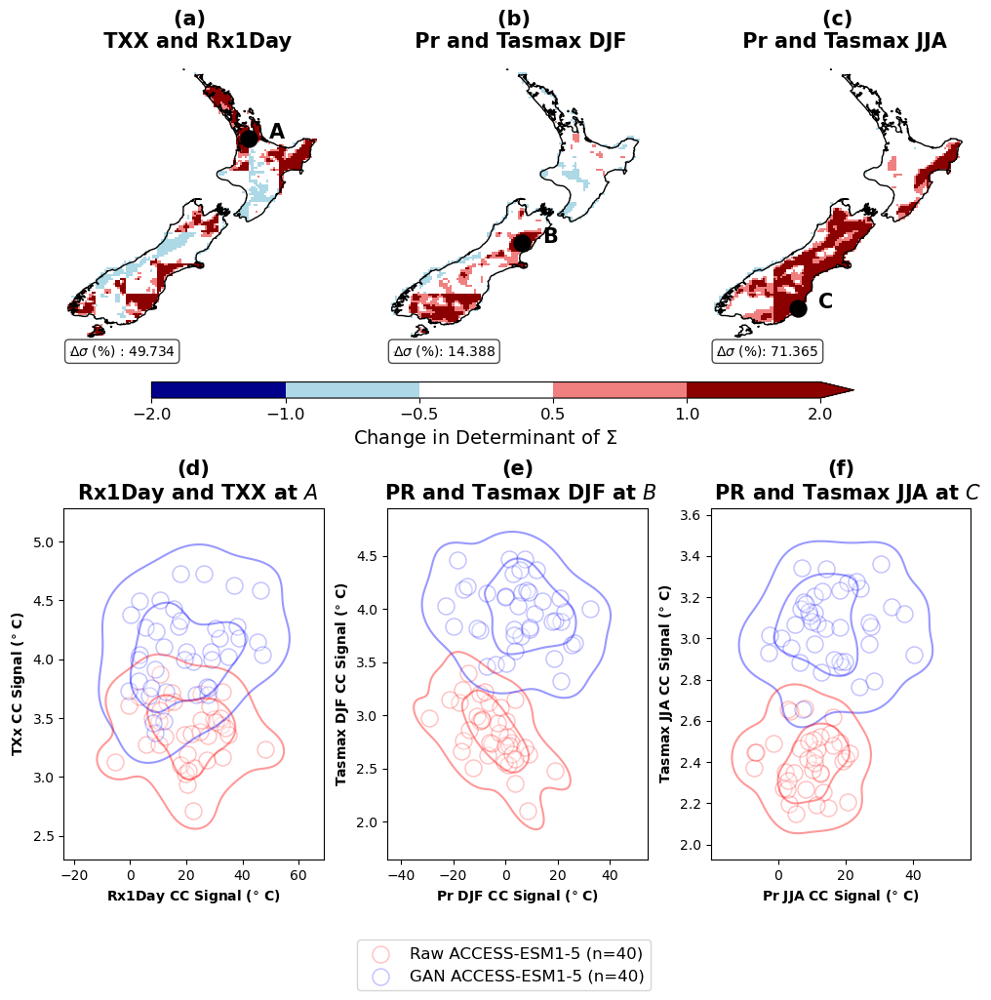

In [784]:
ratios = [((ellipse_area_extreme_em - ellipse_area_extreme_gcm)/ ellipse_area_extreme_gcm).where(static_fields.orog>0, np.nan),
          ((ellipse_area_em - ellipse_area_gcm)/ ellipse_area_gcm).where(static_fields.orog>0, np.nan), ((ellipse_area_em_jja - ellipse_area_gcm_jja)/ ellipse_area_gcm_jja).where(static_fields.orog>0, np.nan)]
titles = ["(a) \n TXX and Rx1Day","(b) \n Pr and Tasmax DJF", "(c) \n Pr and Tasmax JJA"]
cmap ='RdBu_r'
bounds = [-2, -1, -0.5, 0.5, 1, 2]

colors = ['darkblue', 'lightblue', 'white', 'lightcoral', 'darkred']
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(bounds, cmap.N)
# Set up figure and GridSpec
fig = plt.figure(figsize=(12, 11))
gs = gridspec.GridSpec(2, 6, width_ratios=[1, 1, 1,1, 1, 1], height_ratios=[1, 1], hspace=0.35, wspace=0.65)
# j =0
# ii =0
# for i, (ratio, title) in enumerate(zip(ratios, titles)):
title = titles[0]
ratio = ratios[0]
ax1 = fig.add_subplot(gs[0,0:2], projection=ccrs.PlateCarree(central_longitude =171.77))
ax = ax1
im = (ratio).where(static_fields.orog>0, np.nan).plot(ax=ax, transform=ccrs.PlateCarree(), cmap=cmap, norm= norm, add_colorbar = False)

ax4 = fig.add_axes([0.2, 0.54, 0.6, 0.015])
cbar = fig.colorbar(im, cax = ax4, orientation = 'horizontal')
cbar.set_label('Change in Determinant of $\Sigma$', fontsize =14)
cbar.ax.tick_params(labelsize =12)
ax.set_frame_on(False)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.set_title(title, fontsize=15, weight ='bold')
ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
# Add mean as text box
mean_val = float(( ratio).where(static_fields.orog>0, np.nan).mean().values) * 100
ax.text(0.02, 0.02, f"$\Delta \sigma$ (%) : {mean_val:.3f}", transform=ax.transAxes,
        fontsize=10, bbox=dict(facecolor='white', alpha=0.7, boxstyle='round'))
ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
title = titles[1]
ratio = ratios[1]
ax.set_frame_on(False)
ax2 = fig.add_subplot(gs[0,2:4], projection=ccrs.PlateCarree(central_longitude =171.77))
ax = ax2
im = (ratio).where(static_fields.orog>0, np.nan).plot(ax=ax, transform=ccrs.PlateCarree(), cmap=cmap, norm= norm, add_colorbar = False)
ax.coastlines()
ax.set_frame_on(False)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.set_title(title, fontsize=15, weight ='bold')
ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
# Add mean as text box
mean_val = float((ratio).where(static_fields.orog>0, np.nan).mean().values)*100
ax.text(0.02, 0.02, f"$\Delta \sigma$ (%): {mean_val:.3f}", transform=ax.transAxes,
        fontsize=10, bbox=dict(facecolor='white', alpha=0.7, boxstyle='round'))


title = titles[2]
ratio = ratios[2]
ax3 = fig.add_subplot(gs[0,4:6], projection=ccrs.PlateCarree(central_longitude =171.77))
ax = ax3
im = (ratio).where(static_fields.orog>0, np.nan).plot(ax=ax, transform=ccrs.PlateCarree(), cmap=cmap, norm= norm, add_colorbar = False)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.set_title(title, fontsize=15, weight ='bold')

# Add mean as text box
mean_val = float((ratio).where(static_fields.orog>0, np.nan).mean().values) * 100
ax.text(0.02, 0.02, f"$\Delta \sigma$ (%): {mean_val:.3f}", transform=ax.transAxes,
        fontsize=10, bbox=dict(facecolor='white', alpha=0.7, boxstyle='round'))
ax.set_extent([166.25, 179, -48.5, -33.5], crs=ccrs.PlateCarree())
ax.set_frame_on(False)


ax = fig.add_subplot(gs[1,0:2])
lat = -37.55
lon =175.31
delta = 1
import seaborn as sns
ax.scatter(cc_signal.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_txx.interp(lat =lat, lon =lon, method ='nearest'), color ='red', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25)
ax.scatter(cc_signal_em.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_em_txx.interp(lat =lat, lon =lon, method ='nearest'), color ='blue', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25)
ax1.scatter(lon, lat, marker ='o', s=150, transform = ccrs.PlateCarree(), color ='k')
ax1.text(lon+delta, lat, 'A', fontsize =15, transform = ccrs.PlateCarree(), weight ='bold')
sns.kdeplot(x=cc_signal_em.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_em_txx.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='blue', alpha=0.4)
sns.kdeplot(x=cc_signal.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_txx.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='red', alpha=0.4)
ax.set_title('(d)\n Rx1Day and TXX at $A$', fontsize =15, weight ='bold')
# lat = -43.5320
# lon =172.6366
ax.set_xlabel('Rx1Day CC Signal ($\degree$ C)', weight ='bold')
ax.set_ylabel('TXx CC Signal ($\degree$ C)', weight ='bold')   


# lat2 = -37.45
# lon2 =175.01

ax = fig.add_subplot(gs[1,2:4])
lat = -42.65
lon = 172.85
import seaborn as sns
ax.scatter(cc_signal_pr.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_tasmax.interp(lat =lat, lon =lon, method ='nearest'), color ='red', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25)
ax.scatter(cc_signal_pr_em.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_tasmax_em.interp(lat =lat, lon =lon, method ='nearest'), color ='blue', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25)
ax2.scatter(lon, lat, marker ='o', s=150, transform = ccrs.PlateCarree(), color ='k')
sns.kdeplot(x=cc_signal_pr_em.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_tasmax_em.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='blue', alpha=0.4)
sns.kdeplot(x=cc_signal_pr.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_tasmax.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='red', alpha=0.4)
#45.8795° S, 170.5006° E
ax2.text(lon+delta, lat, 'B', fontsize =15, transform = ccrs.PlateCarree(), weight ='bold')
ax.set_title('(e)\n PR and Tasmax DJF at $B$', fontsize =15, weight ='bold')
ax.set_xlabel('Pr DJF CC Signal ($\degree$ C)', weight ='bold')
ax.set_ylabel('Tasmax DJF CC Signal ($\degree$ C)', weight ='bold')      
ax = fig.add_subplot(gs[1,4:6])
lat = -45.8795
lon = 170.5006
import seaborn as sns
ax.scatter(cc_signal_pr_jja.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_tasmax_jja.interp(lat =lat, lon =lon, method ='nearest'), color ='red', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25, label = 'Raw ACCESS-ESM1-5 (n=40)')
ax.scatter(cc_signal_pr_em_jja.interp(lat =lat, lon =lon, method ='nearest'), cc_signal_tasmax_em_jja.interp(lat =lat, lon =lon, method ='nearest'), color ='blue', marker ='o', fc ='white', s=150, zorder=1, alpha =0.25, label = 'GAN ACCESS-ESM1-5 (n=40)')
ax.legend(loc =7, bbox_to_anchor = (-0.2, -0.3), fontsize =12)
ax3.scatter(lon, lat, marker ='o', s=150, transform = ccrs.PlateCarree(), color ='k')
sns.kdeplot(x=cc_signal_pr_em_jja.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_tasmax_em_jja.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='blue', alpha=0.4)
sns.kdeplot(x=cc_signal_pr_jja.interp(lat =lat, lon =lon, method ='nearest'), y=cc_signal_tasmax_jja.interp(lat =lat, lon =lon, method ='nearest'), ax=ax, levels=3, color='red', alpha=0.4)
ax.set_title('(f)\n  PR and Tasmax JJA at $C$', fontsize =15, weight ='bold')
ax3.text(lon+delta, lat, 'C', fontsize =15, transform = ccrs.PlateCarree(), weight ='bold')
ax.set_xlabel('Pr JJA CC Signal ($\degree$ C)', weight ='bold')
ax.set_ylabel('Tasmax JJA CC Signal ($\degree$ C)', weight ='bold') 
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Joint_uncertainty.png', dpi =500, bbox_inches = 'tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Joint_uncertainty.pdf', dpi =500, bbox_inches = 'tight')

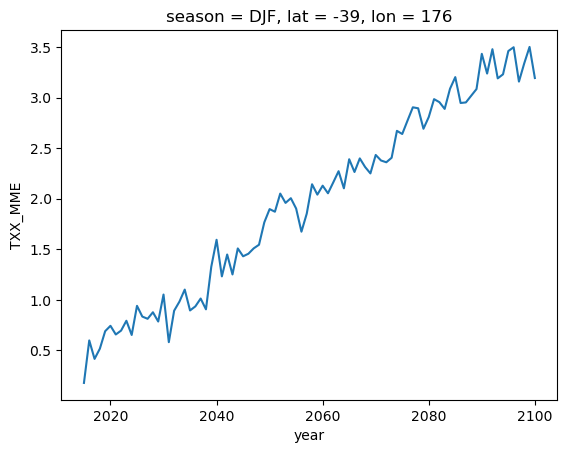

In [1036]:
t_dset.TXX_MME.interp(lat =-39, lon =176, method ='nearest').mean(["GCM","ssp"]).plot()

In [1]:
import xarray as xr

KeyboardInterrupt: 

In [8]:
t_dset =xr.open_dataset('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/internal_variability_data/Multi_Model_Decomposition_tasmax_v250425.nc')
t_dset_le = xr.open_dataset('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/internal_variability_data/Multi_Model_Decomposition_tasmax_LE_IV_v250425.nc')

pr_dset =xr.open_dataset('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/internal_variability_data/Multi_Model_Decomposition_pr_v250425_percentage.nc')
pr_dset_le = xr.open_dataset('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/internal_variability_data/Multi_Model_Decomposition_pr_LE_IV_v250425_percentage.nc')

In [1234]:
t_dset

<xarray.Dataset>
Dimensions:  (lon: 179, lat: 172, year: 86, ssp: 4, GCM: 20, time: 86)
Coordinates:
  * lon      (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat      (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * ssp      (ssp) object 'ssp126' 'ssp245' 'ssp370' 'ssp585'
  * GCM      (GCM) object 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'MPI-ESM1-2-HR'
  * time     (time) datetime64[ns] 2015-02-01 2016-02-01 ... 2100-02-01
    season   object ...
Data variables:
    TXX_MME  (GCM, ssp, year, lat, lon) float64 ...
    DJF_MME  (GCM, ssp, time, lat, lon) float64 ...

# Internal Variability Decomposition

In [9]:



def compute_decomposition(model_scenario, IV_ensemble, varname = "TXX_MME", dim ="year", degree =2, varname_iv = "TXX_IV"):
    
    try:
        model_scenario['time'] = model_scenario.time.dt.year
    except:
        print("passed")
    try:
        IV_ensemble['time'] = IV_ensemble.time.dt.year
    except:
        print("passed")
        # convert time to year if there is an error
        
    # compute a decadal means of the quantity
    #with ProgressBar():
    model_scenario = model_scenario[varname].rolling({dim: 10}, min_periods =6).mean().dropna(dim)
    fitted_uncertainty = model_scenario.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna =True)
    print("here")
    fitted_curve = xr.polyval(model_scenario[dim], fitted_uncertainty.polyfit_coefficients)
    residuals = model_scenario- fitted_curve
    # residuals from the model uncertainty
    I_model = residuals.var([dim]).mean(["GCM","ssp"])
    M = fitted_curve.var("GCM").mean("ssp")
    S = fitted_curve.mean("GCM").var("ssp")
    
    # IV Uncertainty
    IV_ensemble = IV_ensemble[varname_iv].rolling({dim: 10}, min_periods =6).mean().dropna(dim)
    fitted_uncertainty_IV = IV_ensemble.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna=True)
    fitted_curve_IV = xr.polyval(IV_ensemble[dim], fitted_uncertainty_IV.polyfit_coefficients)
    
    I_trend_A = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_trend_C = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    I_raw_A = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_raw_C = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    
    return I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C, fitted_curve



    
    

In [10]:

def compute_decomposition(model_scenario, IV_ensemble, varname = "TXX_MME", dim ="year", degree =2, varname_iv = "TXX_IV"):
    
    try:
        model_scenario['time'] = model_scenario.time.dt.year
    except:
        print("passed")
    try:
        IV_ensemble['time'] = IV_ensemble.time.dt.year
    except:
        print("passed")
        # convert time to year if there is an error
        
    # compute a decadal means of the quantity
    #with ProgressBar():
    model_scenario = model_scenario[varname].rolling({dim: 10}, min_periods =6).mean().dropna(dim)
    fitted_uncertainty = model_scenario.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna =True)
    print("here")
    fitted_curve = xr.polyval(model_scenario[dim], fitted_uncertainty.polyfit_coefficients)
    residuals = model_scenario- fitted_curve
    # residuals from the model uncertainty
    I_model = residuals.var([dim,"ssp"]).mean(["GCM"])
    M = fitted_curve.var("GCM").mean("ssp")
    S = fitted_curve.mean("GCM").var("ssp")
    
    # IV Uncertainty
    IV_ensemble = IV_ensemble[varname_iv].rolling({dim: 10}, min_periods =6).mean().dropna(dim)
    fitted_uncertainty_IV = IV_ensemble.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna=True)
    fitted_curve_IV = xr.polyval(IV_ensemble[dim], fitted_uncertainty_IV.polyfit_coefficients)
    
    I_trend_A = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_trend_C = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    I_raw_A = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_raw_C = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    
    return I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C, fitted_curve


In [11]:

def compute_decomposition_v2(model_scenario, IV_ensemble, varname = "TXX_MME", dim ="year", degree =2, varname_iv = "TXX_IV"):
    
    try:
        model_scenario['time'] = model_scenario.time.dt.year
    except:
        print("passed")
    try:
        IV_ensemble['time'] = IV_ensemble.time.dt.year
    except:
        print("passed")
        # convert time to year if there is an error
        
    # compute a decadal means of the quantity
    #with ProgressBar():
    model_scenario = model_scenario[varname].rolling({dim: 10}, min_periods =6).max().dropna(dim)
    fitted_uncertainty = model_scenario.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna =True)
    print("here")
    fitted_curve = xr.polyval(model_scenario[dim], fitted_uncertainty.polyfit_coefficients)
    residuals = model_scenario- fitted_curve
    # residuals from the model uncertainty
    I_model = residuals.var([dim,"ssp"]).mean(["GCM"])
    M = fitted_curve.var("GCM").mean("ssp")
    S = fitted_curve.mean("GCM").var("ssp")
    
    # IV Uncertainty
    IV_ensemble = IV_ensemble[varname_iv].rolling({dim: 10}, min_periods =6).max().dropna(dim)
    fitted_uncertainty_IV = IV_ensemble.isel({dim: slice(1, -1)}).polyfit(dim, degree, skipna=True)
    fitted_curve_IV = xr.polyval(IV_ensemble[dim], fitted_uncertainty_IV.polyfit_coefficients)
    
    I_trend_A = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_trend_C = fitted_curve_IV.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    I_raw_A = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'ACCESS-ESM1-5')).var("GCM_variant")
    I_raw_C = IV_ensemble.sel(GCM_variant = (IV_ensemble.GCM == 'CanESM5')).var("GCM_variant")
    
    return I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C, fitted_curve


In [1425]:
t_dset_le

<xarray.Dataset>
Dimensions:      (lon: 179, lat: 172, year: 106, GCM_variant: 59, time: 106)
Coordinates:
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * year         (year) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'CanESM5_...
    GCM          (GCM_variant) object ...
  * time         (time) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
    season       object ...
Data variables:
    TXX_IV       (GCM_variant, year, lat, lon) float64 -0.8527 -0.8324 ... 4.438
    DJF_IV       (GCM_variant, time, lat, lon) float64 ...

In [1889]:
t_dset_le.TXX_IV

<xarray.DataArray 'TXX_IV' (GCM_variant: 59, year: 106, lat: 172, lon: 179)>
[192548152 values with dtype=float64]
Coordinates:
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * year         (year) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'CanESM5_...
    GCM          (GCM_variant) object 'ACCESS-ESM1-5' ... 'CanESM5'
    season       <U3 'DJF'

In [62]:
I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C,fitted_T = compute_decomposition(t_dset, t_dset_le, varname = "TXX_MME", dim ="year", degree =2)

passed
passed
here


In [55]:
I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C,fitted_T = compute_decomposition_v2(t_dset, t_dset_le, varname = "TXX_MME", dim ="year", degree =2)

passed
passed
here


In [1428]:
I_model_djf, M_djf, S_djf, I_trend_A_djf, I_trend_C_djf, I_raw_A_djf, I_raw_C_djf,fitted_T_djf = compute_decomposition(t_dset, t_dset_le, varname = "DJF_MME", dim ="time", degree =2, varname_iv ="DJF_IV")

passed
passed
here


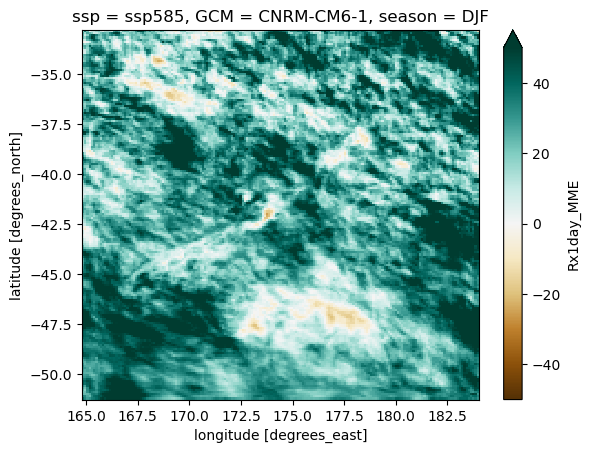

In [2033]:
pr_dset.Rx1day_MME.isel(GCM =0, ssp =-1).sel(year = slice(2080, 2100)).mean('year').plot(vmin=-50, vmax =50, cmap ='BrBG')#.RX1Day_IV.isel(GCM_variant =-20, year =-8).plot(vmin =-50, vmax =50, cmap ='BrBG')

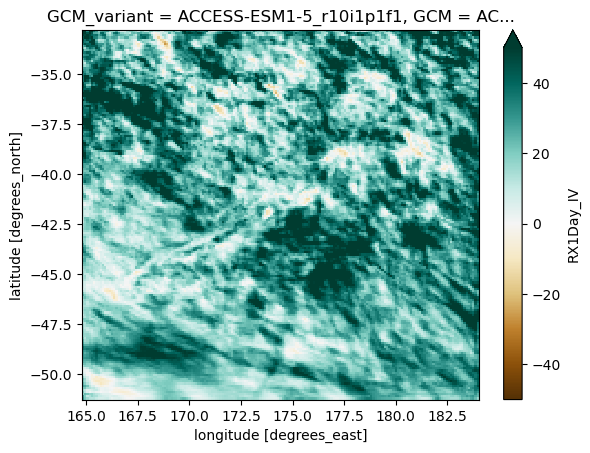

In [2038]:
pr_dset_le.RX1Day_IV.isel(GCM_variant =0).sel(year = slice(2080, 2100)).mean('year').plot(vmin=-50, vmax =50, cmap ='BrBG')#.RX1Day_IV.isel(GCM_variant =-20, year =-8).plot(vmin =-50, vmax =50, cmap ='BrBG')

In [2017]:
pr_dset

<xarray.Dataset>
Dimensions:     (lon: 179, lat: 172, year: 106, ssp: 4, GCM: 20, time: 106)
Coordinates:
  * lon         (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat         (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * year        (year) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
  * ssp         (ssp) object 'ssp126' 'ssp245' 'ssp370' 'ssp585'
  * GCM         (GCM) object 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'MPI-ESM1-2-HR'
  * time        (time) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
    season      object ...
Data variables:
    Rx1day_MME  (GCM, ssp, year, lat, lon) float64 -7.011 -20.32 ... 5.755 42.79
    DJF_MME_pr  (GCM, ssp, time, lat, lon) float64 ...

In [61]:
I_model_r, M_r, S_r, I_trend_A_r, I_trend_C_r, I_raw_A_r, I_raw_C_r, fitted_r = compute_decomposition(pr_dset, pr_dset_le, varname = "Rx1day_MME", dim ="year", degree =2, varname_iv = "RX1Day_IV")

passed
passed
here


In [54]:
I_model_r, M_r, S_r, I_trend_A_r, I_trend_C_r, I_raw_A_r, I_raw_C_r, fitted_r = compute_decomposition_v2(pr_dset, pr_dset_le, varname = "Rx1day_MME", dim ="year", degree =2, varname_iv = "RX1Day_IV")

passed
passed
here


In [1441]:
I_model_r_djf, M_r_djf, S_r_djf, I_trend_A_r_djf, I_trend_C_r_djf, I_raw_A_r_djf, I_raw_C_r_djf, fitted_r_djf = compute_decomposition(pr_dset, pr_dset_le, varname = "DJF_MME_pr", dim ="time", degree =2, varname_iv = "DJF_IV_pr")

passed
passed
here


In [1440]:
pr_dset_le

<xarray.Dataset>
Dimensions:      (lon: 179, lat: 172, year: 106, GCM_variant: 59, time: 106)
Coordinates:
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * year         (year) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'CanESM5_...
    GCM          (GCM_variant) object 'ACCESS-ESM1-5' ... 'CanESM5'
  * time         (time) int64 1995 1996 1997 1998 1999 ... 2097 2098 2099 2100
    season       <U3 'DJF'
Data variables:
    RX1Day_IV    (GCM_variant, year, lat, lon) float64 11.57 36.44 ... 96.34
    DJF_IV_pr    (GCM_variant, time, lat, lon) float64 ...

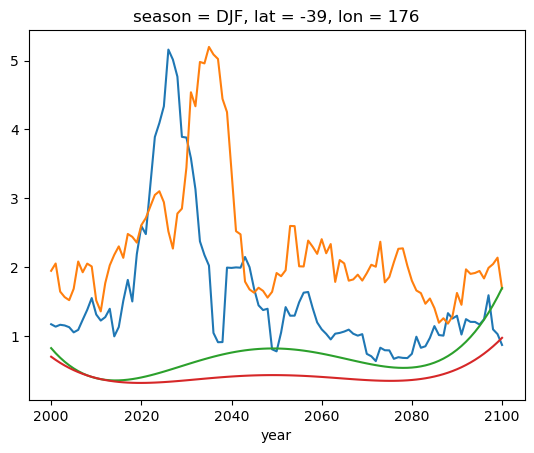

In [1499]:
I_raw_C.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_raw_A.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_trend_A.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_trend_C.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()

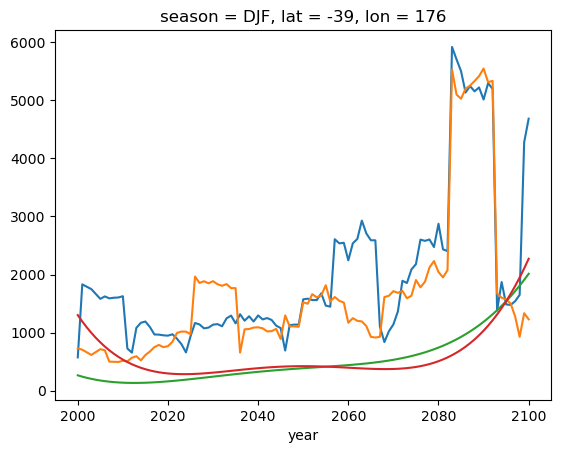

In [1500]:
I_raw_C_r.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_raw_A_r.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_trend_A_r.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()
I_trend_C_r.where(static_fields.orog>0, np.nan).interp(lat =-39, lon =176).plot()

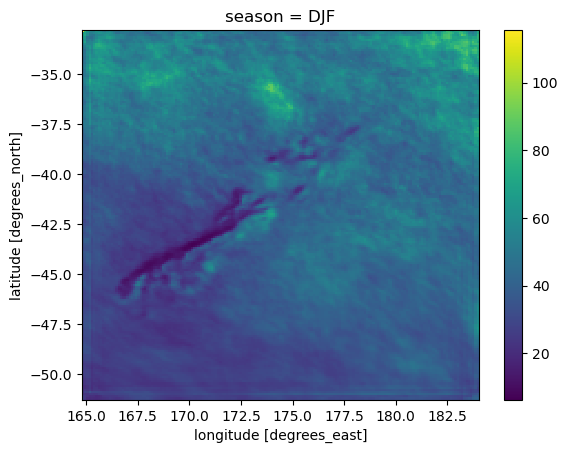

In [1361]:
I_model_r.plot()

In [1324]:
z1 = np.random.rand((2000)) * 2
z3 = np.random.rand((2000)) * 5

In [1326]:
((z1 - z3.mean())/z3.mean()).mean()

-0.5992774706769708

In [1327]:
((z1.mean() - z3.mean())/z3.mean())

-0.5992774706769708

In [1432]:
z1 = pr_dset_le.RX1Day_IV.sel(GCM_variant =(pr_dset_le.GCM =="ACCESS-ESM1-5")).interp(lat =-45, lon =168).rolling(year =10).mean()#.var("GCM_variant").plot()#.RX1Day_IV.rolling(year =20).mean().plot()
z2 = pr_dset_le.RX1Day_IV.sel(GCM_variant =(pr_dset_le.GCM =="CanESM5")).interp(lat =-45, lon =168).rolling(year =10).mean()#.var("GCM_variant").plot()#.RX1Day_IV.rolling(year =20).mean().plot()

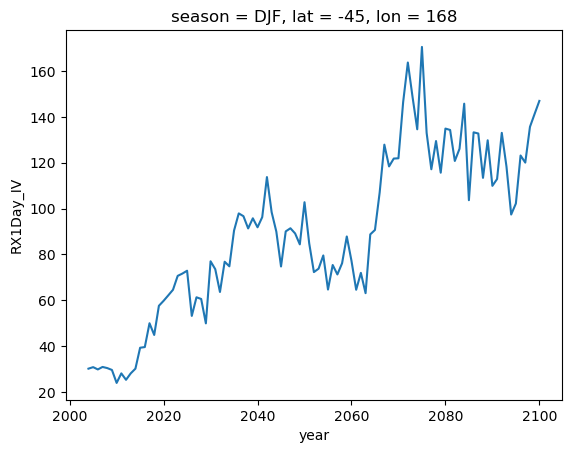

In [1433]:
z1.var("GCM_variant").plot()

In [ ]:
pr_dset_le.RX1Day_IV.ro

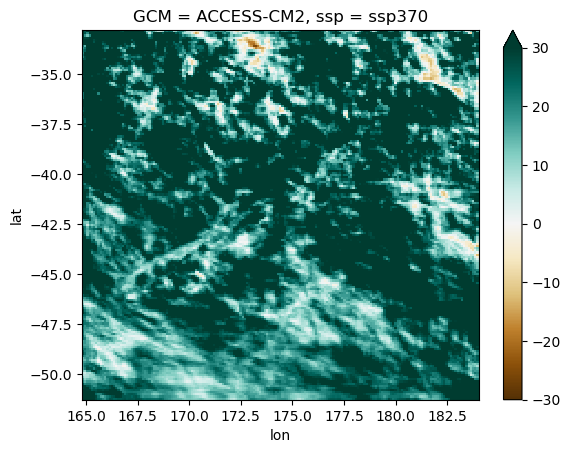

In [1359]:
fitted_r.sel(year = slice(2080,2099)).sel(GCM ="ACCESS-CM2", ssp="ssp370").mean(["year"]
                                                                              ).plot(cmap ='BrBG', vmin =-30, vmax =30)

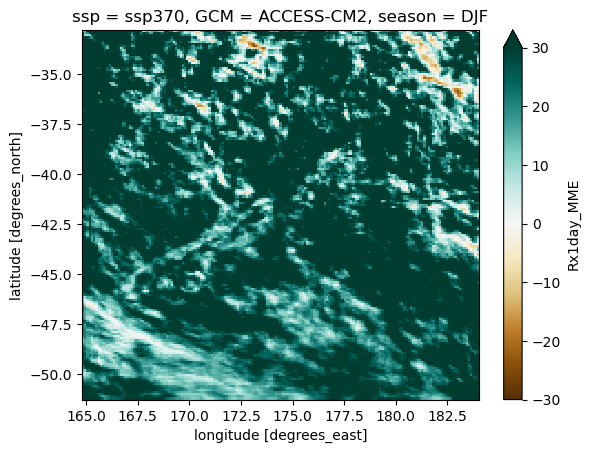

In [1358]:
pr_dset.Rx1day_MME.sel(year = slice(2080,2099)).sel(GCM ="ACCESS-CM2", ssp="ssp370").mean(["year"]
                                                                              ).plot(cmap ='BrBG', vmin =-30, vmax =30)

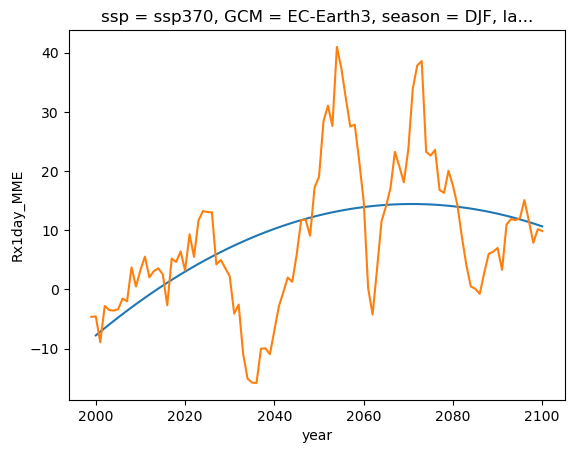

In [43]:
fitted_r.sel(GCM ="EC-Earth3", ssp="ssp370").interp(lat =-39, lon =176).plot()
pr_dset.Rx1day_MME.rolling(year =10, min_periods =5).mean().sel(GCM ="EC-Earth3", ssp="ssp370").interp(lat =-39, lon =176).plot()

Text(0.5, 0.97, 'Forced Response for ACCESS-CM2 (SSP3-7.0) at \n -39$\\degree$S, 176$\\degree$E')

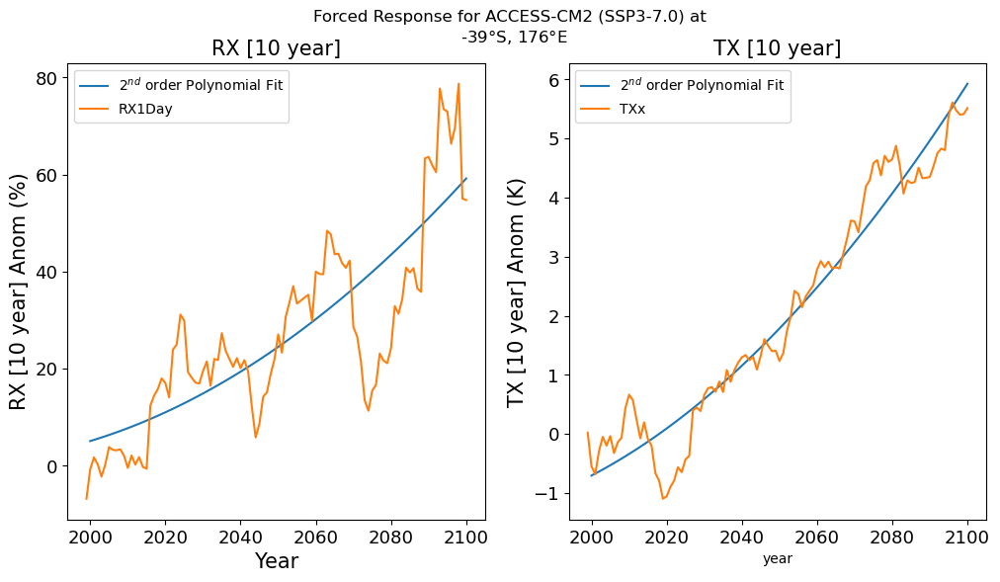

In [92]:
fig, ax = plt.subplots(1,2 , figsize = (12, 6), sharex=True)
fitted_r.sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot(ax = ax[0], label ='$2^{nd}$ order Polynomial Fit' )
pr_dset.Rx1day_MME.rolling(year =10, min_periods =5).mean().sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot(ax = ax[0], label ='RX1Day')

fitted_T.sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot(ax = ax[1], label ='$2^{nd}$ order Polynomial Fit' )
t_dset.TXX_MME.rolling(year =10, min_periods =5).mean().sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot(ax=ax[1], label ='TXx')
ax[1].set_ylabel('TX [10 year] Anom (K)', fontsize =15,)
ax[0].set_ylabel('RX [10 year] Anom (%)', fontsize = 15)
ax[0].tick_params(labelsize =13)
ax[1].tick_params(labelsize =13)
ax[0].set_xlabel('Year', fontsize =15)
ax[0].legend(fontsize =10)
ax[1].legend(fontsize =10)
ax[0].set_title('RX [10 year]', fontsize =15)
ax[1].set_title('TX [10 year]', fontsize =15)
fig.suptitle('Forced Response for ACCESS-CM2 (SSP3-7.0) at \n -39$\degree$S, 176$\degree$E', x= 0.5, y =0.97)
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/illustration_of_forced_response_10year_v2.png', dpi =500, bbox_inches ='tight')

In [95]:
ratio = I_model_r/ (I_raw_A_r/2 + I_raw_C_r/2)
ratio_t = I_model/ (I_raw_A/2 + I_raw_C/2)

Text(171, -33.5, 'TXx')

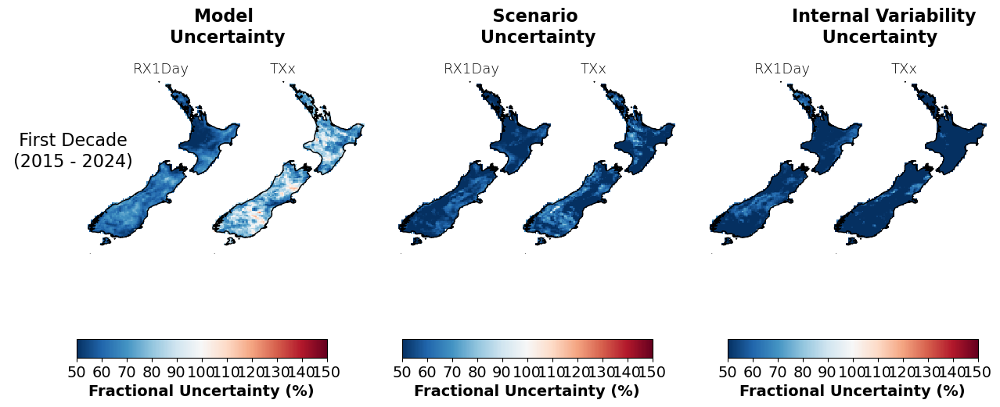

In [99]:


fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(2, 16, hspace=-0.65, wspace=0.65)
ax1 = fig.add_subplot(gs[0:2,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax2 = fig.add_subplot(gs[0:2,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax3 = fig.add_subplot(gs[0:2,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax4 = fig.add_subplot(gs[0:2,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax5 = fig.add_subplot(gs[0:2,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax6 = fig.add_subplot(gs[0:2,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))


axes = [ax1, ax2, ax3, ax4, ax5, ax6]

cs1 = ratio_t.sel(year =slice(2015,2035)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax1, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs2 = ratio_t.sel(year =slice(2040,2060)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax3, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs3 = ratio_t.sel(year =slice(2080,2099)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax5, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs1 = ratio.sel(year =slice(2015,2035)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax2, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs2 = ratio.sel(year =slice(2040,2060)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax4, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs3 = ratio.sel(year =slice(2080,2099)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax6, cmap ='RdBu_r', vmin =0.5, vmax =1.5, transform = ccrs.PlateCarree(), add_colorbar =False)

# ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
# ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
# ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
# ax[1,0].set_title(' ')
# ax[1,1].set_title(' ')
# ax[1,2].set_title(' ')
# ax[0,0].coastlines('10m')
# ax[0,1].coastlines('10m')
# ax[0,2].coastlines('10m')
# ax[1,0].coastlines('10m')
# ax[1,1].coastlines('10m')
# ax[1,2].coastlines('10m')
[axi.set_extent([166, 179, -48, -33], crs = ccrs.PlateCarree()) for axi in axes]
[axi.set_title(' ') for axi in axes]
[axi.coastlines('10m') for axi in axes]
[axi.set_frame_on(False) for axi in axes]
ax1.text(173, -31, '    Model \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax3.text(173, -31, '  Scenario \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax5.text(173, -31, 'Internal Variability\n     Uncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax14 = fig.add_axes([0.12, 0.18, 0.2, 0.03])
cbar = fig.colorbar(cs1, cax = ax14, orientation ='horizontal')
cbar.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')
ax15 = fig.add_axes([0.38, 0.18, 0.2, 0.03])
cbar2 = fig.colorbar(cs2, cax = ax15, orientation ='horizontal')
cbar2.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')

ax16 = fig.add_axes([0.64, 0.18, 0.2, 0.03])
cbar3 = fig.colorbar(cs3, cax = ax16, orientation ='horizontal')
cbar3.set_label('Fractional Uncertainty (%)', fontsize =14,  weight ='bold')
cbar.set_ticks(np.arange(0.5, 1.6, 0.1))
cbar.set_ticklabels(["%.0f" % f for f in np.arange(0.5, 1.6, 0.1)*100])
cbar2.set_ticks(np.arange(0.5, 1.6, 0.1))
cbar2.set_ticklabels(["%.0f" % f for f in np.arange(0.5, 1.6, 0.1)*100])

cbar3.set_ticks(np.arange(0.5, 1.6, 0.1))
cbar3.set_ticklabels(["%.0f" % f for f in np.arange(0.5, 1.6, 0.1)*100])
cbar3.ax.tick_params(labelsize =14)
cbar2.ax.tick_params(labelsize =14)
cbar.ax.tick_params(labelsize =14)
ax1.text(160, -41, '  First Decade \n (2015 - 2024)', fontsize =16,  transform = ccrs.PlateCarree())
#ax11.text(160, -41, '  Last Decade \n (2090 - 2099)', fontsize =16, transform = ccrs.PlateCarree())
ax1.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax2.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)

ax3.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax4.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax5.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax6.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
#fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_static_I_v040525.png', dpi =500, bbox_inches ='tight')
#fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_static_I_v040525.pdf', dpi =300, bbox_inches ='tight')
# ax[0,0].text(165, -43, '2015 - 2025', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# ax[1,0].text(165, -43, '2090 - 2100', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# [ax[i,j].set_frame_on(False) for i in range(2) for j in range(3)]

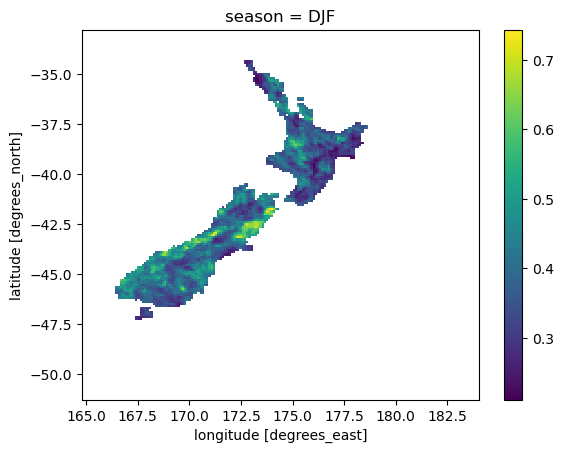

In [89]:
ratio.sel(year = slice("2080","2099")).mean("year").where(static_fields.orog>0, np.nan).plot()

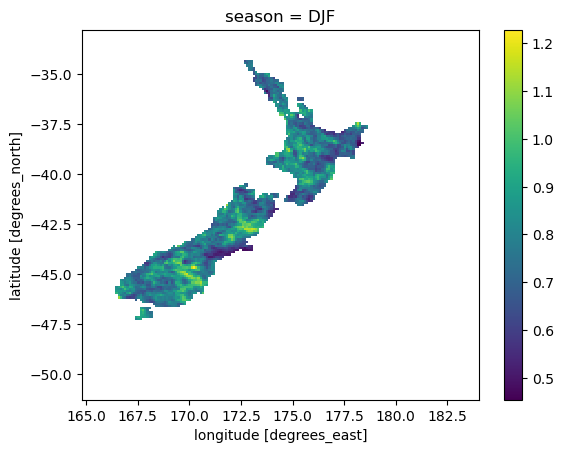

In [90]:
ratio.sel(year = slice("2015","2035")).mean("year").where(static_fields.orog>0, np.nan).plot()

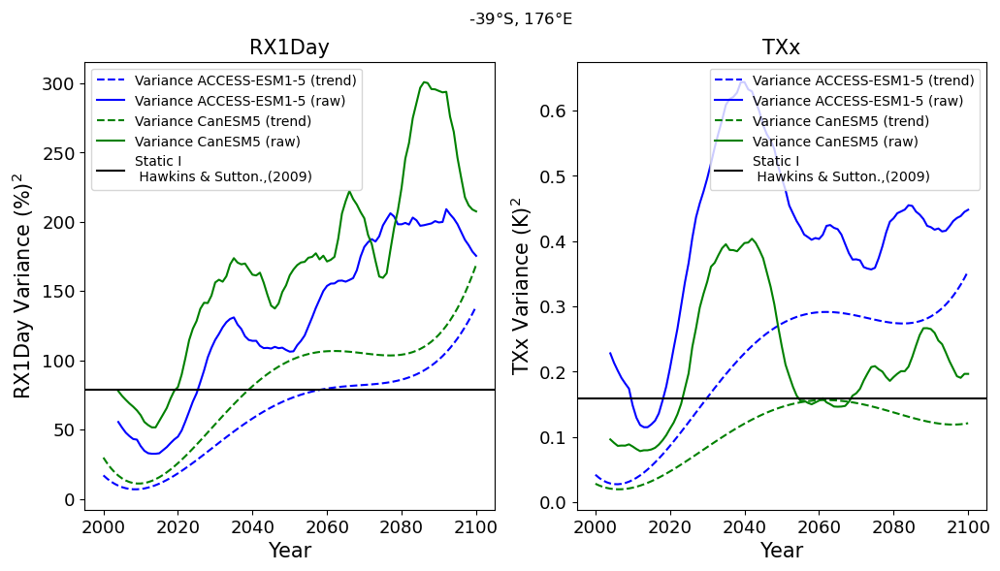

In [94]:
fig, ax = plt.subplots(1,2 , figsize = (12, 6), sharex=True)
I_trend_A_r.interp(lat =-39, lon =176).plot(ax = ax[0], label ='Variance ACCESS-ESM1-5 (trend)', color ='blue', ls ='--')
I_raw_A_r.interp(lat =-39, lon =176).rolling(year =10, min_periods =5).mean().plot(ax = ax[0], label ='Variance ACCESS-ESM1-5 (raw)', color ='blue')
I_trend_C_r.interp(lat =-39, lon =176).plot(ax = ax[0], label ='Variance CanESM5 (trend)', color ='g', ls ='--' )
I_raw_C_r.interp(lat =-39, lon =176).rolling(year =10, min_periods =5).mean().plot(ax = ax[0], label ='Variance CanESM5 (raw)', color ='green')               
ax[0].axhline(I_model_r.interp(lat =-39, lon =176), label ='Static I \n Hawkins & Sutton.,(2009)', color ='k') 

I_trend_A.interp(lat =-39, lon =176).plot(ax = ax[1], label ='Variance ACCESS-ESM1-5 (trend)', color ='blue', ls ='--')
I_raw_A.interp(lat =-39, lon =176).rolling(year =10, min_periods =5).mean().plot(ax = ax[1], label ='Variance ACCESS-ESM1-5 (raw)', color ='blue')
I_trend_C.interp(lat =-39, lon =176).plot(ax = ax[1], label ='Variance CanESM5 (trend)', color ='g', ls ='--' )
I_raw_C.interp(lat =-39, lon =176).rolling(year =10, min_periods =5).mean().plot(ax = ax[1], label ='Variance CanESM5 (raw)', color ='green') 
ax[1].axhline(I_model.interp(lat =-39, lon =176), label ='Static I \n Hawkins & Sutton.,(2009)', color ='k') 

ax[1].set_ylabel('TXx Variance (K)$^2$', fontsize =15,)
ax[0].set_ylabel('RX1Day Variance (%)$^2$', fontsize = 15)
ax[0].tick_params(labelsize =13)
ax[1].tick_params(labelsize =13)
ax[0].set_xlabel('Year', fontsize =15)
ax[1].set_xlabel('Year', fontsize =15)
ax[0].legend(fontsize =10)
ax[1].legend(fontsize =10)
ax[0].set_title('RX1Day', fontsize =15)
ax[1].set_title('TXx', fontsize =15)
fig.suptitle('-39$\degree$S, 176$\degree$E', x= 0.5, y =0.97)
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/illustration_of_variance_comparison_rx1day_txx.png', dpi =500, bbox_inches ='tight')

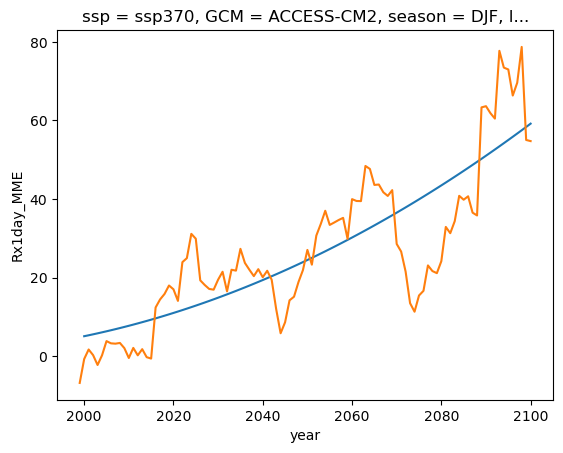

In [44]:
fitted_r.sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot()
pr_dset.Rx1day_MME.rolling(year =10, min_periods =5).mean().sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot()

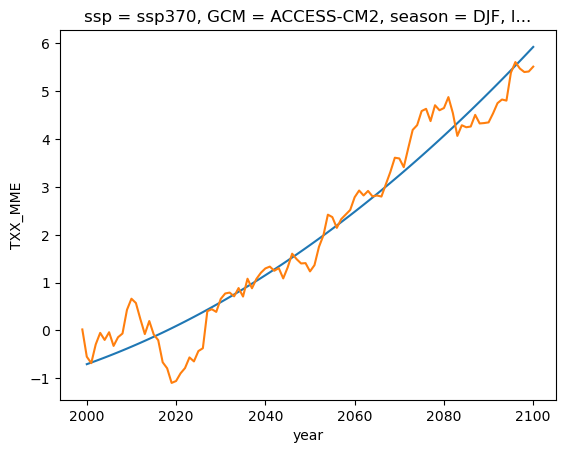

In [47]:
fitted_T.sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot()
t_dset.TXX_MME.rolling(year =10, min_periods =5).mean().sel(GCM ="ACCESS-CM2", ssp="ssp370").interp(lat =-39, lon =176).plot()

In [19]:
import matplotlib.pyplot as plt
import numpy as np

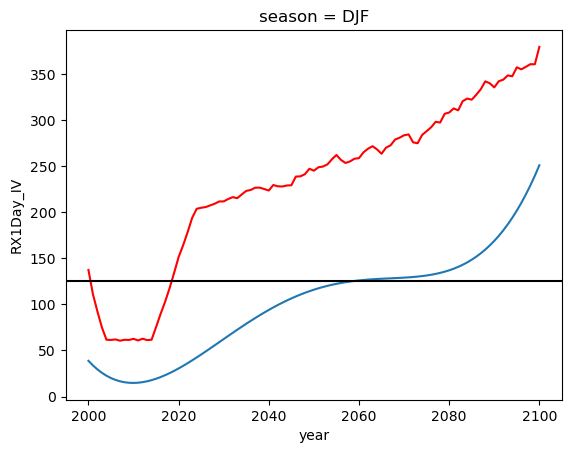

In [37]:
I_trend_A_r.mean(["lat","lon"]).dropna("year").plot()
I_raw_A_r.mean(["lat","lon"]).dropna("year").plot(color ='r')
plt.axhline(I_model_r.mean(["lat","lon"]), color ='k')

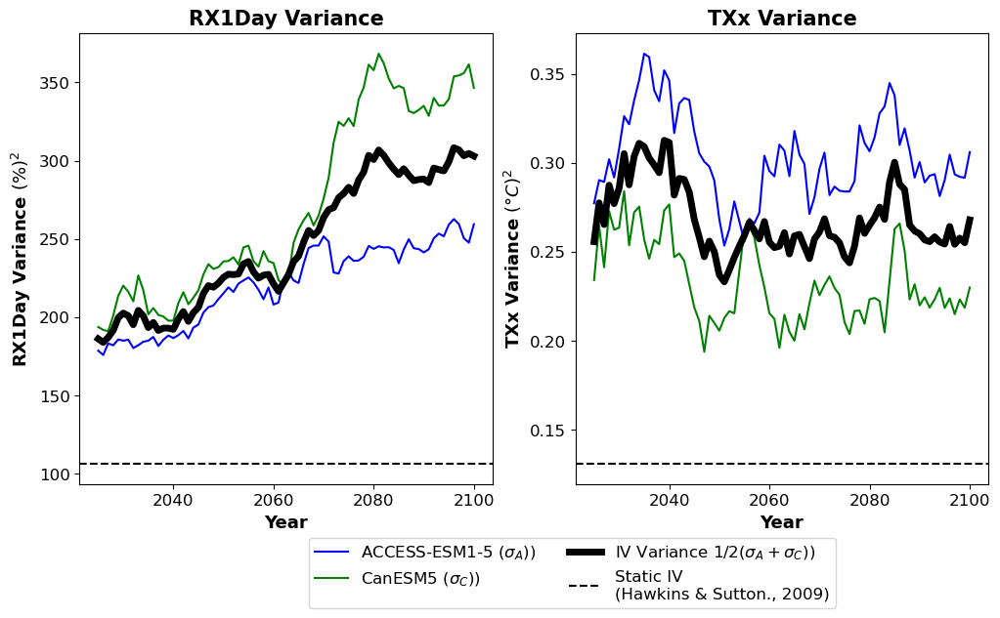

In [38]:
fig, ax = plt.subplots(1,2, figsize = (12,6))


#I_trend_A_r.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='b', ls ='--', ax = ax[0])
#I_trend_C_r.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='g', ls ='--', ax =ax[0])
I_raw_A_r.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='b', ax = ax[0])
I_raw_C_r.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='g', ax=ax[0])
(1/2 * (I_raw_C_r +I_raw_A_r)) .where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='k', ax=ax[0], ls ='-', lw =5)

#I_trend_A.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='b', ls ='--', ax = ax[1], label ='Trend ACCESS-ESM1-5 ($\sigma_{A[t]}$))' )
#I_trend_C.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='g', ls ='--', ax =ax[1], label ='Trend CanESM5 ($\sigma_{C[t]}$))' )
I_raw_A.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='b', ax = ax[1], label = 'ACCESS-ESM1-5 ($\sigma_A$))')
I_raw_C.where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='g', ax=ax[1], label = 'CanESM5 ($\sigma_C$))')
(1/2 * (I_raw_C +I_raw_A)) .where(static_fields.orog>0, np.nan).mean(["lat","lon"]).dropna("year").sel(year = slice(2025, 2100)).plot(color ='k', ax=ax[1], ls ='-', lw =5, label ='IV Variance 1/2($\sigma_A +\sigma_C$))')
ax[0].axhline(I_model_r.where(static_fields.orog>0, np.nan).mean(["lat","lon"]), color ='k', ls ='--')
ax[1].axhline(I_model.where(static_fields.orog>0, np.nan).mean(["lat","lon"]), color ='k', label ='Static IV \n(Hawkins & Sutton., 2009)', ls ='--')
ax[1].legend(bbox_to_anchor = (0.65, -0.1), fontsize =12, ncol =2
            )
ax[0].set_xlabel('Year', weight ='bold', fontsize=13)
ax[1].set_xlabel('Year', weight ='bold', fontsize =13)
ax[0].tick_params(labelsize =12)
ax[1].tick_params(labelsize =12)
ax[1].set_ylabel('TXx Variance $(\degree C)^2$', fontsize =13, weight='bold')
ax[0].set_ylabel('RX1Day Variance $(\%)^2$', fontsize =13, weight='bold')
ax[0].set_title('RX1Day Variance', fontsize =15, weight ='bold')
ax[1].set_title('TXx Variance', fontsize =15, weight ='bold')
#
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Assumptions_for_Internal_Variability_1year.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Assumptions_for_Internal_Variability_1year.pdf', dpi =500, bbox_inches ='tight')
#ax[0].grid('on')

In [1582]:
I_var_pr = np.sqrt(1/2* (I_raw_C_r + I_raw_A_r))
M_var_pr = np.sqrt( M_r)
S_var_pr = np.sqrt(S_r)

In [1583]:
I_var = np.sqrt(1/2* (I_trend_C + I_trend_A))
M_var = np.sqrt( M)
S_var = np.sqrt(S)

In [30]:
from matplotlib.colors import LinearSegmentedColormap
import earthpy.spatial as es
hillshade_dset = xr.open_dataset(r'/nesi/project/niwa00018/gibsonp/dload_data/global_topo_1km/topo_NZ_1km.nc')
hillshade = es.hillshade(hillshade_dset.topo.values, azimuth=0, altitude=45)
hillshade_dset['hillshade'] = (('Y','X'), hillshade)


#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.pdf', dpi =500, bbox_inches ='tight')

regions = {'Auckland': (-36.7928, 174.6131),
 'Tauranga': (-37.6870, 176.1654),
 'New Plymouth': (-39.0572, 174.0794),
 'Nelson': (-41.2732,  173.2854),
 'Christchurch': (-43.5320, 172.6366),
 'Milford Sound': (-44.6414, 167.8974),
 'Napier': (-39.4893, 176.9192)}

regions = {'Auckland': (-36.7928, 174.6131),
 'Christchurch': (-43.5320, 172.6366),
 'Tasman Sea': (-40.6414, 165.8974)}

offsets = {'Auckland': (0.1, -0.2),
 'Tauranga': (0.07, 0.025),
 'New Plymouth': (0.05, -0.15),
 'Nelson': (0.0,  -0.15),
 'Christchurch': (-0.12, 0.03),
 'Tasman Sea': (0.38, -0.05),
 'Napier': (-0.17, 0.02)}

offsets = {'Auckland': (0.1, -0.02),
 'Tauranga': (0.07, 0.025),
 'Wellington': (0.0, -0.32),
 'Nelson': (0.0,  -0.15),
 'Christchurch': (-0.22, 0.03),
 'Tasman Sea': (0.10, -0.05),
 'Napier': (-0.17, 0.02)}

offset_lon = [-0.25,0.15,-0.15, -0.25, -0.35, +0.25, 0.00]
offset_lat = [0,0,0.0, -0.15,0,0,-0.15]
#offset_lat = [0.0,0.0 

# Define custom colormap colors (approximated from the image)
colors = [    # Slightly lighter green
    (0.0,  "yellowgreen"), # Yellowish green
    (0.25,  "yellow"),     # Bright yellow
    (0.5, "orange"),     # Warm orange
    (0.75,  "saddlebrown"), # Reddish-brown
    (1.0,  "white")       # Lightest color on the far right
]

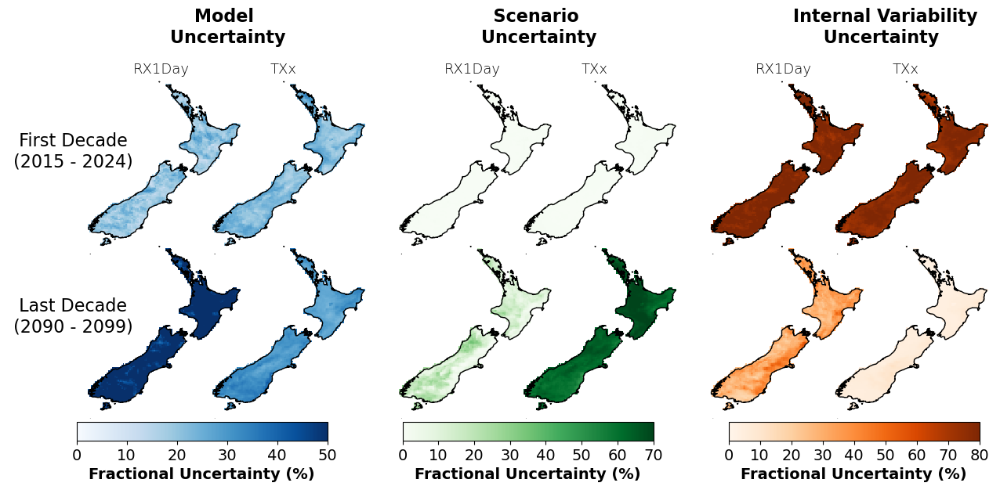

In [1992]:
i =0
I_r = I_model_r#1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r#.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1


i =0
I = I_model#1/2* (I_raw_C + I_raw_A)
I = I#.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T

fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(4, 16, hspace=-0.65, wspace=0.65)
ax1 = fig.add_subplot(gs[0:2,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax2 = fig.add_subplot(gs[0:2,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax3 = fig.add_subplot(gs[0:2,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax4 = fig.add_subplot(gs[0:2,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax5 = fig.add_subplot(gs[0:2,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax6 = fig.add_subplot(gs[0:2,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))


ax11 = fig.add_subplot(gs[2:4,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax22 = fig.add_subplot(gs[2:4,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax33 = fig.add_subplot(gs[2:4,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax44 = fig.add_subplot(gs[2:4,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax55 = fig.add_subplot(gs[2:4,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax66 = fig.add_subplot(gs[2:4,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))

axes = [ax11, ax22, ax33, ax44, ax55, ax66, ax1, ax2, ax3, ax4, ax5, ax6]
#fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), sharex=True, sharey =True)
cs1 = M_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax11, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs2 = S_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax33, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
cs3 = I_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax55, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax1, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax3, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax5, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax22, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax44, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax66, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax2, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax4, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax6, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)
# ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
# ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
# ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
# ax[1,0].set_title(' ')
# ax[1,1].set_title(' ')
# ax[1,2].set_title(' ')
# ax[0,0].coastlines('10m')
# ax[0,1].coastlines('10m')
# ax[0,2].coastlines('10m')
# ax[1,0].coastlines('10m')
# ax[1,1].coastlines('10m')
# ax[1,2].coastlines('10m')
[axi.set_extent([166, 179, -48, -33], crs = ccrs.PlateCarree()) for axi in axes]
[axi.set_title(' ') for axi in axes]
[axi.coastlines('10m') for axi in axes]
[axi.set_frame_on(False) for axi in axes]
ax1.text(173, -31, '    Model \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax3.text(173, -31, '  Scenario \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax5.text(173, -31, 'Internal Variability\n     Uncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax14 = fig.add_axes([0.12, 0.18, 0.2, 0.03])
cbar = fig.colorbar(cs1, cax = ax14, orientation ='horizontal')
cbar.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')
ax15 = fig.add_axes([0.38, 0.18, 0.2, 0.03])
cbar2 = fig.colorbar(cs2, cax = ax15, orientation ='horizontal')
cbar2.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')

ax16 = fig.add_axes([0.64, 0.18, 0.2, 0.03])
cbar3 = fig.colorbar(cs3, cax = ax16, orientation ='horizontal')
cbar3.set_label('Fractional Uncertainty (%)', fontsize =14,  weight ='bold')
cbar.set_ticks(np.arange(0, 0.6, 0.1))
cbar.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.6, 0.1)*100])
cbar2.set_ticks(np.arange(0, 0.8, 0.1))
cbar2.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.8, 0.1)*100])

cbar3.set_ticks(np.arange(0, 0.9, 0.1))
cbar3.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.9, 0.1)*100])
cbar3.ax.tick_params(labelsize =14)
cbar2.ax.tick_params(labelsize =14)
cbar.ax.tick_params(labelsize =14)
ax1.text(160, -41, '  First Decade \n (2015 - 2024)', fontsize =16,  transform = ccrs.PlateCarree())
ax11.text(160, -41, '  Last Decade \n (2090 - 2099)', fontsize =16, transform = ccrs.PlateCarree())
ax1.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax2.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)

ax3.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax4.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax5.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax6.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_static_I_v040525.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_static_I_v040525.pdf', dpi =300, bbox_inches ='tight')
# ax[0,0].text(165, -43, '2015 - 2025', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# ax[1,0].text(165, -43, '2090 - 2100', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# [ax[i,j].set_frame_on(False) for i in range(2) for j in range(3)]

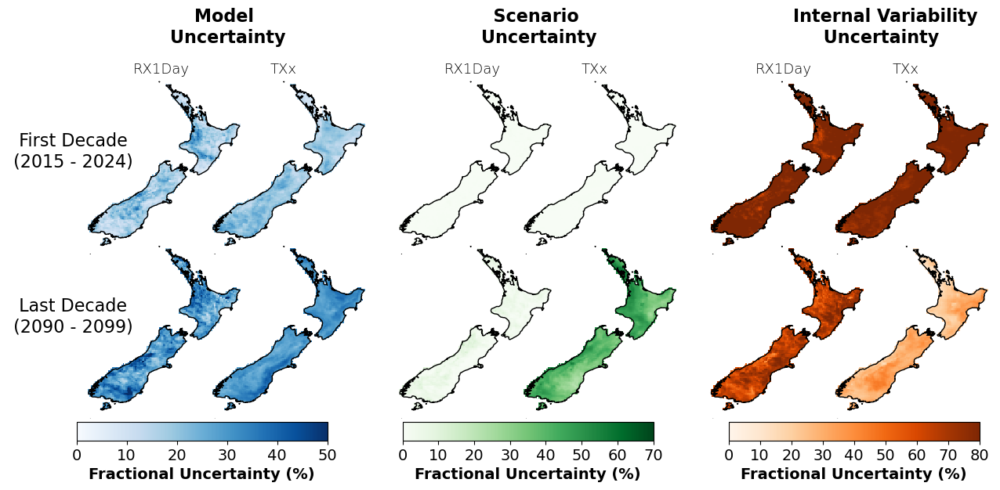

In [33]:
i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1


i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T

fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(4, 16, hspace=-0.65, wspace=0.65)
ax1 = fig.add_subplot(gs[0:2,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax2 = fig.add_subplot(gs[0:2,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax3 = fig.add_subplot(gs[0:2,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax4 = fig.add_subplot(gs[0:2,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax5 = fig.add_subplot(gs[0:2,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax6 = fig.add_subplot(gs[0:2,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))


ax11 = fig.add_subplot(gs[2:4,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax22 = fig.add_subplot(gs[2:4,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax33 = fig.add_subplot(gs[2:4,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax44 = fig.add_subplot(gs[2:4,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax55 = fig.add_subplot(gs[2:4,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax66 = fig.add_subplot(gs[2:4,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))

axes = [ax11, ax22, ax33, ax44, ax55, ax66, ax1, ax2, ax3, ax4, ax5, ax6]
#fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), sharex=True, sharey =True)
cs1 = M_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax11, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs2 = S_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax33, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
cs3 = I_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax55, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax1, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax3, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax5, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax22, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax44, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax66, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax2, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax4, cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax6, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)
# ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
# ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
# ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
# ax[1,0].set_title(' ')
# ax[1,1].set_title(' ')
# ax[1,2].set_title(' ')
# ax[0,0].coastlines('10m')
# ax[0,1].coastlines('10m')
# ax[0,2].coastlines('10m')
# ax[1,0].coastlines('10m')
# ax[1,1].coastlines('10m')
# ax[1,2].coastlines('10m')
[axi.set_extent([166, 179, -48, -33], crs = ccrs.PlateCarree()) for axi in axes]
[axi.set_title(' ') for axi in axes]
[axi.coastlines('10m') for axi in axes]
[axi.set_frame_on(False) for axi in axes]
ax1.text(173, -31, '    Model \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax3.text(173, -31, '  Scenario \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax5.text(173, -31, 'Internal Variability\n     Uncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax14 = fig.add_axes([0.12, 0.18, 0.2, 0.03])
cbar = fig.colorbar(cs1, cax = ax14, orientation ='horizontal')
cbar.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')
ax15 = fig.add_axes([0.38, 0.18, 0.2, 0.03])
cbar2 = fig.colorbar(cs2, cax = ax15, orientation ='horizontal')
cbar2.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')

ax16 = fig.add_axes([0.64, 0.18, 0.2, 0.03])
cbar3 = fig.colorbar(cs3, cax = ax16, orientation ='horizontal')
cbar3.set_label('Fractional Uncertainty (%)', fontsize =14,  weight ='bold')
cbar.set_ticks(np.arange(0, 0.6, 0.1))
cbar.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.6, 0.1)*100])
cbar2.set_ticks(np.arange(0, 0.8, 0.1))
cbar2.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.8, 0.1)*100])

cbar3.set_ticks(np.arange(0, 0.9, 0.1))
cbar3.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.9, 0.1)*100])
cbar3.ax.tick_params(labelsize =14)
cbar2.ax.tick_params(labelsize =14)
cbar.ax.tick_params(labelsize =14)
ax1.text(160, -41, '  First Decade \n (2015 - 2024)', fontsize =16,  transform = ccrs.PlateCarree())
ax11.text(160, -41, '  Last Decade \n (2090 - 2099)', fontsize =16, transform = ccrs.PlateCarree())
ax1.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax2.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)

ax3.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax4.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax5.text(170, -33.5, 'RX1Day', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax6.text(171, -33.5, 'TXx', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_v040525.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_v040525.pdf', dpi =300, bbox_inches ='tight')
# ax[0,0].text(165, -43, '2015 - 2025', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# ax[1,0].text(165, -43, '2090 - 2100', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# [ax[i,j].set_frame_on(False) for i in range(2) for j in range(3)]

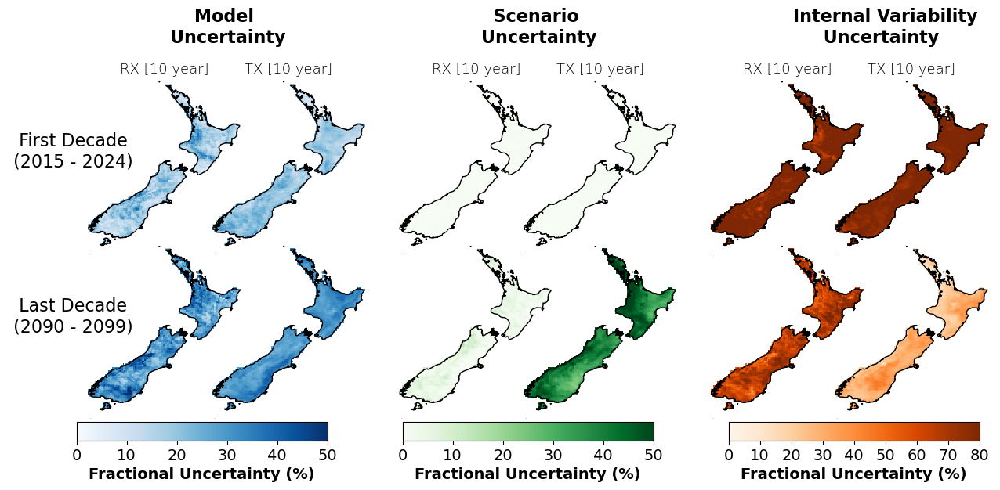

In [34]:
i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1


i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T

fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(4, 16, hspace=-0.65, wspace=0.65)
ax1 = fig.add_subplot(gs[0:2,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax2 = fig.add_subplot(gs[0:2,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax3 = fig.add_subplot(gs[0:2,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax4 = fig.add_subplot(gs[0:2,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax5 = fig.add_subplot(gs[0:2,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax6 = fig.add_subplot(gs[0:2,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))


ax11 = fig.add_subplot(gs[2:4,0:3], projection=ccrs.PlateCarree(central_longitude =171.77))
ax22 = fig.add_subplot(gs[2:4,2:5], projection=ccrs.PlateCarree(central_longitude =171.77))
ax33 = fig.add_subplot(gs[2:4,5:8], projection=ccrs.PlateCarree(central_longitude =171.77))
ax44 = fig.add_subplot(gs[2:4,7:10], projection=ccrs.PlateCarree(central_longitude =171.77))
ax55 = fig.add_subplot(gs[2:4,10:13], projection=ccrs.PlateCarree(central_longitude =171.77))
ax66 = fig.add_subplot(gs[2:4,12:15], projection=ccrs.PlateCarree(central_longitude =171.77))

axes = [ax11, ax22, ax33, ax44, ax55, ax66, ax1, ax2, ax3, ax4, ax5, ax6]
#fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), sharex=True, sharey =True)
cs1 = M_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax11, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs2 = S_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax33, cmap ='Greens', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
cs3 = I_f1.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax55, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax1, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax3, cmap ='Greens', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f1.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax5, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax22, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax44, cmap ='Greens', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax66, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)

M_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax2, cmap ='Blues', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
S_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax4, cmap ='Greens', vmin =0, vmax =0.5, transform = ccrs.PlateCarree(), add_colorbar =False)
I_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax6, cmap ='Oranges', vmin =0, vmax =0.8, transform = ccrs.PlateCarree(), add_colorbar =False)
# ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
# ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
# ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
# ax[1,0].set_title(' ')
# ax[1,1].set_title(' ')
# ax[1,2].set_title(' ')
# ax[0,0].coastlines('10m')
# ax[0,1].coastlines('10m')
# ax[0,2].coastlines('10m')
# ax[1,0].coastlines('10m')
# ax[1,1].coastlines('10m')
# ax[1,2].coastlines('10m')
[axi.set_extent([166, 179, -48, -33], crs = ccrs.PlateCarree()) for axi in axes]
[axi.set_title(' ') for axi in axes]
[axi.coastlines('10m') for axi in axes]
[axi.set_frame_on(False) for axi in axes]
ax1.text(173, -31, '    Model \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax3.text(173, -31, '  Scenario \nUncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax5.text(173, -31, 'Internal Variability\n     Uncertainty', fontsize =16, weight='bold', transform = ccrs.PlateCarree())
ax14 = fig.add_axes([0.12, 0.18, 0.2, 0.03])
cbar = fig.colorbar(cs1, cax = ax14, orientation ='horizontal')
cbar.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')
ax15 = fig.add_axes([0.38, 0.18, 0.2, 0.03])
cbar2 = fig.colorbar(cs2, cax = ax15, orientation ='horizontal')
cbar2.set_label('Fractional Uncertainty (%)', fontsize =14, weight ='bold')

ax16 = fig.add_axes([0.64, 0.18, 0.2, 0.03])
cbar3 = fig.colorbar(cs3, cax = ax16, orientation ='horizontal')
cbar3.set_label('Fractional Uncertainty (%)', fontsize =14,  weight ='bold')
cbar.set_ticks(np.arange(0, 0.6, 0.1))
cbar.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.6, 0.1)*100])
cbar2.set_ticks(np.arange(0, 0.6, 0.1))
cbar2.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.6, 0.1)*100])

cbar3.set_ticks(np.arange(0, 0.9, 0.1))
cbar3.set_ticklabels(["%.0f" % f for f in np.arange(0, 0.9, 0.1)*100])
cbar3.ax.tick_params(labelsize =14)
cbar2.ax.tick_params(labelsize =14)
cbar.ax.tick_params(labelsize =14)
ax1.text(160, -41, '  First Decade \n (2015 - 2024)', fontsize =16,  transform = ccrs.PlateCarree())
ax11.text(160, -41, '  Last Decade \n (2090 - 2099)', fontsize =16, transform = ccrs.PlateCarree())
ax1.text(169, -33.5, 'RX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax2.text(169, -33.5, 'TX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)

ax3.text(169, -33.5, 'RX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax4.text(169, -33.5, 'TX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax5.text(169, -33.5, 'RX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
ax6.text(169, -33.5, 'TX [10 year]', fontsize =13, transform = ccrs.PlateCarree(), weight ='light',)
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_rx1day_txx_10year_v040525.png', dpi =500, bbox_inches ='tight')
fig.savefig('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/internal_variability_uncertainty_spatial_rx1day_txx_rx1day_txx_10year_v040525.pdf', dpi =300, bbox_inches ='tight')
# ax[0,0].text(165, -43, '2015 - 2025', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# ax[1,0].text(165, -43, '2090 - 2100', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18, rotation =90)
# [ax[i,j].set_frame_on(False) for i in range(2) for j in range(3)]

Text(160, -41, '2099')

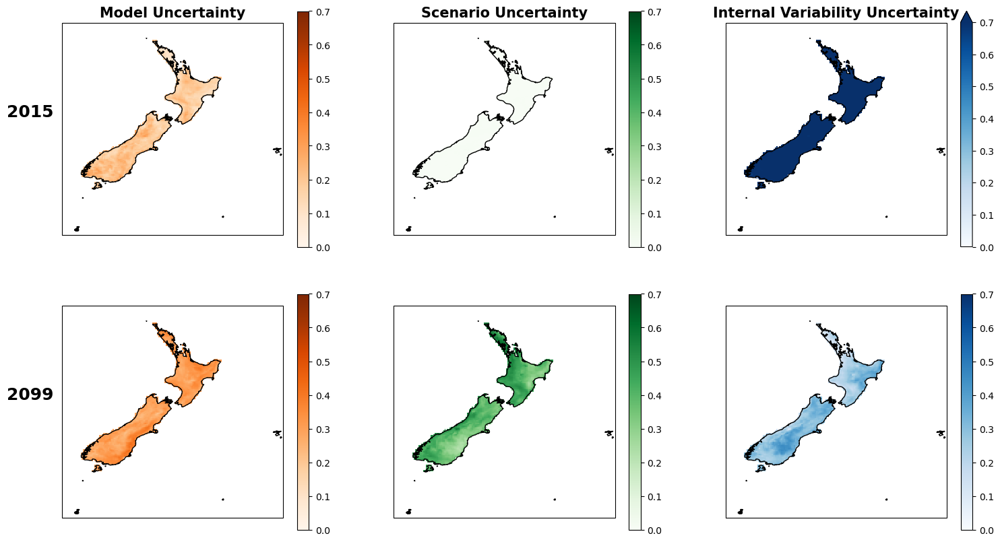

In [1883]:
i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T

fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)))
M_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[1,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[1,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_f.sel(year =slice(2090,2100)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[1,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())

M_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[0,0], cmap ='Oranges', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
S_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[0,1], cmap ='Greens', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
I_f.sel(year =slice(2015,2025)).mean("year").where(static_fields.orog>0, np.nan).plot(ax =ax[0,2], cmap ='Blues', vmin =0, vmax =0.7, transform = ccrs.PlateCarree())
ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
ax[1,0].set_title(' ')
ax[1,1].set_title(' ')
ax[1,2].set_title(' ')
ax[0,0].coastlines('10m')
ax[0,1].coastlines('10m')
ax[0,2].coastlines('10m')
ax[1,0].coastlines('10m')
ax[1,1].coastlines('10m')
ax[1,2].coastlines('10m')
ax[0,0].text(160, -41, '2015', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)
ax[1,0].text(160, -41, '2099', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)

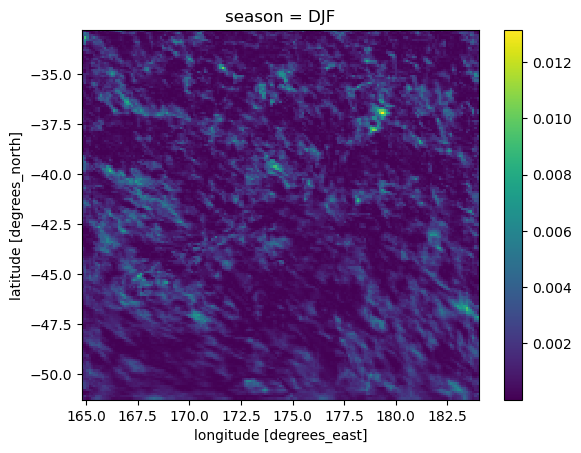

In [1636]:
I_f1.sel(year =slice(2090,2100)).var("year").plot()

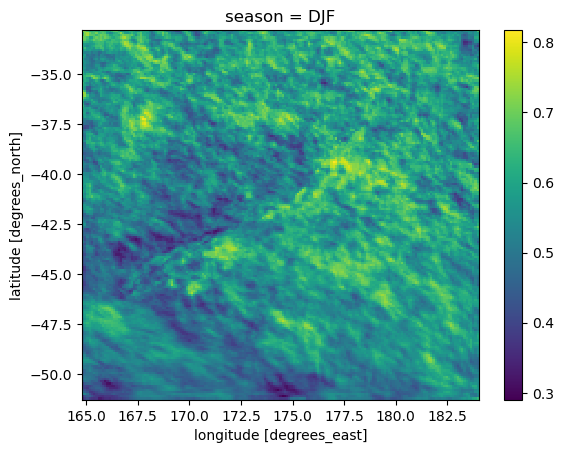

In [1635]:
I_f1.sel(year =slice(2090,2100)).mean("year").plot()

Text(160, -41, '2099')

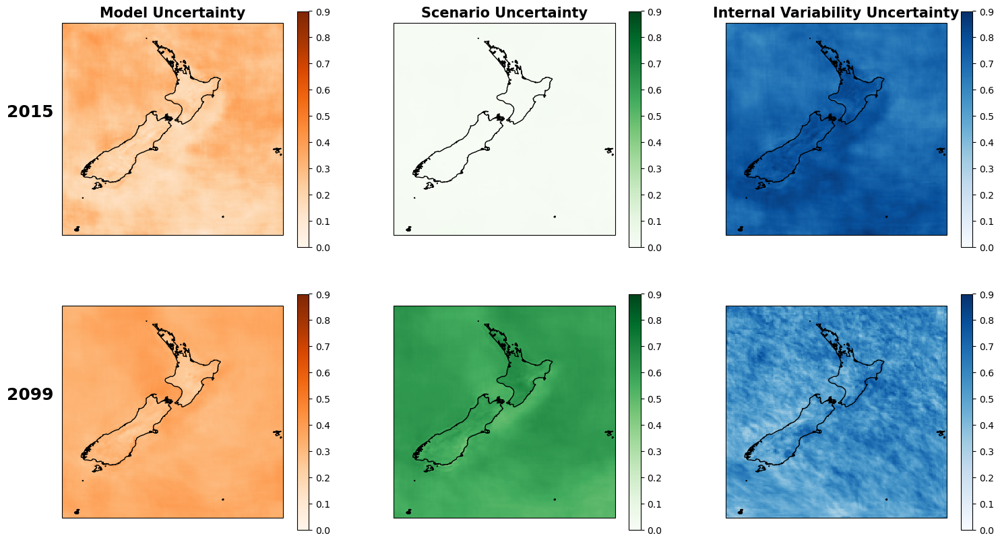

In [1626]:
i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1

fig, ax = plt.subplots(2,3, figsize = (18, 10), subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)))
M_f.sel(year =slice(2090,2100)).mean("year").plot(ax =ax[1,0], cmap ='Oranges', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())
S_f.sel(year =slice(2090,2100)).mean("year").plot(ax =ax[1,1], cmap ='Greens', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())
I_f1.sel(year =slice(2090,2100)).mean("year").plot(ax =ax[1,2], cmap ='Blues', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())

M_f.sel(year =slice(2015,2025)).mean("year").plot(ax =ax[0,0], cmap ='Oranges', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())
S_f.sel(year =slice(2015,2025)).mean("year").plot(ax =ax[0,1], cmap ='Greens', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())
I_f.sel(year =slice(2015,2025)).mean("year").plot(ax =ax[0,2], cmap ='Blues', vmin =0, vmax =0.9, transform = ccrs.PlateCarree())
ax[0,0].set_title('Model Uncertainty', weight ='bold', fontsize =15)
ax[0,1].set_title('Scenario Uncertainty', weight ='bold', fontsize =15)
ax[0,2].set_title('Internal Variability Uncertainty', weight ='bold', fontsize =15)
ax[1,0].set_title(' ')
ax[1,1].set_title(' ')
ax[1,2].set_title(' ')
ax[0,0].coastlines('10m')
ax[0,1].coastlines('10m')
ax[0,2].coastlines('10m')
ax[1,0].coastlines('10m')
ax[1,1].coastlines('10m')
ax[1,2].coastlines('10m')
ax[0,0].text(160, -41, '2015', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)
ax[1,0].text(160, -41, '2099', weight ='bold', transform = ccrs.PlateCarree(), fontsize = 18)

In [1758]:
regions = {'Auckland': (-36.7928, 174.6131),
 'Wellington': (-41.2924, 174.7787),
 'Christchurch': (-43.532, 172.6366)}

/tmp/ipykernel_203802/1022290452.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_p.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)


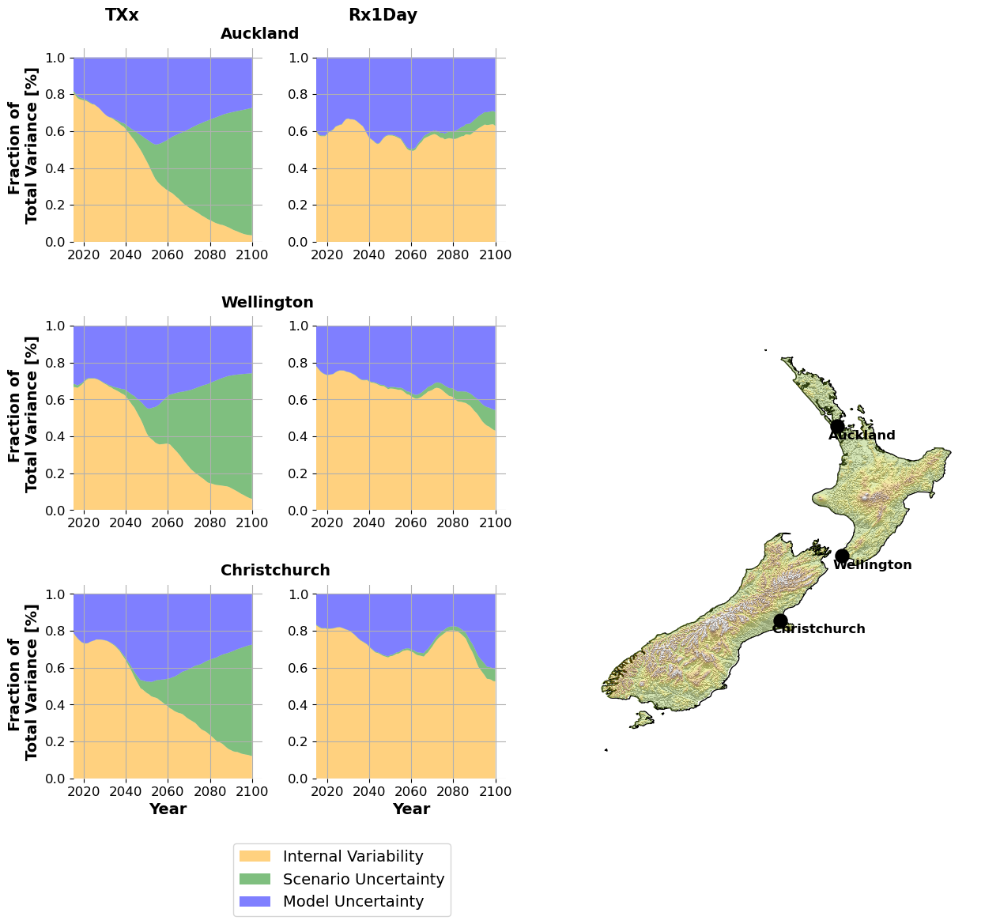

In [1755]:

# Set up figure and grid
fig = plt.figure(figsize=(15, 12))
gs = gridspec.GridSpec(9, 12, wspace=2, hspace=5)
# 64 units
# Main map
ax_map = fig.add_subplot(gs[3:12, 6:], projection=ccrs.PlateCarree())
ax_map.set_extent([165, 180, -49, -33])
hillshade_dset.hillshade.plot(ax=ax_map, transform=ccrs.PlateCarree(), cmap='Greys_r', alpha=0.5, levels=10, zorder=1, add_colorbar=False)
hillshade_dset.topo.plot(ax=ax_map, transform=ccrs.PlateCarree(), cmap=custom_cmap, alpha=0.3, levels=10, zorder=2, add_colorbar=False, vmax=1500)
ax_map.coastlines('10m')#add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1)
#ax_map.add_feature(cfeature.BORDERS, linestyle=':')
#ax_map.set_title("Locations in New Zealand")

i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T



i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1


ax1 = fig.add_subplot(gs[0:3, 0:3])
ax11 = fig.add_subplot(gs[0:3, 3:6])

ax2 = fig.add_subplot(gs[3:6 ,0:3])
ax22 = fig.add_subplot(gs[3:6, 3:6])


ax3 = fig.add_subplot(gs[6:9, 0:3])
ax33 = fig.add_subplot(gs[6:9 ,3:6])

#ax4 = fig.add_subplot(gs[9:12, 0:3])
#ax44 = fig.add_subplot(gs[9:12, 3:6])

ax_tt = [ax1, ax2, ax3]
ax_pp = [ax11, ax22, ax33]

#custom_cmap = LinearSegmentedColormap.from_list("custom_colormap", colors)


# Plot insets for each location
for i, (region, (lat, lon)) in enumerate(regions.items()):
    row, col = divmod(i, 2)

    # Temperature subplot
    ax_t = ax_tt[i]#fig.add_subplot(gs[row, col+1])
    ax_p = ax_pp[i]

    
    ax_t.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_p.stackplot(
        I_f1.year,
        I_f1.sel(lat =lat, lon =lon, method ='nearest'),
        S_f1.sel(lat =lat, lon =lon, method ='nearest'),
        M_f1.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)
    #ax_t.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_t.set_ylabel("Fraction of \nTotal Variance [%]", fontsize=14, fontweight='bold')
    #ax_t.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    #ax_t.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])

    #ax_t.set_title(region, fontsize=12, weight ='bold')
    ax_t.grid('on')
    
    #ax_p.set_title(region, fontsize=12, weight ='bold')
    ax_p.grid('on')
    ax_p.set_xlim(2015, None)
    ax_t.set_xlim(2015, None)
    ax_t.set_xticks([2020, 2040, 2060, 2080, 2100])
    ax_t.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)
    ax_p.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)
    ax_p.set_xticks([2020, 2040, 2060, 2080, 2100])
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
   
    # Convert map coordinates to figure coordinates
    #x_fig, y_fig = ax_map.transData.transform((lon, lat))
    #x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    #offset_lat, offset_lon = offsets[region]
    ## Adjust position of violin plot
    #ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_t.tick_params(labelsize =12
                         )
    ax_p.tick_params(labelsize =12
                         )

    ax_p.grid('on')
    ax_t.grid('on')
    ax_p.set_frame_on(False)
    ax_t.set_frame_on(False)
    ax_t.text(2085, 1.1, region, fontsize =14, weight ='bold')
ax_map.set_frame_on(False)
    #ax_p.plot(t_dset.year.values, means2, color ='k', lw =1, zorder =6, marker ='o',ms =2)

    # Precipitation subplot (on twin y-axis)
    #ax_t.twinx()
    
    #ivar_P = I_var.interp(lat=lat, lon=lon, method='nearest')  # Update if separate I_var for P
    #mvar_P = M_var.interp(lat=lat, lon=lon, method='nearest')  # Update if separate M_var for P

    #ax_p.plot(t_dset.year.values, means_P, color='blue', lw=1.5, label='Precipitation')
    #ax_p.fill_between(t_dset.year.values, means_P - ivar_P, means_P + ivar_P, alpha=0.3, color='blue')
    #ax_p.set_ylabel("mm/day")
ax_t.set_xlabel("Year", fontsize =14, weight ='bold')
ax_p.set_xlabel("Year", fontsize =14, weight ='bold')
ax_p.legend(loc="lower right", fontsize =14, bbox_to_anchor = (0.75, -0.75))
ax_tt[0].text(2030, 1.2, 'TXx', fontsize =15, weight ='bold')
ax_pp[0].text(2030, 1.2, 'Rx1Day', fontsize =15, weight ='bold')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/TXX_RX1dAY_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')

/tmp/ipykernel_203802/1360643932.py:91: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_p.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)


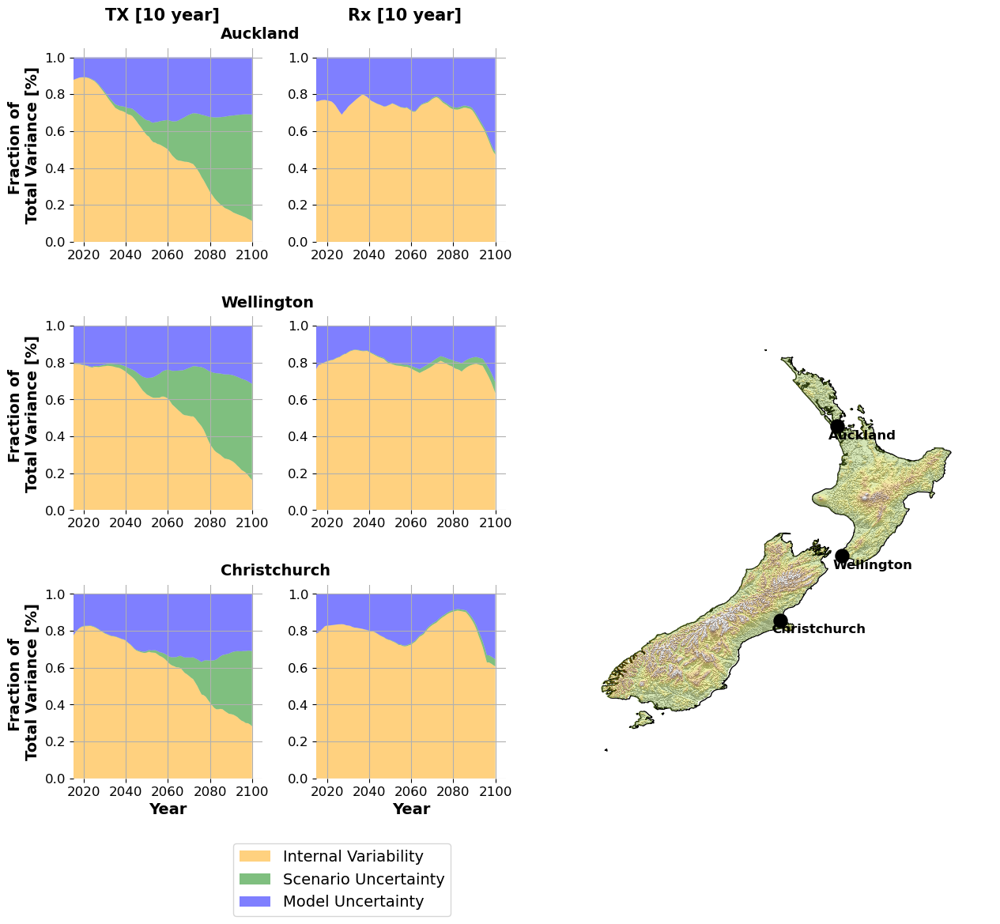

In [1760]:

# Set up figure and grid
fig = plt.figure(figsize=(15, 12))
gs = gridspec.GridSpec(9, 12, wspace=2, hspace=5)
# 64 units
# Main map
ax_map = fig.add_subplot(gs[3:12, 6:], projection=ccrs.PlateCarree())
ax_map.set_extent([165, 180, -49, -33])
hillshade_dset.hillshade.plot(ax=ax_map, transform=ccrs.PlateCarree(), cmap='Greys_r', alpha=0.5, levels=10, zorder=1, add_colorbar=False)
hillshade_dset.topo.plot(ax=ax_map, transform=ccrs.PlateCarree(), cmap=custom_cmap, alpha=0.3, levels=10, zorder=2, add_colorbar=False, vmax=1500)
ax_map.coastlines('10m')#add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1)
#ax_map.add_feature(cfeature.BORDERS, linestyle=':')
#ax_map.set_title("Locations in New Zealand")

i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =10, min_periods =1).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T



i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10, min_periods =1).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1


ax1 = fig.add_subplot(gs[0:3, 0:3])
ax11 = fig.add_subplot(gs[0:3, 3:6])

ax2 = fig.add_subplot(gs[3:6 ,0:3])
ax22 = fig.add_subplot(gs[3:6, 3:6])


ax3 = fig.add_subplot(gs[6:9, 0:3])
ax33 = fig.add_subplot(gs[6:9 ,3:6])

#ax4 = fig.add_subplot(gs[9:12, 0:3])
#ax44 = fig.add_subplot(gs[9:12, 3:6])

ax_tt = [ax1, ax2, ax3]
ax_pp = [ax11, ax22, ax33]

#custom_cmap = LinearSegmentedColormap.from_list("custom_colormap", colors)


# Plot insets for each location
for i, (region, (lat, lon)) in enumerate(regions.items()):
    row, col = divmod(i, 2)

    # Temperature subplot
    ax_t = ax_tt[i]#fig.add_subplot(gs[row, col+1])
    ax_p = ax_pp[i]

    
    ax_t.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_p.stackplot(
        I_f1.year,
        I_f1.sel(lat =lat, lon =lon, method ='nearest'),
        S_f1.sel(lat =lat, lon =lon, method ='nearest'),
        M_f1.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)
    #ax_t.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_t.set_ylabel("Fraction of \nTotal Variance [%]", fontsize=14, fontweight='bold')
    #ax_t.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    #ax_t.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])

    #ax_t.set_title(region, fontsize=12, weight ='bold')
    ax_t.grid('on')
    
    #ax_p.set_title(region, fontsize=12, weight ='bold')
    ax_p.grid('on')
    ax_p.set_xlim(2015, None)
    ax_t.set_xlim(2015, None)
    ax_t.set_xticks([2020, 2040, 2060, 2080, 2100])
    ax_t.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)
    ax_p.set_xticklabels([2020, 2040, 2060, 2080, 2100], rotation =0)
    ax_p.set_xticks([2020, 2040, 2060, 2080, 2100])
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
   
    # Convert map coordinates to figure coordinates
    #x_fig, y_fig = ax_map.transData.transform((lon, lat))
    #x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    #offset_lat, offset_lon = offsets[region]
    ## Adjust position of violin plot
    #ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_t.tick_params(labelsize =12
                         )
    ax_p.tick_params(labelsize =12
                         )

    ax_p.grid('on')
    ax_t.grid('on')
    ax_p.set_frame_on(False)
    ax_t.set_frame_on(False)
    ax_t.text(2085, 1.1, region, fontsize =14, weight ='bold')
ax_map.set_frame_on(False)
    #ax_p.plot(t_dset.year.values, means2, color ='k', lw =1, zorder =6, marker ='o',ms =2)

    # Precipitation subplot (on twin y-axis)
    #ax_t.twinx()
    
    #ivar_P = I_var.interp(lat=lat, lon=lon, method='nearest')  # Update if separate I_var for P
    #mvar_P = M_var.interp(lat=lat, lon=lon, method='nearest')  # Update if separate M_var for P

    #ax_p.plot(t_dset.year.values, means_P, color='blue', lw=1.5, label='Precipitation')
    #ax_p.fill_between(t_dset.year.values, means_P - ivar_P, means_P + ivar_P, alpha=0.3, color='blue')
    #ax_p.set_ylabel("mm/day")
ax_t.set_xlabel("Year", fontsize =14, weight ='bold')
ax_p.set_xlabel("Year", fontsize =14, weight ='bold')
ax_p.legend(loc="lower right", fontsize =14, bbox_to_anchor = (0.75, -0.75))
ax_tt[0].text(2030, 1.2, 'TX [10 year]', fontsize =15, weight ='bold')
ax_pp[0].text(2030, 1.2, 'Rx [10 year]', fontsize =15, weight ='bold')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/TXX_RX1dAY_10year_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/TXX_RX1dAY_10year_hawkins_and_sutton.pdf', dpi =200, bbox_inches ='tight')

# Choose one location over the Tasman Sea? and Maybe get rid of milford sound

In [1642]:
import numpy as np

def create_df(lat, lon, season ='DJF'):
    df1 = pd.DataFrame()
    # V1
    
    access_arr = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(All_merged.GCM.isel(year =0)== 'ACCESS-ESM1-5', drop=True).values.flatten()
    df1.loc[:len(access_arr)-1, 'GAN ACCESS-ESM1-5 (n=40)'] = access_arr
    df1['Metric'] = 'Rx1day'
    df1 = df1.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df2 = pd.DataFrame()
    #V2
    access_seasonal = cc_signal_pr_seasonal_ai.interp(lat=lat, lon=lon).sel(season = season).where(All_merged.GCM.isel(year =0) == 'ACCESS-ESM1-5', drop=True).values.flatten()
    df2.loc[:len(access_seasonal)-1  , 'GAN ACCESS-ESM1-5 (n=40)'] = access_seasonal
    df2['Metric'] = 'DJF Pr'
    df2 = df2.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V3
    df3 = pd.DataFrame()
    other_gcms = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(
        ~((All_merged.GCM.isel(year =0) == 'ACCESS-ESM1-5') | (All_merged.GCM.isel(year =0) == 'CanESM5')), drop=True
    ).values.flatten()
    df3.loc[:len(other_gcms)-1, "GAN Multi-model (n=18)"] = other_gcms
    df3['Metric'] = 'Rx1day'
    df3 = df3.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V4
    df4 = pd.DataFrame()
    other_gcms = cc_signal_pr_seasonal_ai.sel(season =season).interp(lat=lat, lon=lon).where(
        ~((All_merged.GCM.isel(year =0) == 'ACCESS-ESM1-5') | (All_merged.GCM.isel(year =0) == 'CanESM5')), drop=True
    ).values.flatten()
    df4.loc[:len(other_gcms)-1, "GAN Multi-model (n=18)"] = other_gcms
    df4['Metric'] = 'DJF Pr'
    df4 = df4.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    # V5
    df5 = pd.DataFrame()
    canesm_arr = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(All_merged.GCM.isel(year =0) == 'CanESM5', drop=True).values.flatten()
    df5.loc[:len(canesm_arr)-1, 'GAN CanESM5 (n=20)'] = canesm_arr
    df5['Metric'] = 'Rx1day'
    df5 = df5.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    #V6
    
    df6 = pd.DataFrame()
    canesm_arr = cc_signal_pr_seasonal_ai.sel(season =season).interp(lat=lat, lon=lon).where(All_merged.GCM.isel(year =0) == 'CanESM5', drop=True).values.flatten()
    df6.loc[:len(canesm_arr)-1, 'GAN CanESM5 (n=20)'] = canesm_arr
    df6['Metric'] = 'DJF Pr'
    df6 = df6.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df7 = pd.DataFrame()
    ccam_arr = cc_signal_pr.interp(lat=lat, lon=lon).values.flatten()
    df7.loc[:len(ccam_arr)-1, 'CCAM (n=6)'] = ccam_arr
    df7['Metric'] = 'Rx1day'
    df7 = df7.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df8 = pd.DataFrame()
    ccam_arr = cc_signal_pr_seasonal.sel(season =season).interp(lat=lat, lon=lon).values.flatten()
    df8.loc[:len(ccam_arr)-1, 'CCAM (n=6)'] = ccam_arr
    df8['Metric'] = 'DJF Pr'
    df8 = df8.melt(var_name="GCM Variant", value_name="CC Signal", id_vars=["Metric"])
    
    df = pd.concat([df1, df2, df5, df6,df3,df4, df7,df8])
    

    return df




NameError: name 'cc_signal_pr_ai' is not defined

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


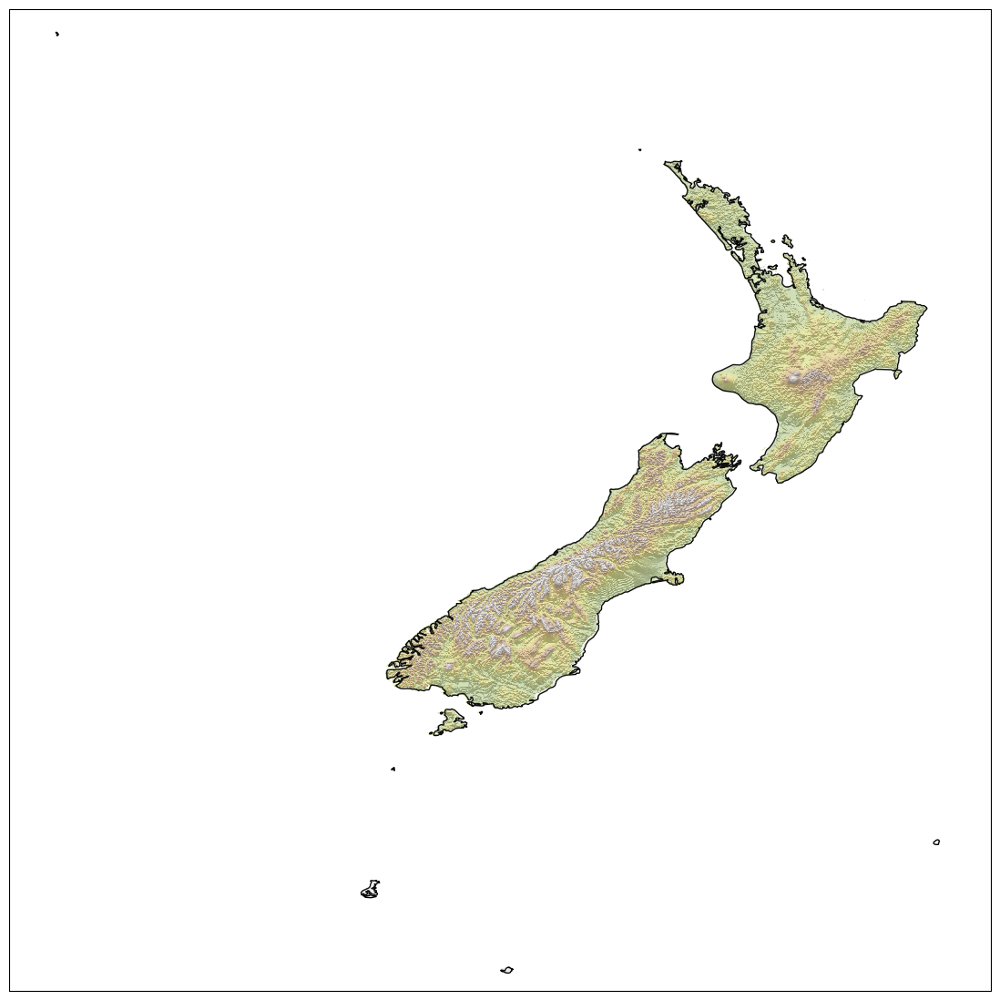

In [1643]:
import earthpy.spatial as es
hillshade_dset = xr.open_dataset(r'/nesi/project/niwa00018/gibsonp/dload_data/global_topo_1km/topo_NZ_1km.nc')
hillshade = es.hillshade(hillshade_dset.topo.values, azimuth=0, altitude=45)
hillshade_dset['hillshade'] = (('Y','X'), hillshade)

from matplotlib.colors import LinearSegmentedColormap

# Define custom colormap colors (approximated from the image)
colors = [    # Slightly lighter green
    (0.0,  "yellowgreen"), # Yellowish green
    (0.25,  "yellow"),     # Bright yellow
    (0.5, "orange"),     # Warm orange
    (0.75,  "saddlebrown"), # Reddish-brown
    (1.0,  "white")       # Lightest color on the far right
]

# Create the colormap
custom_cmap = LinearSegmentedColormap.from_list("custom_colormap", colors)


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np

# def create_df(lat, lon):
#     df = pd.DataFrame()
    
# #     large_ensemble = cc_signal_pr_ai.interp(lat=lat, lon=lon).values.flatten()
# #     df.loc[:len(large_ensemble)-1, 'Large Ensemble'] = large_ensemble

#     access_arr = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(cc_signal_pr_land_ai.GCM == 'ACCESS-ESM1-5', drop=True).values.flatten()
#     df.loc[:len(access_arr)-1, 'ACCESS-ESM1-5 (n=40)'] = access_arr

#     other_gcms = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(
#         ~((cc_signal_pr_land_ai.GCM == 'ACCESS-ESM1-5') | (cc_signal_pr_land_ai.GCM == 'CanESM5')), drop=True
#     ).values.flatten()
#     df["GAN Multi-model (n=18)"] = np.nan
#     df.iloc[:len(other_gcms), df.columns.get_loc("GAN Multi-model (n=18)")] = other_gcms

#     canesm_arr = cc_signal_pr_ai.interp(lat=lat, lon=lon).where(cc_signal_pr_land_ai.GCM == 'CanESM5', drop=True).values.flatten()
#     df.loc[:len(canesm_arr)-1, 'CanESM5 (n=20)'] = canesm_arr

#     ccam_arr = cc_signal_pr.interp(lat=lat, lon=lon).values.flatten()
#     df.loc[:len(ccam_arr)-1, 'CCAM (n=6)'] = ccam_arr

#     return df
# grass_light =   # Light grass green for DJF rainfall
# forest_green = "#228B22"
grass_light = "#A8E063"  # Slightly lighter grass green for DJF rainfall
forest_green = "#1E6B19"  # Slightly darker forest green for RX1Day

cb_colors  = ["#1E6B19","#A8E063" ]#"#9ACD32",  "#228B22"] #"#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([158, 180, -53, -31], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.28, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    df = create_df(lat, lon)
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #['box', 'quart', 'stick', 'point', None],
    sns.violinplot(
        data=df.reset_index(), y="GCM Variant", x="CC Signal",
        ax=ax_violin, palette=cb_colors,alpha =0.65, inner ='point', hue ="Metric", legend = False, split =False
    )#inner="box"
    #sns.swarmplot(y="GCM Variant", x="CC Signal",hue ='Metric', data=df, color='k', alpha=0.35, palette=cb_colors, split =False)
    #
    #x_violin.
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("CC Signal (%)", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    #ax_violin.set_frame_on(False)
    #ax_violin.set_ylabel('', fontsize =8)
    _ = ax_violin.set_ylabel(' ', fontsize =12)
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)

import matplotlib.patches as mpatches

# Define custom legend items
legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
fig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
plt.show()
plt.show()
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.pdf', dpi =500, bbox_inches ='tight')




/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


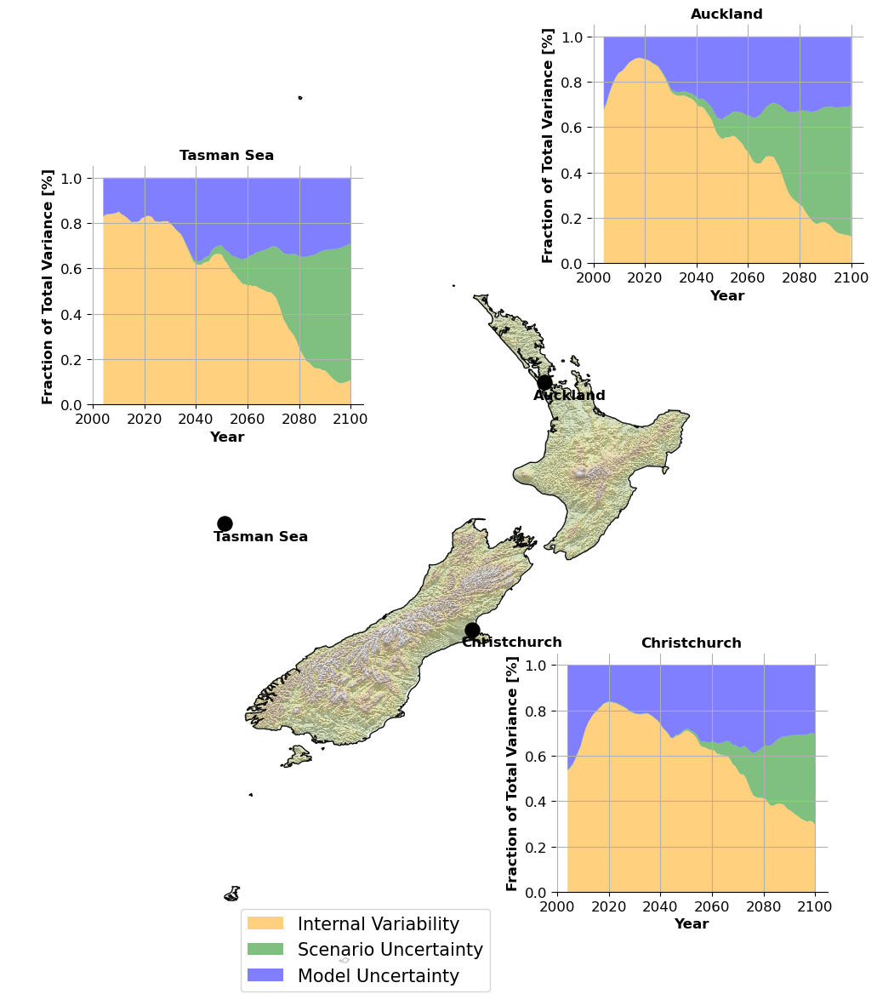

In [1498]:


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.22, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =5).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T



i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10).mean()
T_r1 = S_r + M_r + I_r
S_f1  = S_r/T_r1
M_f1 = M_r/T_r1
I_f1 = I_r/T_r1
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/TXX_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


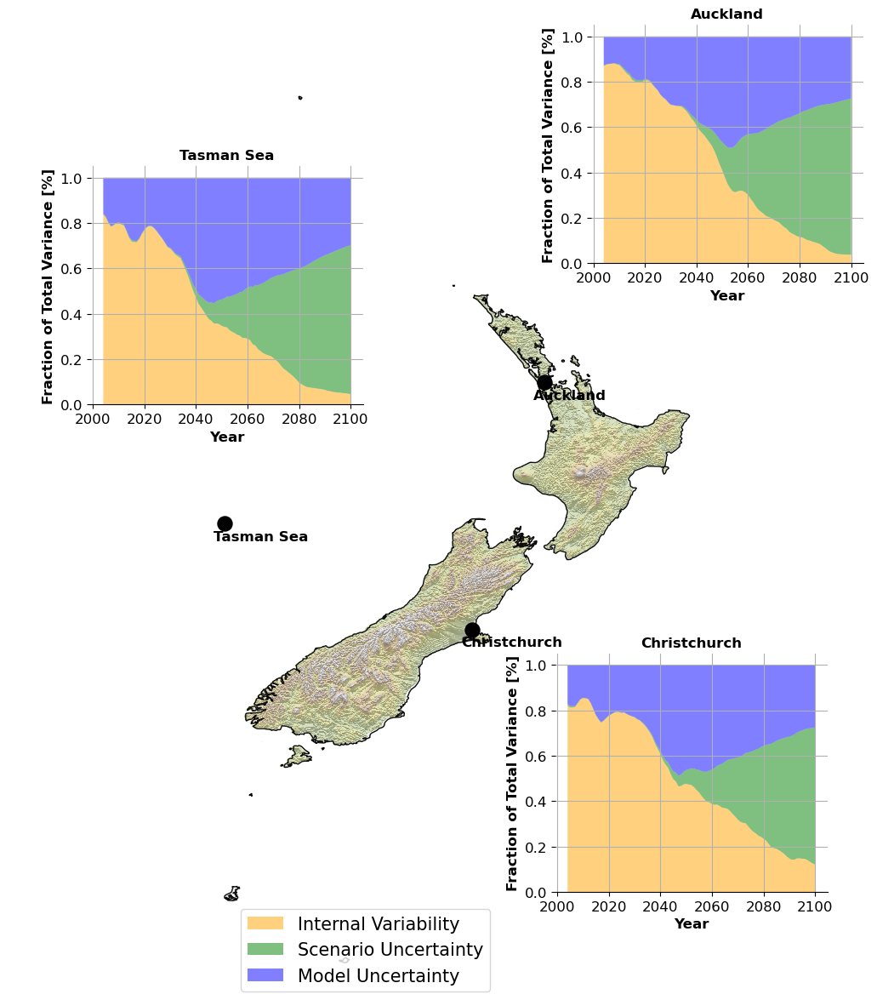

In [1486]:


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.22, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I = 1/2* (I_raw_C + I_raw_A)
I = I.rolling(year =5).mean()
T = S + M + I
S_f  = S/T
M_f = M/T
I_f = I/T
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k', weight ='bold')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/TXX_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


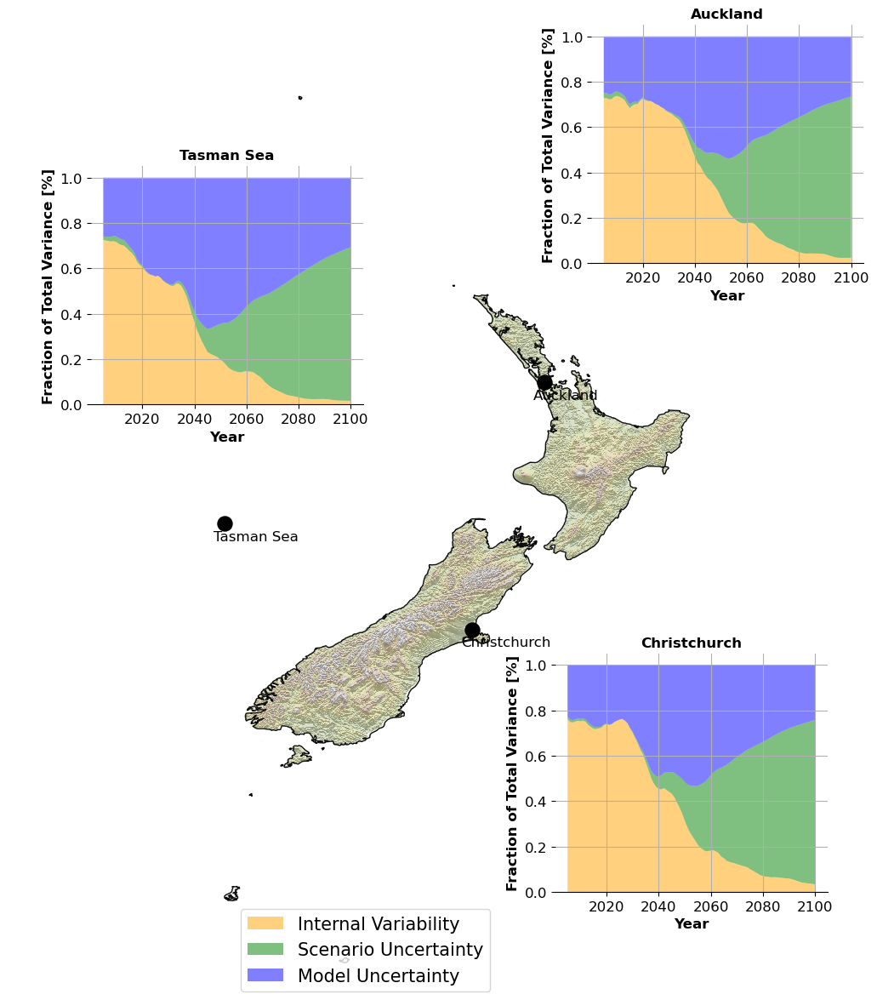

In [1487]:


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.18, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I = 1/2* (I_raw_C_djf + I_raw_A_djf)
I = I.rolling(time =5).mean()
T = S_djf + M_djf + I
S_f  = S_djf/T
M_f = M_djf/T
I_f = I/T
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.time,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/Tasmax_DJF_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


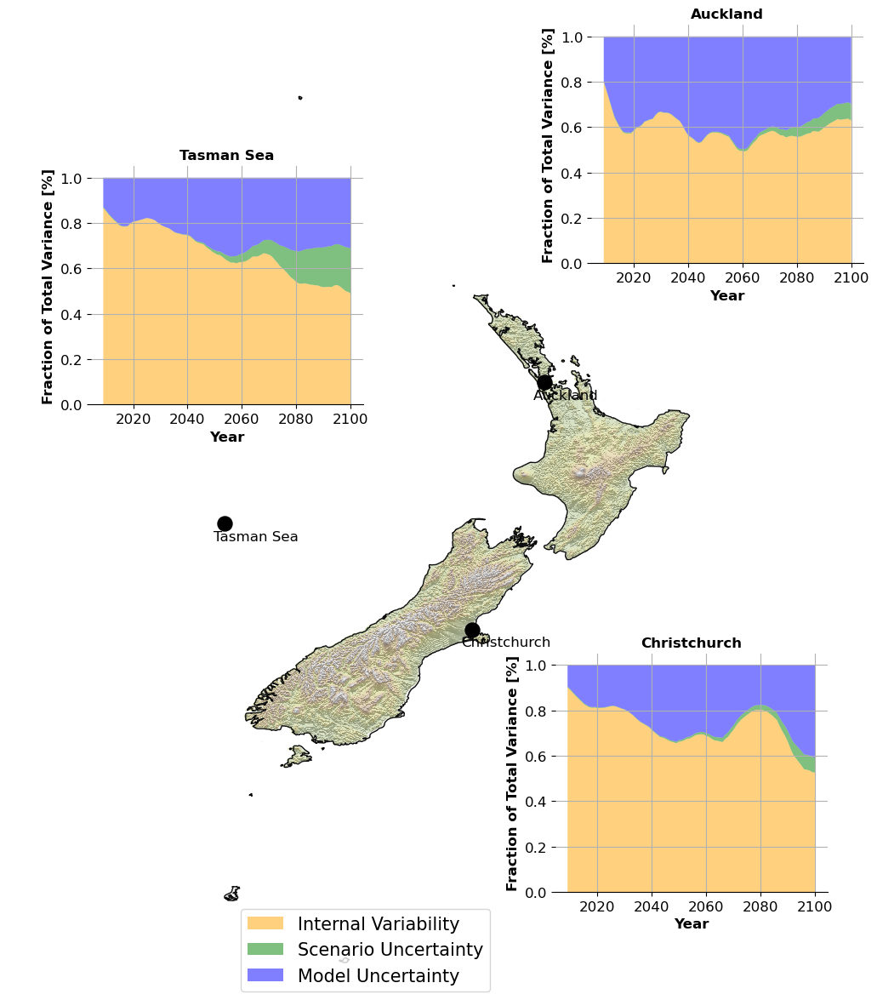

In [1488]:


# Create the colormap
custom_cmap = LinearSegmentedColormap.from_list("custom_colormap", colors)


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.20, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10).mean()
T_r = S_r + M_r + I_r
S_f  = S_r/T_r
M_f = M_r/T_r
I_f = I_r/T_r
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/RX1Day_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


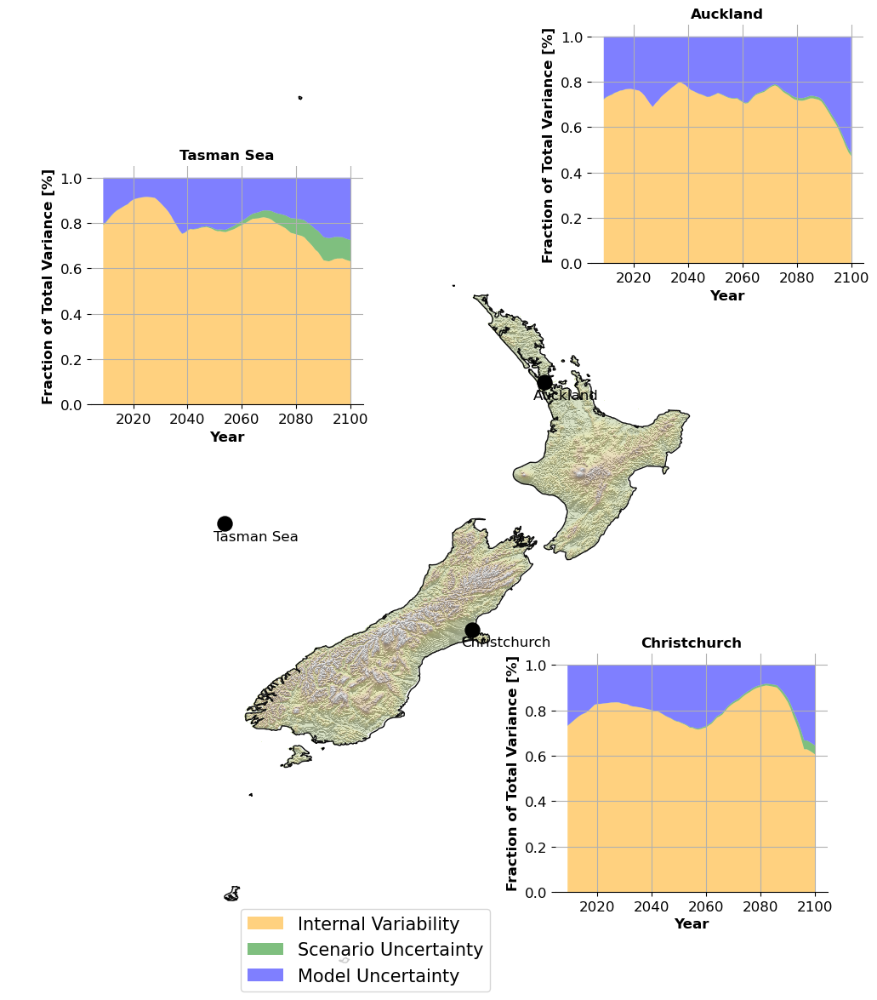

In [1504]:


# Create the colormap
custom_cmap = LinearSegmentedColormap.from_list("custom_colormap", colors)


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.20, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I_r = 1/2* (I_raw_C_r + I_raw_A_r)
I_r = I_r.rolling(year =10).mean()
T_r = S_r + M_r + I_r
S_f  = S_r/T_r
M_f = M_r/T_r
I_f = I_r/T_r
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.year,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/RX1Day_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


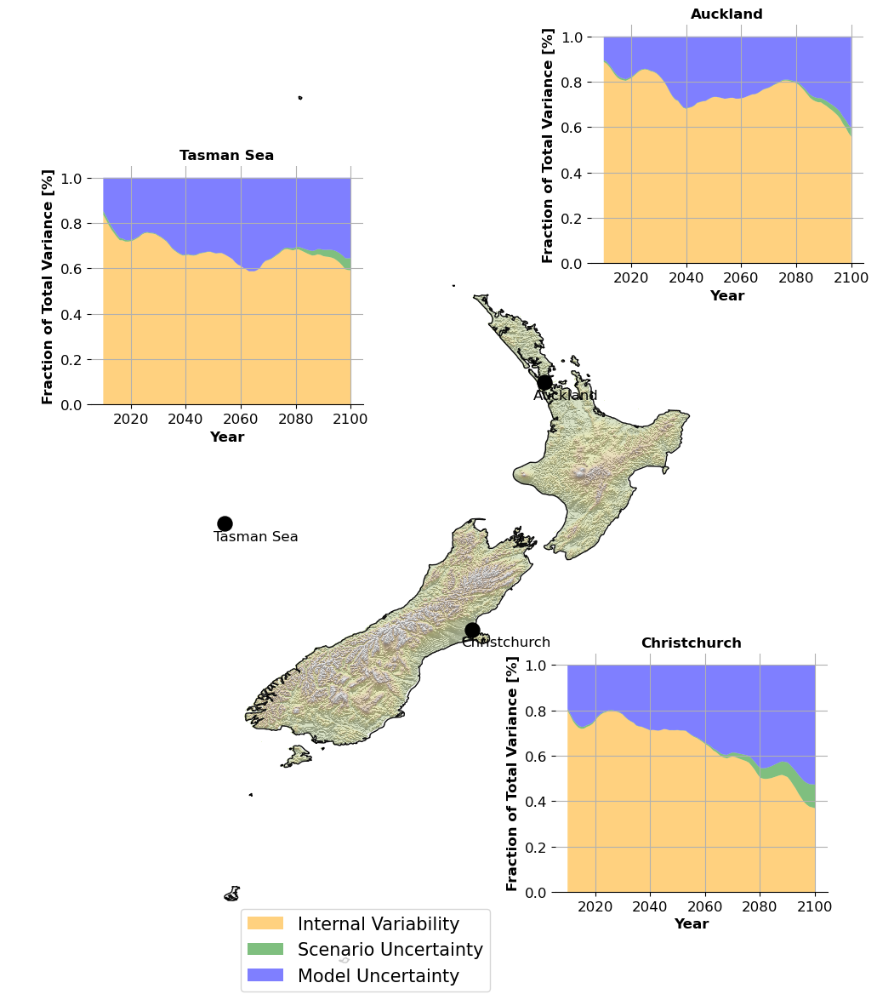

In [1489]:


import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd

# Define regions with their coordinates
import pandas as pd
import numpy as np
fig = plt.figure(figsize=(16, 14))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax_map.set_extent([160, 180, -53, -28], crs=ccrs.PlateCarree())
hillshade_dset.hillshade.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap ='Greys_r', alpha =0.475, levels =50, zorder =3, add_colorbar =False)
hillshade_dset.topo.plot(ax = ax_map, transform = ccrs.PlateCarree(), cmap =custom_cmap, alpha =0.20, levels =50, zorder =4, add_colorbar =False, vmax =1500)
# Add map features
ax_map.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=1, zorder =4, fc ='gray')
ax_map.add_feature(cfeature.LAND, linewidth=1, zorder =4, fc ='gray', alpha =0.1)
ax_map.add_feature(cfeature.BORDERS, linestyle=':', zorder =4)
#ax_map.add_feature(cfeature.OCEAN, facecolor='white', zorder =4, ec ='k', alpha =0.05)
#ax_map.add_feature(cfeature.LAKES, edgecolor='black', facecolor='white', zorder =4)
i =0
I_r = 1/2* (I_raw_C_r_djf + I_raw_A_r_djf)
I_r = I_r.rolling(time =10).mean()
T_r = S_r_djf + M_r_djf + I_r
S_f  = S_r_djf/T_r
M_f = M_r_djf/T_r
I_f = I_r/T_r
# Plot violin plots for each region
for region, (lat, lon) in regions.items():
    #df = df.melt(var_name="GCM Variant", value_name="Rx1Day CC Signal")
#     df.loc[df['GCM Variant'] =='ACCESS-ESM1-5','label'] = 'SMile'
#     df.loc[df['GCM Variant'] == 'CanESM5', 'label'] = 'SMile2'
    
    ax_violin = fig.add_axes([0, 0, 0.23, 0.23])  # Dummy position, will update
    #ax_violin2 = fig.add_axes([0, 0, 0.23, 0.23])
    #['box', 'quart', 'stick', 'point', None],
    means = fitted_T.interp(lat =lat, lon =lon, method ='nearest').mean(["GCM","ssp"])

    ax_violin.stackplot(
        I_f.time,
        I_f.sel(lat =lat, lon =lon, method ='nearest'),
        S_f.sel(lat =lat, lon =lon, method ='nearest'),
        M_f.sel(lat =lat, lon =lon, method ='nearest'),
        labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
        colors=["orange", "green", "blue"] , alpha =0.5)

    ax_violin.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
    ax_violin.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
    ax_map.text(lon-0.3, lat-0.45, region, transform =ccrs.PlateCarree(), fontsize =12, zorder =12, color ='k')#, weight ='bold')
    ax_map.scatter(lon, lat, transform =ccrs.PlateCarree(), s=150, color ='k', marker ='o', zorder=14)
    #ax_violin.set_xticks([])
    ax_violin.set_xlabel("Year", fontsize =12)
    ax_violin.set_title(region, fontsize=12, weight ='bold')
    ax_violin.grid('on')
    # Convert map coordinates to figure coordinates
    x_fig, y_fig = ax_map.transData.transform((lon, lat))
    x_fig, y_fig = fig.transFigure.inverted().transform((x_fig, y_fig))
    
    #ax_violin.set_ylim(-50, 100)
    offset_lat, offset_lon = offsets[region]
    # Adjust position of violin plot
    ax_violin.set_position([x_fig +offset_lon, y_fig +offset_lat, 0.2, 0.2])
    ax_violin.tick_params(labelsize =12
                         )
    sns.despine(left=True)
    i+=1
ax_map.set_frame_on(False)
ax_violin.legend(loc="lower right", fontsize =15, bbox_to_anchor = (1.5, -2.5))
fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/figures/DJF_hawkins_and_sutton.png', dpi =500, bbox_inches ='tight')
import matplotlib.patches as mpatches

# Define custom legend items
#legend_labels = ["Rx1day", "DJF Pr"]
#legend_colors = ["green", "yellow", "orange"]

# Create patches for legend
#patches = [mpatches.Patch(color=cb_colors[i], label=legend_labels[i], alpha =0.65) for i in range(len(legend_labels))]

# Add legend to figure
#f#ig.legend(handles=patches, loc="upper center",fontsize =15, fancybox =True, framealpha = 1, shadow = True, borderpad = 1, bbox_to_anchor =(0.45, 0.95))
#ax_map.set_title('(b) Precipitation', fontsize=30, pad =120, weight ='bold') 
#/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Rx1day_spatial_figre_dfj.png', dpi =500, bbox_inches ='tight')

In [1182]:
means = fitted_r.interp(lat =-39, lon =176, method ='nearest').mean(["GCM","ssp"])
plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest'),
                 means+I_var.interp(lat =-39, lon =176, method ='nearest'), zorder =3, alpha =0.75)
plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest')-M_var.interp(lat =-39, lon =176, method ='nearest'),
                 means+I_var.interp(lat =-39, lon =176, method ='nearest')+M_var.interp(lat =-39, lon =176, method ='nearest'), zorder =2, alpha =0.5)

plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest')-M_var.interp(lat =-39, lon =176, method ='nearest') -S_var.interp(lat =-39, lon =176, method ='nearest') , 
                 means+I_var.interp(lat =-39, lon =176, method ='nearest')+M_var.interp(lat =-39, lon =176, method ='nearest') + S_var.interp(lat =-39, lon =176, method ='nearest'), zorder =1, alpha =0.25)
plt.plot(t_dset.year.values, means, color ='k', lw =1, zorder =6, marker ='o',ms =5)

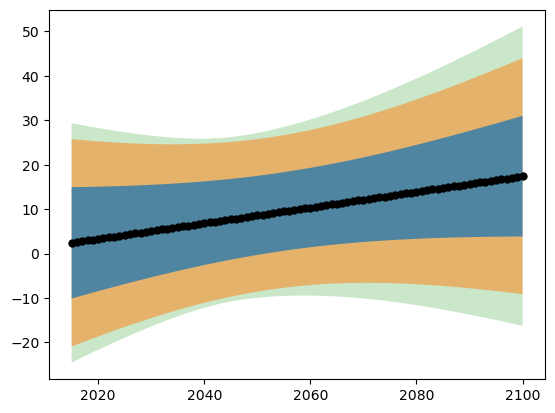

In [1183]:
plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest'),
                 means+I_var.interp(lat =-39, lon =176, method ='nearest'), zorder =3, alpha =0.75)
plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest')-M_var.interp(lat =-39, lon =176, method ='nearest'),
                 means+I_var.interp(lat =-39, lon =176, method ='nearest')+M_var.interp(lat =-39, lon =176, method ='nearest'), zorder =2, alpha =0.5)

plt.fill_between(t_dset.year.values, means-I_var.interp(lat =-39, lon =176, method ='nearest')-M_var.interp(lat =-39, lon =176, method ='nearest') -S_var.interp(lat =-39, lon =176, method ='nearest') , 
                 means+I_var.interp(lat =-39, lon =176, method ='nearest')+M_var.interp(lat =-39, lon =176, method ='nearest') + S_var.interp(lat =-39, lon =176, method ='nearest'), zorder =1, alpha =0.25)
plt.plot(t_dset.year.values, means, color ='k', lw =1, zorder =6, marker ='o',ms =5)

In [1164]:
I_var = np.sqrt(1/2* (I_trend_C_r + I_trend_A_r))
M_var = np.sqrt(M_r)
S_var = np.sqrt(S_r)

In [1172]:
pr_dset

<xarray.Dataset>
Dimensions:     (lon: 179, lat: 172, year: 86, ssp: 4, GCM: 20, time: 86)
Coordinates:
  * lon         (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat         (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
  * year        (year) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
  * ssp         (ssp) object 'ssp126' 'ssp245' 'ssp370' 'ssp585'
  * GCM         (GCM) object 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'MPI-ESM1-2-HR'
  * time        (time) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
    season      object ...
Data variables:
    Rx1day_MME  (GCM, ssp, year, lat, lon) float64 ...
    DJF_MME_pr  (GCM, ssp, time, lat, lon) float64 ...

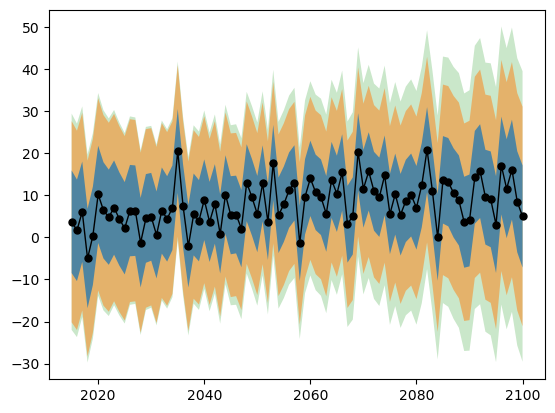

In [ ]:
I_R = np.sqrt(1/2* (I_trend_C_r + I_trend_A_r))
M_r = np.sqrt(M_)
S_r = np.sqrt(S)

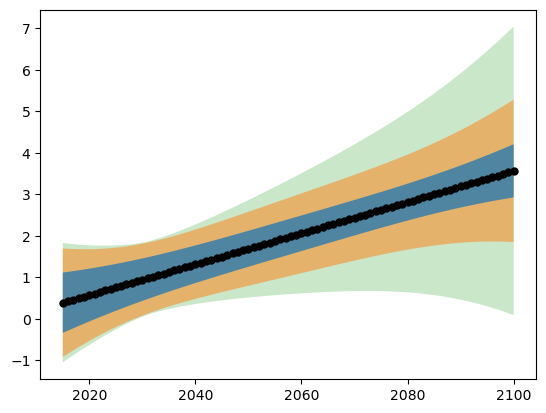

In [1114]:



T_r = S + M + I_R
S2_r = S/T_r * np.sqrt(T_r)
M2_r = M/T_r * np.sqrt(T_r)
I2_r = I_R/T_r * np.sqrt(T_r)
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176

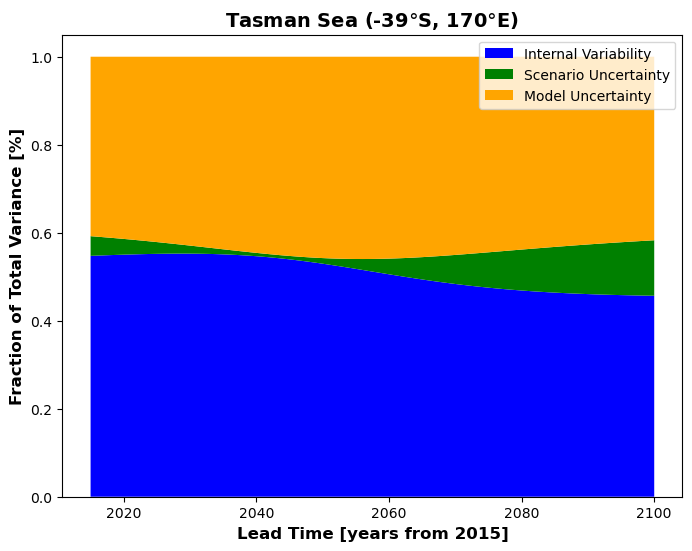

In [1109]:
I_R = 1/2* (I_trend_C_r + I_trend_A_r)
T_r = S_r + M_r + I_R
S2_r = S_r/T_r
M2_r = M_r/T_r
I2_r = I_R/T_r
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    t_dset.year,
    I2_r.sel(lat =lat, lon =lon, method ='nearest'),
    S2_r.sel(lat =lat, lon =lon, method ='nearest'),
    M2_r.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

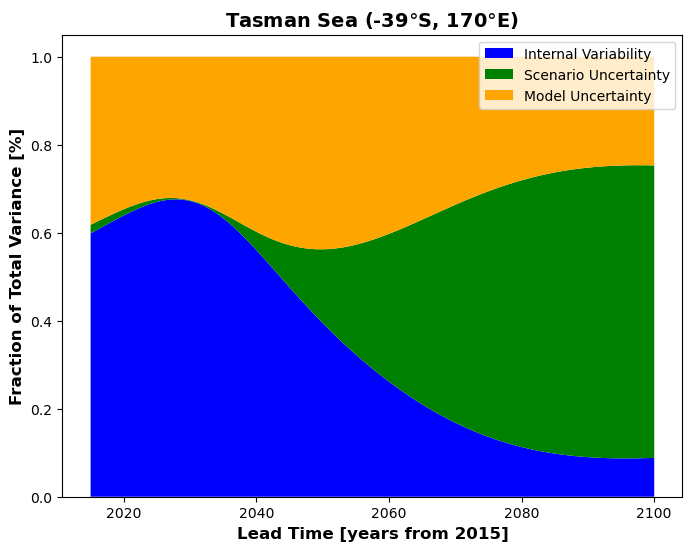

In [1110]:
I_R = 1/2* (I_trend_C + I_trend_A)
T_r = S + M + I_R
S2_r = S/T_r
M2_r = M/T_r
I2_r = I_R/T_r
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    t_dset.year,
    I2_r.sel(lat =lat, lon =lon, method ='nearest'),
    S2_r.sel(lat =lat, lon =lon, method ='nearest'),
    M2_r.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

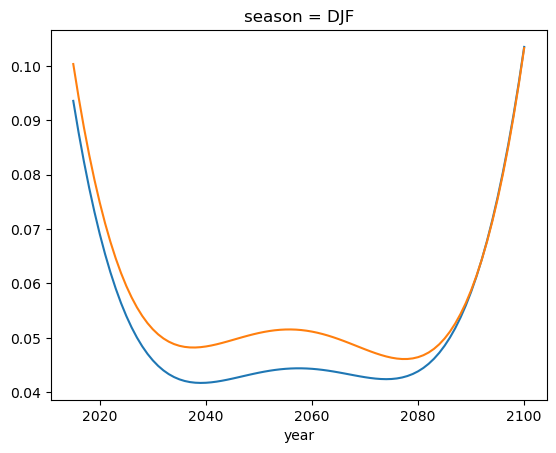

In [1095]:
I_trend_C.mean(["lat","lon"]).plot()
I_trend_A.mean(["lat","lon"]).plot()

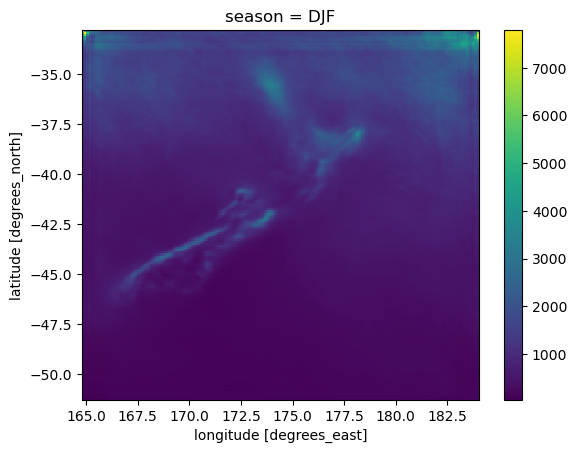

In [1086]:
I_model_r.plot()

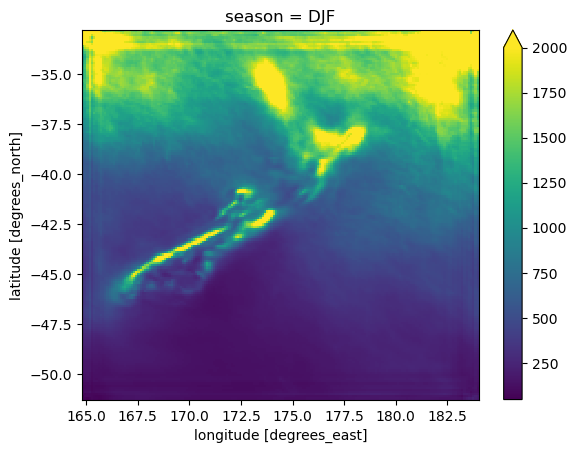

In [1071]:
I_model_r.plot(vmax =2000)

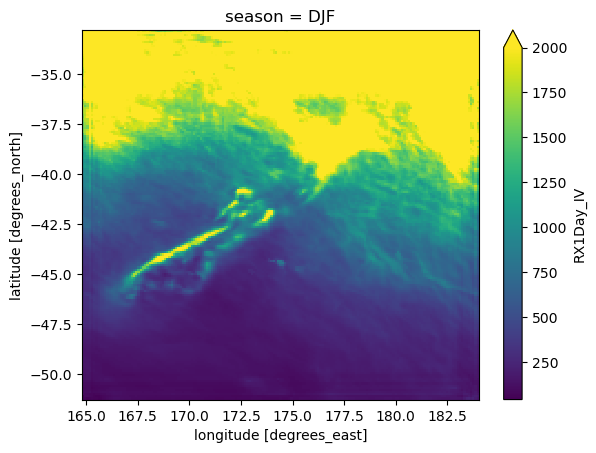

In [1075]:
I_raw_C_r.mean("year").plot(vmax =2000)

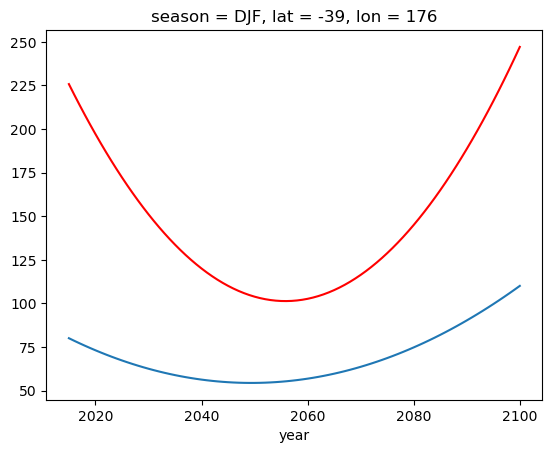

In [1068]:
I_trend_A_r.interp(lat =-39, lon =176).plot()
I_trend_C_r.interp(lat =-39, lon =176).plot(color ='r')
#I_model.interp(lat =-39, lon =176).plot()

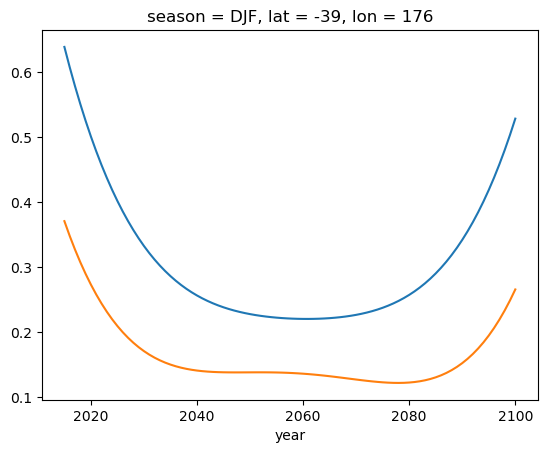

In [1062]:
I_trend_A.interp(lat =-39, lon =176).plot()
I_trend_C.interp(lat =-39, lon =176).plot()
#I_model.interp(lat =-39, lon =176).plot()

In [1061]:
I_model.interp(lat =-39, lon =176)

<xarray.DataArray ()>
array(2.00068462)
Coordinates:
    season   <U3 'DJF'
    lat      int64 -39
    lon      int64 176

In [1046]:
I_model, M, S, I_trend_A, I_trend_C, I_raw_A, I_raw_C = compute_decomposition(t_dset, t_dset_le, varname = "TXX_MME", dim ="year", degree =2)

<xarray.DataArray 'GCM' (GCM_variant: 59)>
array(['ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5', 'ACCESS-ESM1-5',
       'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5',
       'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5',
       'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5', 'CanESM5',
       'CanESM5'], dtype=object)
Coordinates:
  * GCM_variant  (GCM_variant) object 'ACCESS-ESM1-5_r10i1p1f1' ... 'CanESM5_...
    GCM          (GCM_variant) object 'ACCESS-ESM1-5' ... 'CanESM5'
    season       <U3 'DJF'

In [989]:
pr_dset =xr.open_dataset('/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/internal_variability_data/Multi_Model_Decomposition_pr.nc')

z3 = pr_dset.isel(year = slice(1, -1)).polyfit("year", 2)#t_dset 

In [1037]:
t_dset

<xarray.Dataset>
Dimensions:  (lon: 179, lat: 172, year: 86, ssp: 4, GCM: 20, time: 86)
Coordinates:
  * lon      (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat      (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * ssp      (ssp) object 'ssp126' 'ssp245' 'ssp370' 'ssp585'
  * GCM      (GCM) object 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'MPI-ESM1-2-HR'
  * time     (time) datetime64[ns] 2015-02-01 2016-02-01 ... 2100-02-01
    season   <U3 'DJF'
Data variables:
    TXX_MME  (GCM, ssp, year, lat, lon) float64 ...
    DJF_MME  (GCM, ssp, time, lat, lon) float64 ...

In [1005]:
z4 = pr_dset.isel(year = slice(1, -1)).polyfit("time", 2)#t_dset 

In [931]:
z1 = t_dset.isel(year = slice(1, -1)).polyfit("year", 2)#t_dset 
z2 = t_dset.isel(year = slice(1, -1)).polyfit("time", 2)#t_dset 

In [934]:
fitted_curve_z1 = xr.polyval(t_dset.year, z1.TXX_MME_polyfit_coefficients)
fitted_curve_z2 = xr.polyval(t_dset.time, z2.DJF_MME_polyfit_coefficients)

<xarray.Dataset>
Dimensions:                       (degree: 3, GCM: 20, ssp: 4, lat: 172, lon: 179)
Coordinates:
  * degree                        (degree) int64 2 1 0
  * GCM                           (GCM) object 'CNRM-CM6-1' ... 'MPI-ESM1-2-HR'
  * ssp                           (ssp) object 'ssp126' 'ssp245' ... 'ssp585'
  * lat                           (lat) float64 -51.21 -51.11 ... -32.97 -32.86
  * lon                           (lon) float64 164.9 165.0 ... 183.9 184.0
Data variables:
    TXX_MME_polyfit_coefficients  (degree, GCM, ssp, lat, lon) float64 -0.000...

In [1032]:
z4.DJF_MME_pr_polyfit_coefficients.

<xarray.DataArray 'DJF_MME_pr_polyfit_coefficients' (degree: 3, GCM: 20, ssp: 4, lat: 172, lon: 179)>
array([[[[[-4.88390786e-38, -6.65667499e-38, -8.73626166e-38, ...,
           -5.95233331e-38, -6.77864559e-38, -5.43586544e-38],
          [-7.84519502e-38, -7.76176902e-38, -8.97250498e-38, ...,
           -8.41214992e-38, -9.77353460e-38, -8.94494113e-38],
          [-5.62627822e-38, -7.63370644e-38, -1.18149233e-37, ...,
           -8.23924196e-38, -7.79299972e-38, -4.56205499e-38],
          ...,
          [-3.80389787e-38,  3.03448342e-38,  2.11881613e-37, ...,
            3.64973463e-37,  5.99057824e-37,  7.71716132e-37],
          [-1.61623616e-37, -4.56162517e-38,  2.91194357e-37, ...,
            3.80949905e-37,  5.32781207e-37,  7.18794446e-37],
          [-2.45312891e-37, -9.59520586e-38,  1.01057402e-37, ...,
            3.79643394e-37,  4.96135030e-37,  3.43138232e-37]],

         [[ 2.26172765e-38,  5.77914181e-38,  7.02707381e-38, ...,
           -2.13910349e-37, -2.02411331e-37, -1.74144008e-37],
          [ 2.12148448e-38,  7.74319881e-38,  1.24479296e-37, ...,
           -2.35791919e-37, -2.45977542e-37, -2.10827066e-37],
          [ 6.25840931e-38,  8.53915864e-38,  1.27509806e-37, ...,
           -2.07747545e-37, -2.04231036e-37, -1.74879176e-37],
...
          [ 8.33901418e-01,  6.69895171e-01,  1.00755033e+00, ...,
           -4.15344781e+00, -4.67587676e+00, -4.88710738e+00],
          [-2.04353804e-01, -1.53624827e-01,  1.76108609e-01, ...,
           -4.38544602e+00, -3.93799161e+00, -4.39757985e+00],
          [ 2.54297497e-01,  1.26756482e-01,  9.31315670e-02, ...,
           -4.27861349e+00, -3.34602190e+00, -2.36748754e+00]],

         [[-6.34002209e-01, -4.44096417e-01, -3.12080791e-01, ...,
           -1.04989894e+00, -9.84949379e-01, -7.35922748e-01],
          [-5.35507466e-01, -4.74654388e-01, -4.68044673e-01, ...,
           -1.09493038e+00, -1.10001227e+00, -1.01071497e+00],
          [-5.98965679e-01, -5.31286789e-01, -5.48219691e-01, ...,
           -9.19322540e-01, -8.47911193e-01, -6.88535361e-01],
          ...,
          [ 2.49359792e+00,  4.05812696e+00,  1.50884502e+00, ...,
            1.29488232e+00,  2.75107679e-01, -1.31917974e-02],
          [ 1.95959726e+00,  2.89190243e+00,  2.59146503e+00, ...,
            1.29542531e+00,  1.27550348e+00,  1.71809175e+00],
          [ 1.42596433e+00,  2.69570135e+00,  2.71216684e+00, ...,
            1.06019863e+00,  1.50994750e+00,  1.56325256e+00]]]]])
Coordinates:
  * degree   (degree) int64 2 1 0
  * GCM      (GCM) object 'CNRM-CM6-1' 'UKESM1-0-LL' ... 'MPI-ESM1-2-HR'
  * ssp      (ssp) object 'ssp126' 'ssp245' 'ssp370' 'ssp585'
  * lat      (lat) float64 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
  * lon      (lon) float64 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0

In [1014]:
fitted_curve_z3 = xr.polyval(pr_dset.time, z4.DJF_MME_pr_polyfit_coefficients)

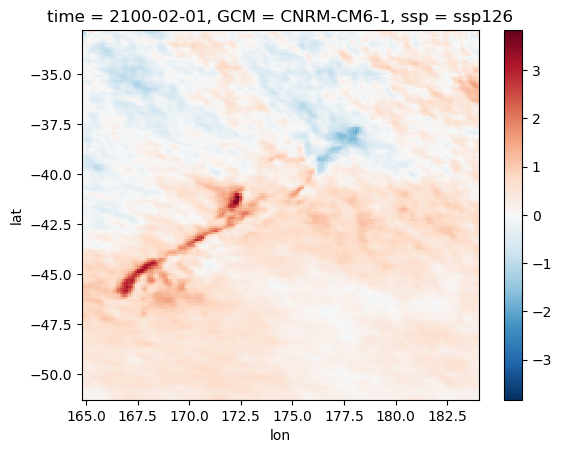

In [1031]:
fitted_curve_z3.isel(time =-1, GCM =0, ssp =-4).plot()

In [968]:
txx_resid = t_dset.DJF_MME - fitted_curve_z2 

In [1015]:
rx1day_resid = pr_dset.DJF_MME_pr - fitted_curve_z3

In [971]:
I = txx_resid.var(["time"]).mean(["GCM","ssp"])

In [ ]:
I = txx_resid.var(["time"]).mean(["GCM","ssp"])
M = fitted_curve_z2.var("GCM").mean("ssp")
S = fitted_curve_z2.mean("GCM").var("ssp")

In [1017]:
I2 = rx1day_resid.var(["time"]).mean(["GCM","ssp"])

In [972]:
M = fitted_curve_z2.var("GCM").mean("ssp")

In [1018]:
M2 = fitted_curve_z3.var("GCM").mean("ssp")

In [973]:
S = fitted_curve_z2.mean("GCM").var("ssp")

In [1019]:
S2 = fitted_curve_z3.mean("GCM").var("ssp")

In [974]:
T = S + M + I

In [1020]:
T2 = S2 + M2 + I2

In [975]:
S_ = S/T
M_ = M/T
I_ = I/T

In [1021]:
T2 = S2 + M2 + I2
S2_ = S2/T2
M2_ = M2/T2
I2_ = I2/T2

In [ ]:
fig, ax = plt.subplots()
I_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)
M_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)
S_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)

In [ ]:
fig, ax = plt.subplots()
I2_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)
M2_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)
S2_.interp(lat =-39, lon =176, method ='nearest').plot(ax =ax)

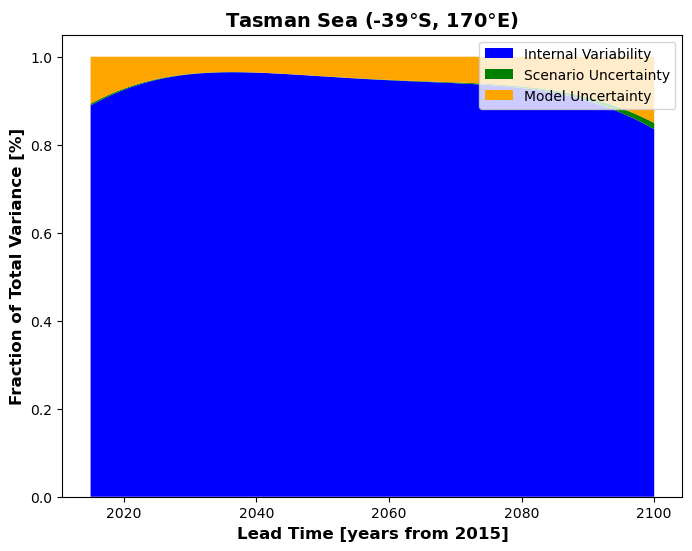

In [1024]:

T2 = S2 + M2 + I2
S2_ = S2/T2
M2_ = M2/T2
I2_ = I2/T2
fig, ax = plt.subplots(figsize=(8, 6))
lat =-35
lon = 170
ax.stackplot(
    t_dset.year,
    I2_.sel(lat =lat, lon =lon, method ='nearest'),
    S2_.sel(lat =lat, lon =lon, method ='nearest'),
    M2_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

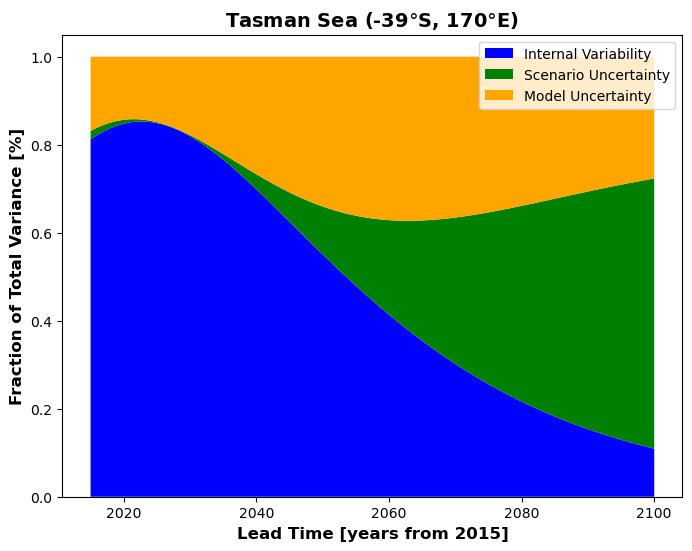

In [979]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 170
ax.stackplot(
    t_dset.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

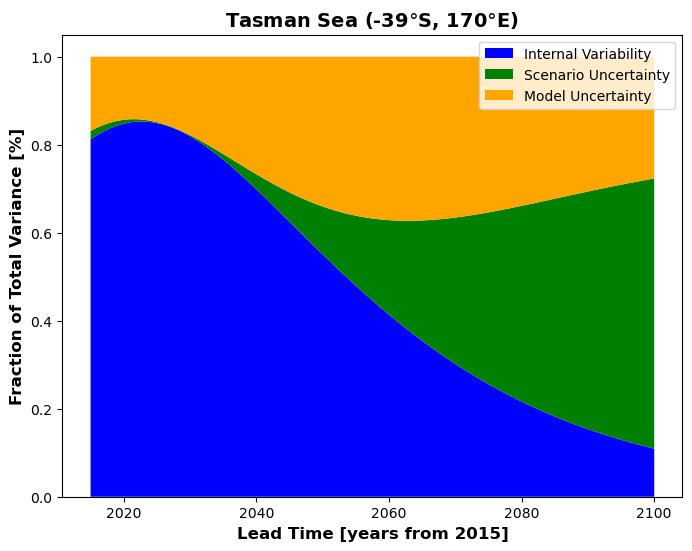

In [981]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 170
ax.stackplot(
    t_dset.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Tasman Sea (-39$\degree$S, 170$\degree$E) ", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

AttributeError: 'DataArray' object has no attribute 'year'

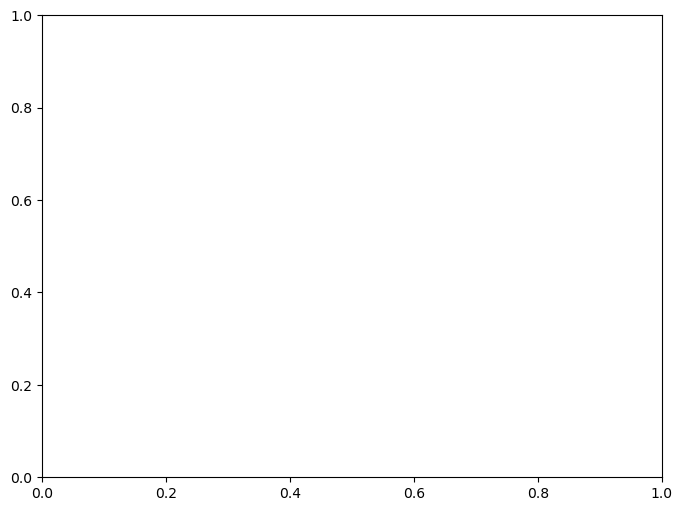

In [980]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Central North Island (-39$\degree$S, 176$\degree$E)", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

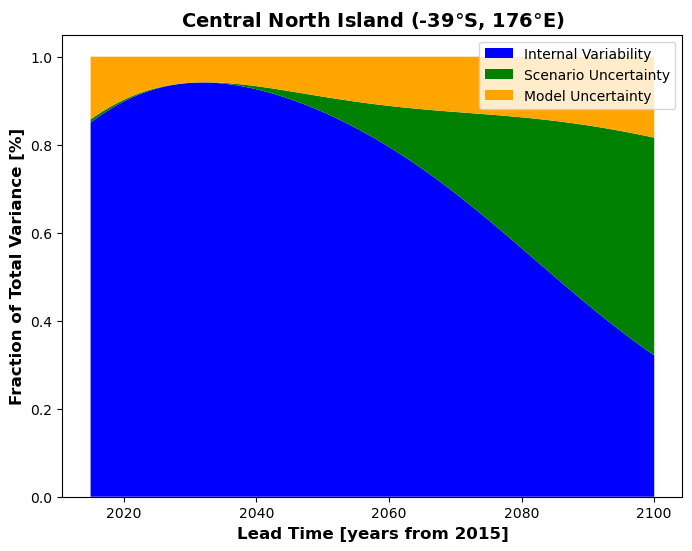

In [961]:
fig, ax = plt.subplots(figsize=(8, 6))
lat =-39
lon = 176
ax.stackplot(
    I_.year,
    I_.sel(lat =lat, lon =lon, method ='nearest'),
    S_.sel(lat =lat, lon =lon, method ='nearest'),
    M_.sel(lat =lat, lon =lon, method ='nearest'),
    labels=["Internal Variability", "Scenario Uncertainty","Model Uncertainty" ],
    colors=["blue", "green", "orange"],
)

ax.set_xlabel("Lead Time [years from 2015]", fontsize=12, fontweight='bold')
ax.set_ylabel("Fraction of Total Variance [%]", fontsize=12, fontweight='bold')
ax.set_title("Central North Island (-39$\degree$S, 176$\degree$E)", fontsize=14, fontweight='bold')
ax.legend(loc="upper right")
plt.show()

In [ ]:
merged_dset_subset = merged_dset_updated.interp(lat = AI_indicators_coarsened.lat, lon = AI_indicators_coarsened.lon, method ='nearest', kwargs = dict(fill_value ='extrapolate'))

In [ ]:
merged_dset_subset['CC_signal_pr'] = 100*(merged_dset_subset['pr_seasonal_future'] - merged_dset_subset['pr_seasonal_hist'])/merged_dset_subset['pr_seasonal_hist']

In [ ]:
merged_dset_subset['CC_signal_tasmax'] = (merged_dset_subset['tasmax_seasonal_future'] -merged_dset_subset['tasmax_seasonal_hist'])#/merged_dset['pr_seasonal_hist']

In [ ]:
ratio = AI_indicators_coarsened.Rx1day.var(["GCM_variant"]).drop_duplicates(dim="year")/((merged_dset_subset.Rx1day*86400).var(["GCM_variant"]))

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


In [ ]:
ratio_txx = AI_indicators_coarsened.TXx.var(["GCM_variant"]).drop_duplicates(dim="year")/((merged_dset_subset.TXx).var(["GCM_variant"]))

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


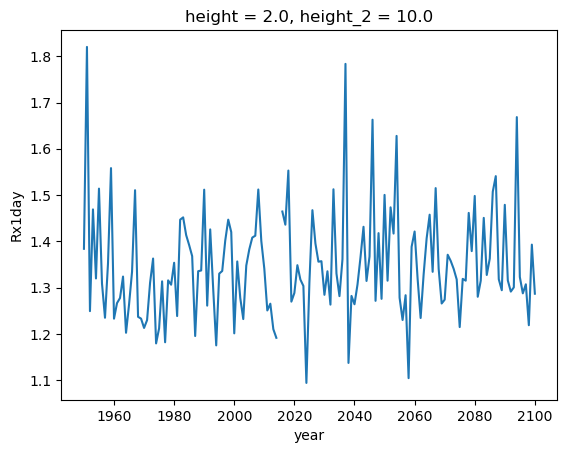

In [ ]:
ratio.mean(["lat","lon"]).plot()

In [ ]:
ratio_txx.mean("year").mean()#.plot(vmin =0.6, vmax =1.4)#interp(lat =-39, lon =178, method ='nearest').plot()



<xarray.DataArray 'TXx' ()>
array(0.70064613)
Coordinates:
    height    float64 2.0
    height_2  float64 10.0

In [ ]:
test_df = xr.open_dataset("/nesi/nobackup/niwa00018/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r4i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v050425.nc")

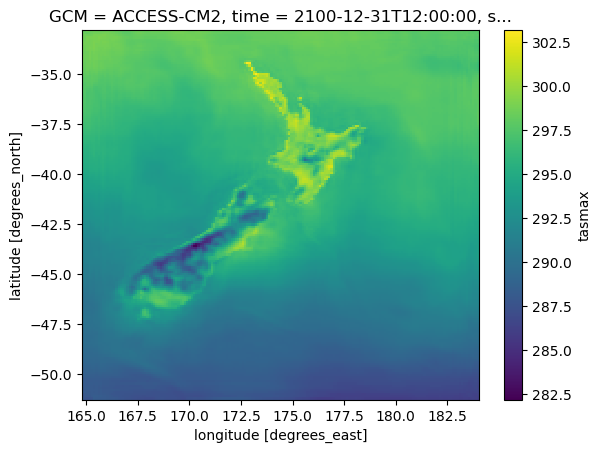

In [ ]:
test_df.isel(time =-1).tasmax.plot()

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


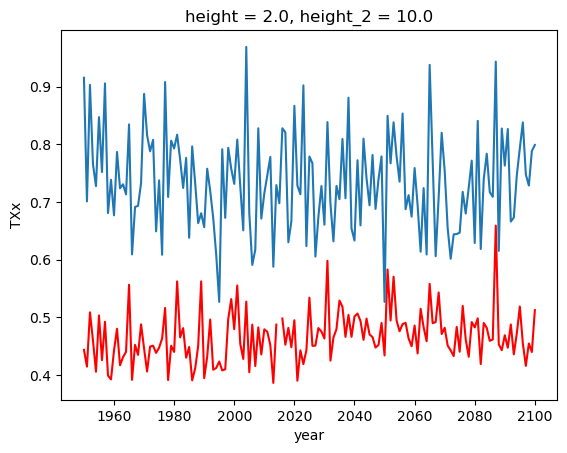

In [ ]:
AI_indicators_coarsened.TXx.var(["GCM_variant"]).mean(["lat","lon"]).drop_duplicates(dim="year").plot(color ='r')
merged_dset_subset.TXx.var(["GCM_variant"]).mean(["lat","lon"]).drop_duplicates(dim="year").plot()

/nesi/project/niwa00018/rampaln/envs/ml_env_v2/lib/python3.8/site-packages/xarray/core/nputils.py:152: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


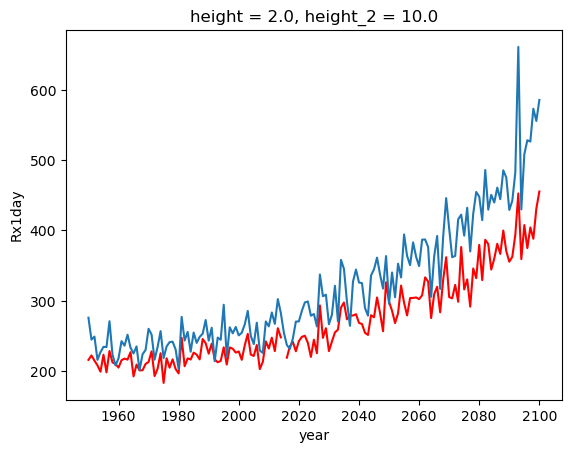

In [ ]:
AI_indicators_coarsened.Rx1day.var(["GCM_variant"]).mean(["lat","lon"]).drop_duplicates(dim="year").plot(color ='r')
(merged_dset_subset.Rx1day*86400).var(["GCM_variant"]).mean(["lat","lon"]).drop_duplicates(dim="year").plot()

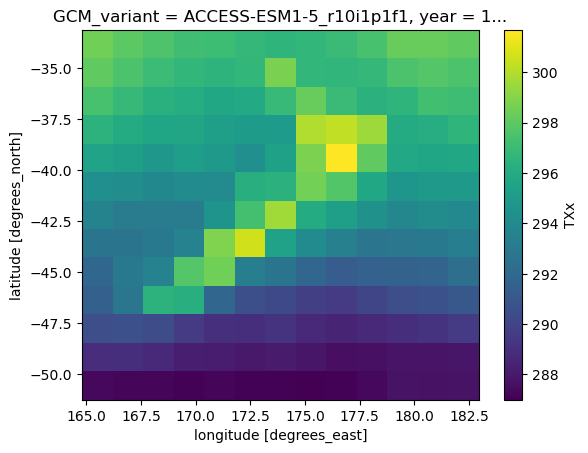

In [ ]:
AI_indicators_coarsened.TXx.isel(GCM_variant =0, year =0).plot()

In [ ]:
access_esm_tasmax = AI_indicators.CC_signal_tasmax.sel(GCM_variant = AI_indicators.GCM.isel(year =0) =='ACCESS-ESM1-5')

In [ ]:
hottest_jja = np.nanargmax(merged_dset['CC_signal_tasmax'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =1).values)
coldest_jja =  np.nanargmin(merged_dset['CC_signal_tasmax'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =1).values)

In [ ]:
wettest_jja = np.nanargmax(merged_dset['CC_signal_pr'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =1).values)
driest_jja =  np.nanargmin(merged_dset['CC_signal_pr'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =1).values)

In [ ]:
hottest= np.nanargmax(merged_dset['CC_signal_tasmax'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =0).values)
coldest =  np.nanargmin(merged_dset['CC_signal_tasmax'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =0).values)

In [ ]:
wettest = np.nanargmax(merged_dset['CC_signal_pr'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =0).values)

In [ ]:
driest =  np.nanargmin(merged_dset['CC_signal_pr'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =0).values)

In [ ]:
merged_dset['CC_signal_pr'].where(static_fields.orog>0, np.nan).mean(["lat","lon"]).isel(season =0).values


array([ 10.760847  ,  -1.3680822 ,   9.644684  ,  -5.7383857 ,
        -5.308394  ,  -2.731199  ,   7.9405565 ,  -4.312626  ,
       -10.405255  ,  -4.5133924 ,          nan,   9.848636  ,
         8.359692  ,   1.2555356 ,  12.291035  ,  11.891671  ,
        -3.1412425 ,   4.2147546 ,   9.107932  ,   4.0519595 ,
        15.349283  ,          nan,  -1.9465454 ,   2.6098425 ,
        -7.860882  ,  10.230488  ,   3.2559311 ,   5.8439574 ,
        -4.335982  ,   1.8320267 ,   0.23381855,  -3.9015017 ,
                nan,   2.8023906 ,  11.594239  ,   5.2610216 ,
         9.022776  ,  11.399826  ,   3.9157112 ,   0.47291303],
      dtype=float32)

In [ ]:
AI_indicators

<xarray.Dataset>
Dimensions:                 (GCM_variant: 75, year: 152, lon: 179, lat: 172, season: 4)
Coordinates:
  * GCM_variant             (GCM_variant) object 'ACCESS-CM2_r4i1p1f1' ... 'U...
  * year                    (year) int64 1950 1951 1952 1953 ... 2098 2099 2100
  * lon                     (lon) float32 164.9 165.0 165.1 ... 183.9 184.0
  * lat                     (lat) float32 -51.21 -51.11 -51.0 ... -32.97 -32.86
    GCM                     (year, GCM_variant) object 'ACCESS-CM2' ... 'UKES...
    scenario                (year) object 'historical' 'historical' ... 'ssp370'
  * season                  (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    Rx1day                  (GCM_variant, year, lat, lon) float64 nan ... 143.8
    seasonal_pr_hist        (GCM_variant, season, lat, lon) float64 ...
    seasonal_pr_future      (GCM_variant, season, lat, lon) float64 ...
    TXx                     (GCM_variant, year, lat, lon) float64 289.5 ... 3...
    seasonal_tasmax_future  (GCM_variant, season, lat, lon) float64 ...
    seasonal_tasmax_hist    (GCM_variant, season, lat, lon) float64 ...
    CC_signal               (GCM_variant, season, lat, lon) float64 nan ... -...
    CC_signal_tasmax        (GCM_variant, season, lat, lon) float64 2.285 ......

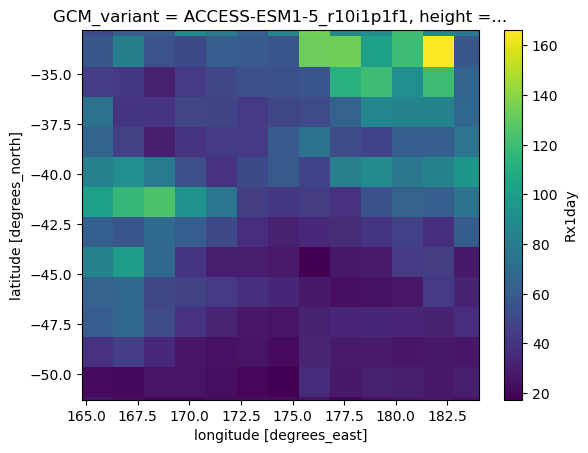

In [56]:
(merged_dset.Rx1day.isel(year =0, GCM_variant =0)*86400).plot()

# Difference In Downscaled vs Non Downscaled Uncertainty

In [40]:
variance = (merged_dset.Rx1day*86400).var("GCM_variant")

<xarray.DataArray 'Rx1day' (year: 152, lat: 172, lon: 179)>
array([[[3.34915441e+01, 6.63248250e+01, 1.12654641e+01, ...,
         7.99013151e+01, 8.41449451e+01, 1.72396883e+02],
        [3.36236134e+01, 3.52064798e+01, 2.32425417e+01, ...,
         6.90660096e+01, 5.96369425e+01, 8.11058220e+01],
        [6.33070196e+01, 3.45772773e+01, 1.88723517e+01, ...,
         6.43534269e+01, 6.54508939e+01, 7.91905844e+01],
        ...,
        [2.27147307e+03, 2.97923458e+03, 2.31580535e+03, ...,
         3.04955782e+02, 2.64447964e+02, 2.96674742e+02],
        [3.48595052e+03, 3.02025227e+03, 2.62061970e+03, ...,
         2.10521402e+02, 1.84905183e+02, 1.62626013e+02],
        [3.37828957e+03, 2.10901069e+03, 2.40074675e+03, ...,
         1.94842017e+02, 8.56207041e+01, 1.22565639e+02]],

       [[3.29441022e+01, 7.43966663e+01, 1.99788181e+01, ...,
         6.34545290e+01, 2.42071482e+01, 7.00546777e+01],
        [3.47941998e+01, 2.70464310e+01, 1.80697588e+01, ...,
         2.73755239e+01, 2.93541698e+01, 5.44327021e+01],
        [3.59221235e+01, 1.82541797e+01, 2.18193011e+01, ...,
         2.41147358e+01, 2.96486740e+01, 3.84539943e+01],
...
        [1.62520363e+04, 1.44966252e+04, 9.98264460e+03, ...,
         4.06460446e+03, 4.15747939e+03, 5.29550894e+03],
        [2.83727434e+04, 2.46365624e+04, 1.10384956e+04, ...,
         3.75039963e+03, 2.39919561e+03, 3.49408472e+03],
        [1.68033169e+04, 1.47540823e+04, 1.14850001e+04, ...,
         3.51009962e+03, 1.50371183e+03, 1.61294022e+03]],

       [[6.13525422e+01, 9.17048441e+01, 1.01731539e+01, ...,
         2.31865285e+02, 1.64841147e+02, 6.48616646e+02],
        [4.82336188e+01, 2.77351052e+01, 1.76885153e+01, ...,
         1.01417539e+02, 1.27750519e+02, 2.33779709e+02],
        [5.38710627e+01, 6.28326934e+01, 4.72594610e+01, ...,
         6.28994338e+01, 7.88728145e+01, 1.18279661e+02],
        ...,
        [8.38126903e+03, 7.42006326e+03, 7.25718214e+03, ...,
         3.59971071e+03, 3.72665734e+03, 3.97800119e+03],
        [1.49619873e+04, 1.14279121e+04, 8.04616955e+03, ...,
         2.93686001e+03, 2.14216879e+03, 2.62815555e+03],
        [1.82352932e+04, 7.99948507e+03, 8.27164671e+03, ...,
         3.60572600e+03, 1.65232173e+03, 1.56783909e+03]]])
Coordinates:
  * year      (year) int64 1950 1951 1952 1953 1954 ... 2096 2097 2098 2099 2100
  * lon       (lon) float32 164.9 165.0 165.1 165.2 ... 183.6 183.7 183.9 184.0
  * lat       (lat) float32 -51.21 -51.11 -51.0 -50.89 ... -33.07 -32.97 -32.86
    scenario  (year) object 'historical' 'historical' ... 'ssp370' 'ssp370'

In [173]:
gcm_outputs = AI_indicators.sel(GCM_variant = ['EC-Earth3_r1i1p1f1','NorESM2-MM_r1i1p1f1']).CC_signal_tasmax.where(static_fields.orog>0, np.nan).mean(["lat","lon"])

In [174]:
gcm_outputs 

<xarray.DataArray 'CC_signal_tasmax' (GCM_variant: 2, season: 4)>
array([[3.79718691, 3.10762176, 3.79008439, 2.75525327],
       [2.5202442 , 1.67614543, 1.91147205, 2.17414282]])
Coordinates:
  * GCM_variant  (GCM_variant) object 'EC-Earth3_r1i1p1f1' 'NorESM2-MM_r1i1p1f1'
  * season       (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [187]:
CCAM_truth = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/CCAM_P_T_indicators_final.nc')

In [188]:
CCAM_truth['CC_signal'] = CCAM_truth.seasonal_tasmax_future - CCAM_truth.seasonal_tasmax_hist

In [189]:
season_signal = CCAM_truth.CC_signal.where(static_fields.orog>0, np.nan).mean(["lat","lon"])


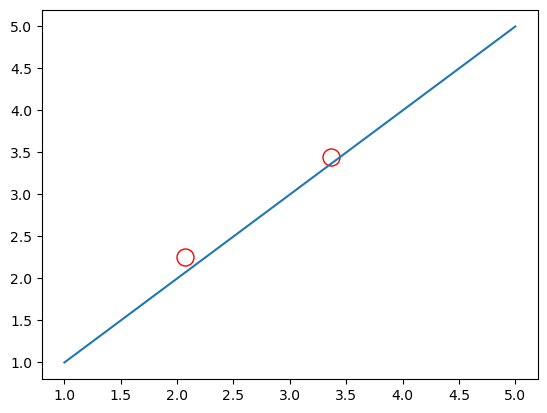

In [205]:
fig, ax = plt.subplots()

ax.scatter(gcm_outputs.mean("season").values, season_signal.mean("season").sel(GCM = ['EC-Earth3', 'NorESM2-MM']).values,marker ='o', s=150, fc ='white', ec = 'r')
ax.plot([1,5],[1,5])

In [799]:
df3 = xr.open_dataset(r'//nesi/nobackup/niwa00018/ML_Downscaled_CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCESS-CM2/ssp370/r4i1p1f1/day/tasmax/NZ_Domain/v20210712/tasmax_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r4i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v050425.nc')

In [722]:
df = xr.open_dataset(r'//nesi/nobackup/niwa00018/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r4i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v050425.nc')

In [765]:
df2 = xr.open_dataset(r'//nesi/nobackup/niwa03712/ML_Downscaled_CMIP6/NIWA-REMS_CCAM_public/ssp370/daily/tasmax/tasmax_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r4i1p1f1_day_NZ12km_NIWA-REMS_tasmax_v280125.nc')

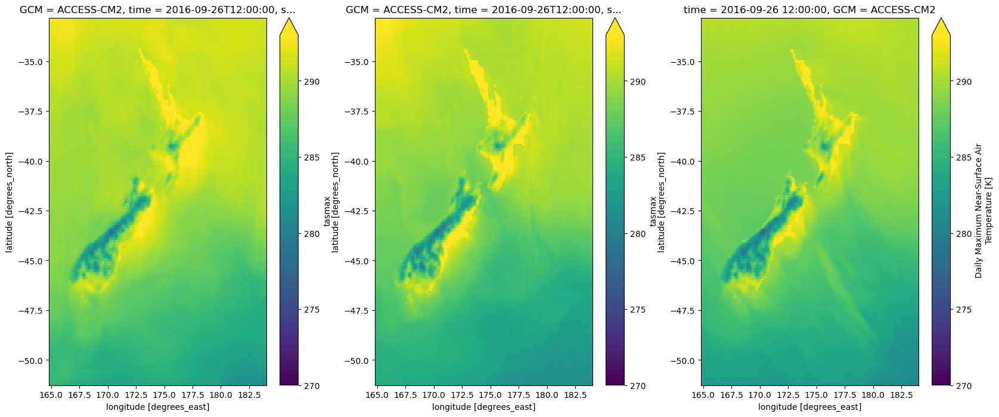

In [777]:
fig, ax = plt.subplots(1,3, figsize =(20, 8))
df.isel(time = 634).tasmax.plot(vmin =270, vmax =293, ax = ax[0])
df2.isel(time = 634).tasmax.plot(vmin =270, vmax =293, ax = ax[1])
df_true.tasmax.sel(time ="2016-09-26", GCM ='ACCESS-CM2').plot(vmin =270, vmax =293,ax = ax[2])

In [782]:
df_true['time'] = pd.to_datetime(df_true.time.dt.strftime("%Y-%m-%d"))

In [785]:
biases1 = (df_true.tasmax.sel(GCM ='ACCESS-CM2').squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() - df2.tasmax.drop("scenario").squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() )

#biases2 = (df_true.tasmax.sel(GCM ='ACCESS-CM2') - df.tasmax)

In [786]:
biases2 = (df_true.tasmax.sel(GCM ='ACCESS-CM2').squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() - df.tasmax.drop("scenario").squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() )

In [802]:
biases3 = (df_true.tasmax.sel(GCM ='ACCESS-CM2').squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() - df3.tasmax.squeeze().sel(time = slice("2080","2099")).groupby('time.season').mean() )

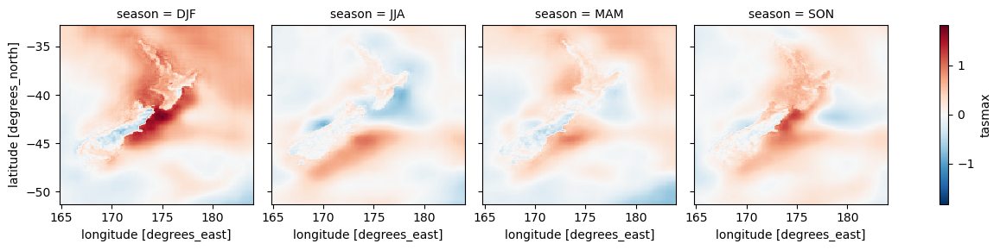

In [787]:
biases1.plot(col ="season")

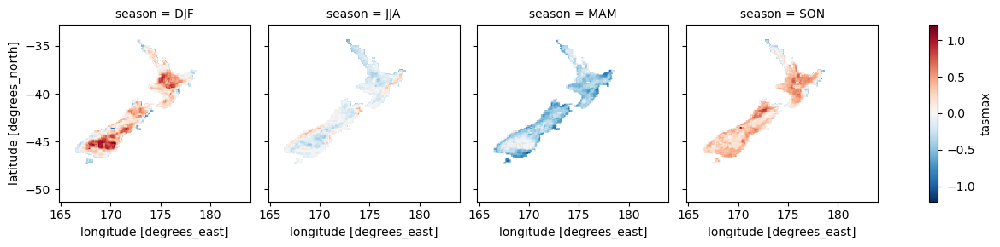

In [789]:
biases2.where(static_fields.orog>0,np.nan).plot(col ="season")

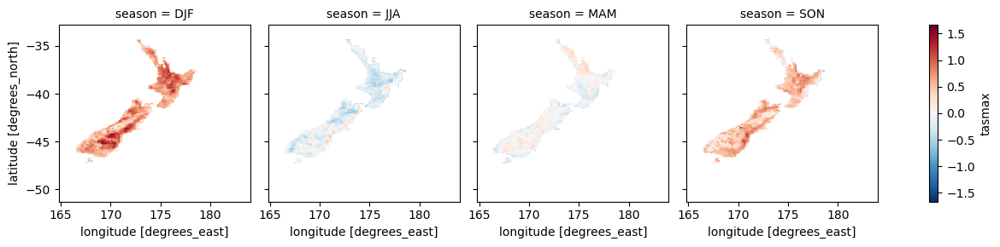

In [803]:
biases3.where(static_fields.orog>0,np.nan).plot(col ="season")

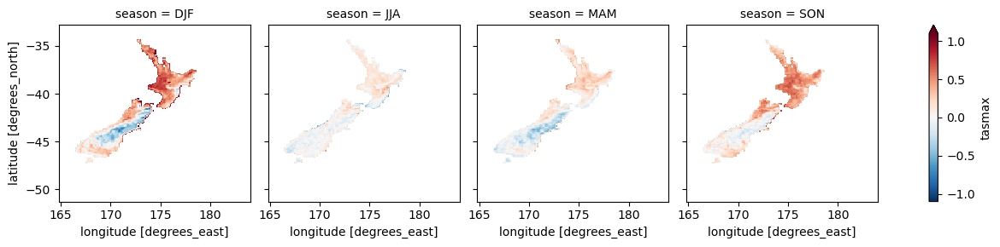

In [798]:
biases1.where(static_fields.orog>0,np.nan).plot(col ="season", vmax =1.1, vmin =-1.1, cmap ='RdBu_r')

In [793]:
abs(biases1).where(static_fields.orog>0,np.nan).mean(["lat","lon"])#.plot(col ="season")

<xarray.DataArray 'tasmax' (season: 4)>
array([0.38468652, 0.10266101, 0.1649366 , 0.28593073])
Coordinates:
    GCM      <U10 'ACCESS-CM2'
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [794]:
abs(biases2).where(static_fields.orog>0,np.nan).mean(["lat","lon"])#.plot(col ="season")

<xarray.DataArray 'tasmax' (season: 4)>
array([0.32311214, 0.15687953, 0.38210345, 0.30614441])
Coordinates:
    GCM      <U10 'ACCESS-CM2'
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [804]:
abs(biases3).where(static_fields.orog>0,np.nan).mean(["lat","lon"])#.plot(col ="season")

<xarray.DataArray 'tasmax' (season: 4)>
array([0.67632496, 0.21361092, 0.12068804, 0.44290249])
Coordinates:
    GCM      <U10 'ACCESS-CM2'
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

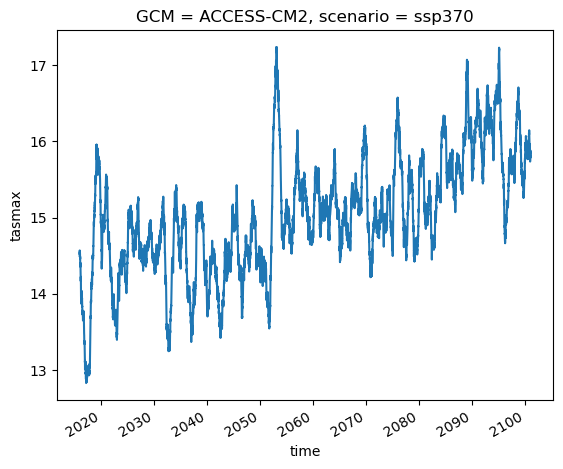

In [755]:
z1 = df.tasmax.var(["lat","lon"])



In [756]:
z2 = df_true.tasmax.sel(time = slice("2015","2099"), GCM ='ACCESS-CM2').var(["lat","lon"])#
#.plot()

In [760]:
import pandas as pd

In [761]:
z2['time'] = pd.to_datetime(z2.time.dt.strftime("%Y-%m-%d"))

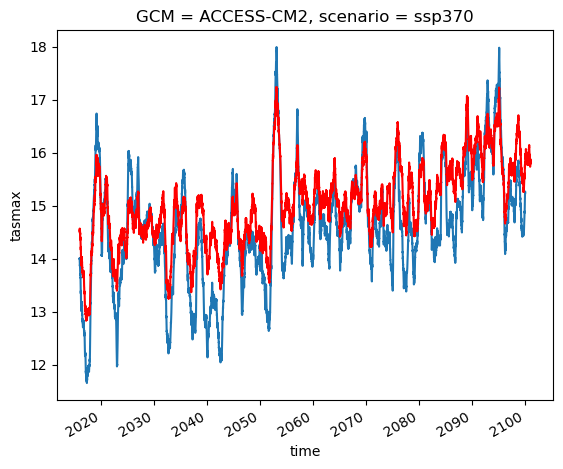

In [763]:
z2.rolling(time =365).mean().plot()
z1.rolling(time =365).mean().plot(color='r')

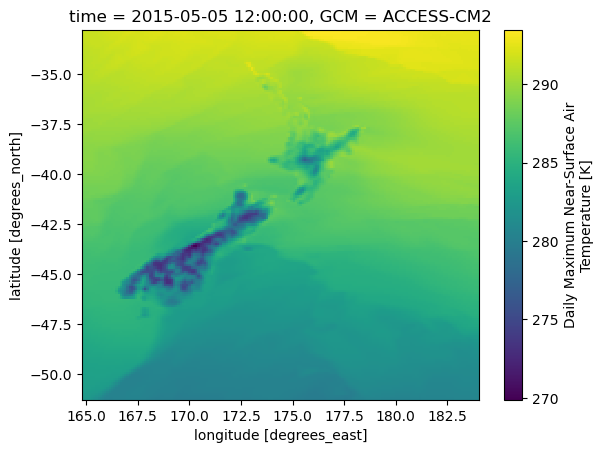

In [740]:
df_true.tasmax.sel(time ="2015-05-05", GCM ='ACCESS-CM2').plot()

In [447]:
df2 = xr.open_dataset(r'//nesi/nobackup/niwa00018/ML_Downscaled_CMIP6/ScenarioMIP/CSIRO-ARCCSS/ACCESS-CM2/ssp370/r4i1p1f1/day/pr/NZ_Domain/v20210712/pr_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r4i1p1f1_day_NZ12km_NIWA-REMS_v110425_pr.nc')

In [449]:
df2 = xr.open_dataset(r'///nesi/nobackup/niwa00018/ML_Downscaled_CMIP6/ScenarioMIP/EC-Earth-Consortium/EC-Earth3/ssp370/r1i1p1f1/day/pr/NZ_Domain/v20200310/pr_ScenarioMIP_EC-Earth-Consortium_EC-Earth3_ssp370_r1i1p1f1_day_NZ12km_NIWA-REMS_v110425_pr.nc')

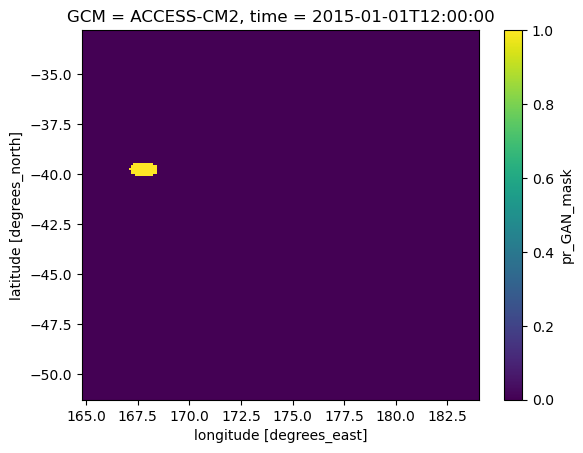

In [511]:
df2.pr_GAN_mask.isel(time =0).plot()

In [498]:
climo = df2.sel(time = slice("2080","2099")).groupby('time.season').mean()

In [510]:
np.exp(1.25+3.75)

148.4131591025766

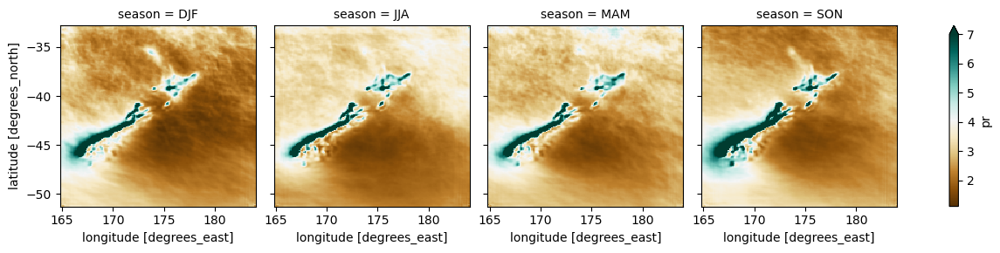

In [499]:
climo.pr.plot(col ="season", vmax =7, cmap ='BrBG')

In [502]:
climo

<xarray.Dataset>
Dimensions:      (season: 4, lat: 172, lon: 179)
Coordinates:
  * lon          (lon) float32 164.9 165.0 165.1 165.2 ... 183.7 183.9 184.0
  * lat          (lat) float32 -51.21 -51.11 -51.0 ... -33.07 -32.97 -32.86
    GCM          <U10 'ACCESS-CM2'
  * season       (season) object 'DJF' 'JJA' 'MAM' 'SON'
Data variables:
    pr           (season, lat, lon) float64 3.423 2.989 2.778 ... 2.002 1.537
    pr_GAN_mask  (season, lat, lon) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

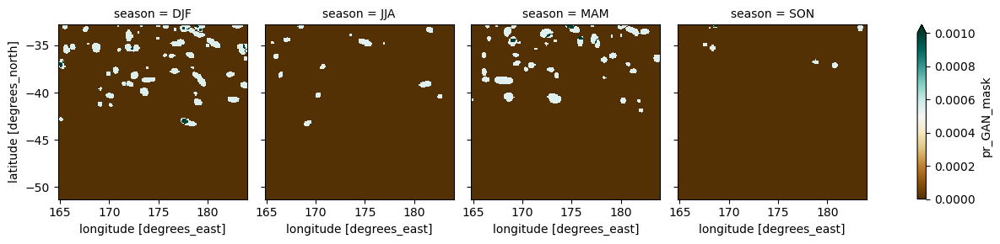

In [513]:
climo.pr_GAN_mask.plot(col ="season", cmap ='BrBG', vmax =0.001)

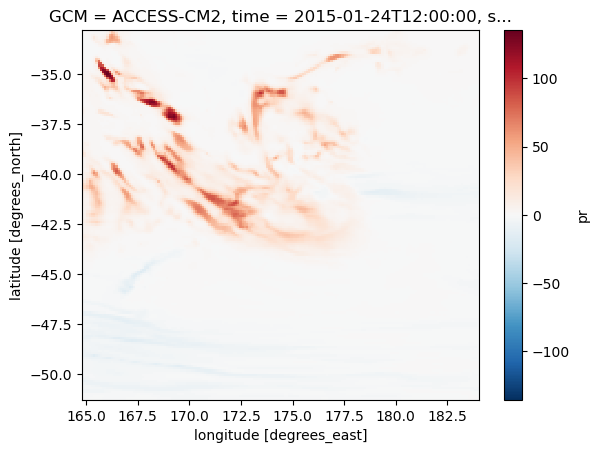

In [506]:
(df2.pr.isel(time =23)-df.pr.isel(time =23)).plot()

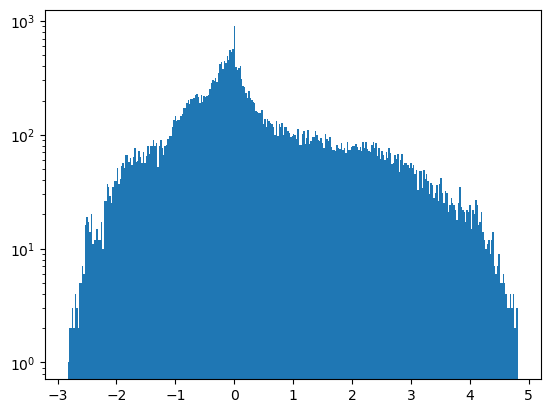

In [507]:
plt.hist((np.log(df2.pr.isel(time =23)+1)-np.log(df.pr.isel(time =23)+1)).values.ravel(), bins = 312)#.plot()\
plt.yscale('log')

In [464]:
df_true = xr.open_dataset("/nesi/project/niwa00018/ML_downscaling_CCAM/multi-variate-gan/inputs/target_fields/target_fields_hist_ssp370_concat.nc")

In [466]:
low_res = xr.open_dataset(r"/nesi/project/niwa00018/ML_downscaling_CCAM/multi-variate-gan/inputs/predictor_fields/predictor_fields_hist_ssp370_merged_updated.nc")

In [467]:
low_res

<xarray.Dataset>
Dimensions:  (time: 51135, lon: 26, lat: 23, GCM: 5)
Coordinates:
  * time     (time) datetime64[ns] 1960-01-01 1960-01-02 ... 2099-12-31
  * lon      (lon) float64 150.6 152.1 153.6 155.1 ... 183.6 185.1 186.6 188.1
  * lat      (lat) float64 -59.38 -57.88 -56.38 -54.88 ... -29.38 -27.88 -26.38
  * GCM      (GCM) object 'ACCESS-CM2' 'AWI-CM-1-1-MR' ... 'NorESM2-MM'
Data variables: (12/15)
    t_850    (GCM, time, lat, lon) float32 ...
    t_500    (GCM, time, lat, lon) float32 ...
    t_250    (GCM, time, lat, lon) float32 ...
    u_850    (GCM, time, lat, lon) float32 ...
    u_500    (GCM, time, lat, lon) float32 ...
    u_250    (GCM, time, lat, lon) float32 ...
    ...       ...
    w_850    (GCM, time, lat, lon) float32 ...
    w_500    (GCM, time, lat, lon) float32 ...
    w_250    (GCM, time, lat, lon) float32 ...
    q_850    (GCM, time, lat, lon) float32 ...
    q_500    (GCM, time, lat, lon) float32 ...
    q_250    (GCM, time, lat, lon) float32 ...

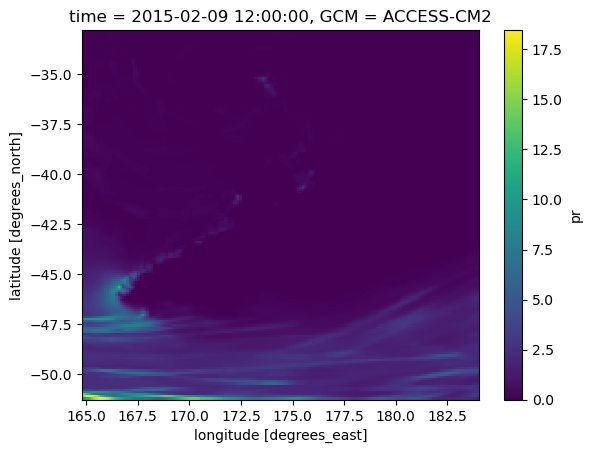

In [394]:
(df_true.sel(time ="2015-02-09")*86400).plot()

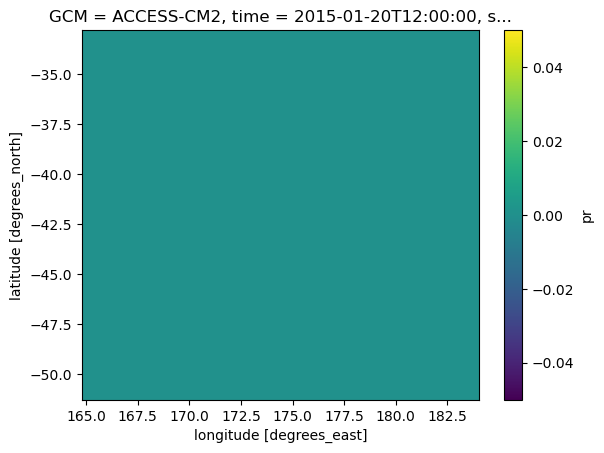

In [223]:
(df.pr.isel(time =19) - df2.pr.isel(time =19)).plot()

In [219]:
df2.pr.sel(time = "2093-02-22").plot()DFD

SyntaxError: invalid syntax (3152069186.py, line 1)

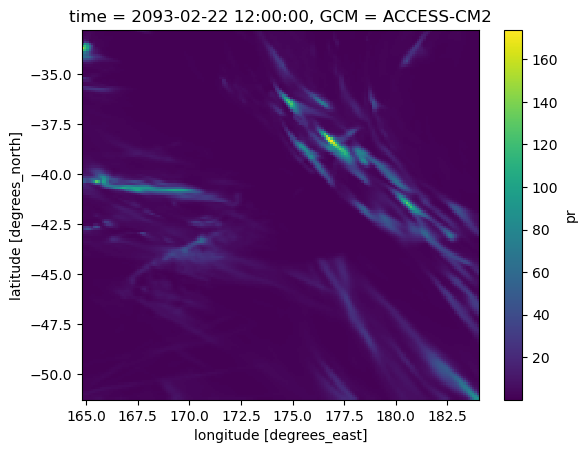

In [73]:
climo = df.sel(time = slice("2080","2099")).groupby('time.season').mean()

In [87]:
df_true = xr.open_dataset("/nesi/project/niwa00018/ML_downscaling_CCAM/multi-variate-gan/inputs/target_fields/target_fields_hist_ssp370_concat.nc").pr.isel(GCM =0)

In [215]:
climo_max = df.sel(time = slice("2080","2099")).groupby('time.year').max().mean("year")

In [399]:
climo_max_hist = df_hist.sel(time = slice("1986","2005")).groupby('time.year').max().mean("year")

In [401]:
cc_signal = 100* (climo_max - climo_max_hist)/climo_max_hist

In [410]:
cc_signal.pr.where(static_fields.orog>0, np.nan).mean()#.plot(vmin =-50, cmap ='BrBG')


<xarray.DataArray 'pr' ()>
array(30.47114491)
Coordinates:
    GCM       <U10 'ACCESS-CM2'
    scenario  <U10 'historical'

In [413]:
indexes = np.where(df_hist.pr >700)

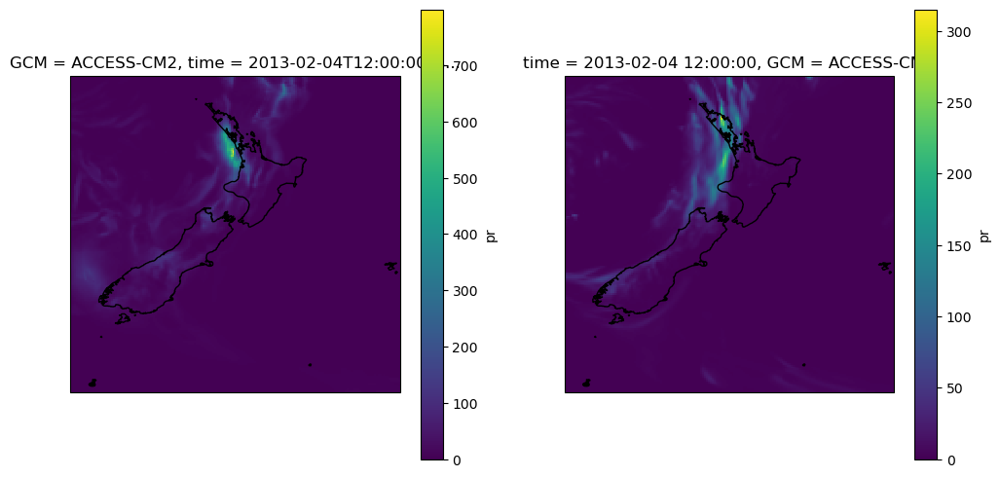

In [429]:
fig, ax = plt.subplots(1, 2, subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 6))
df_hist.isel(time = 23045).pr.plot(ax = ax[0],transform = ccrs.PlateCarree())
ax[0].coastlines('10m')
(df_true.sel(time = "2013-02-04")*86400).plot(ax = ax[1],transform = ccrs.PlateCarree())#.isel(GCM =0)
ax[1].coastlines('10m')

In [434]:
indexes2 = np.where(df.pr >1000)

In [435]:
np.unique(indexes2[0])

array([12833, 23085, 27057, 27074, 27801, 27822, 30723, 31145])

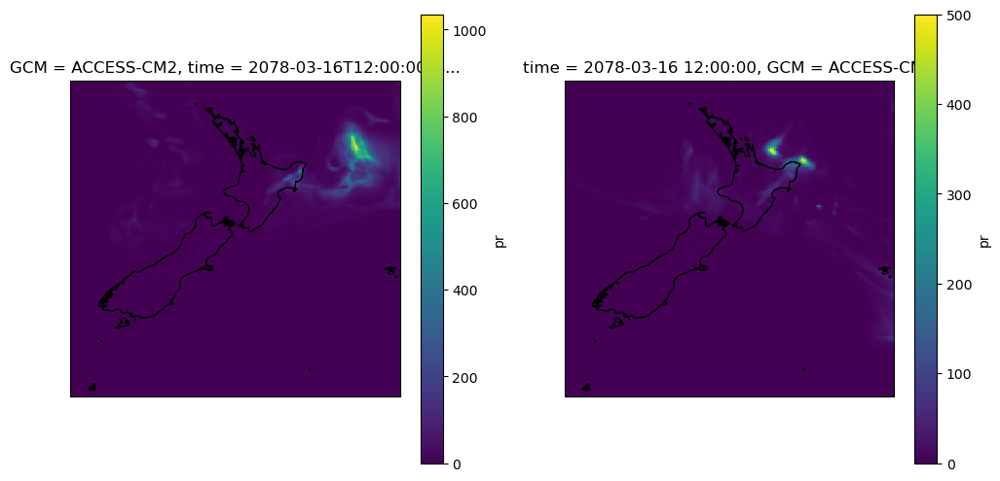

In [440]:
fig, ax = plt.subplots(1, 2, subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 6))
df.isel(time = np.unique(indexes2[0])[1]).pr.plot(ax = ax[0],transform = ccrs.PlateCarree())
ax[0].coastlines('10m')
(df_true.sel(time = "2078-03-16")*86400).plot(ax = ax[1],transform = ccrs.PlateCarree())#.isel(GCM =0)
ax[1].coastlines('10m')

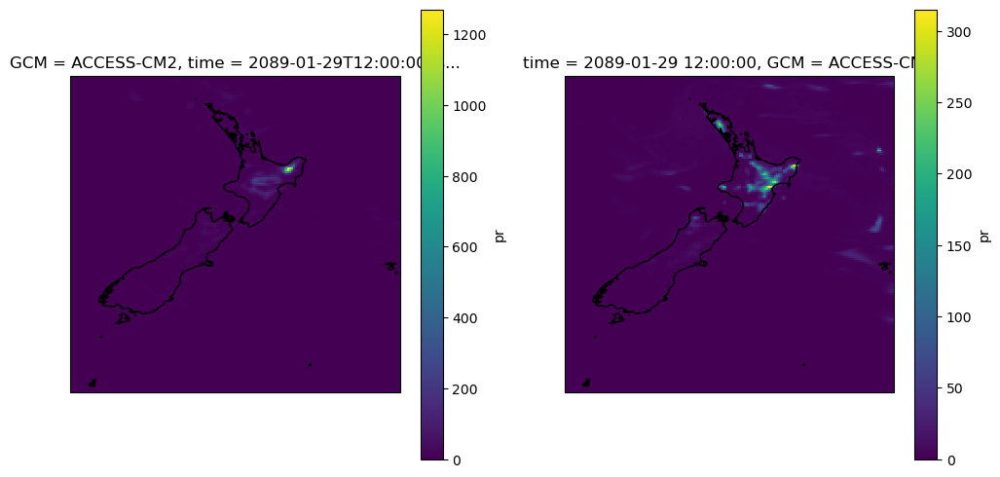

In [442]:
fig, ax = plt.subplots(1, 2, subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 6))
df.isel(time = np.unique(indexes2[0])[2]).pr.plot(ax = ax[0],transform = ccrs.PlateCarree())
ax[0].coastlines('10m')
(df_true.sel(time = "2089-01-29")*86400).plot(ax = ax[1],transform = ccrs.PlateCarree())#.isel(GCM =0)
ax[1].coastlines('10m')

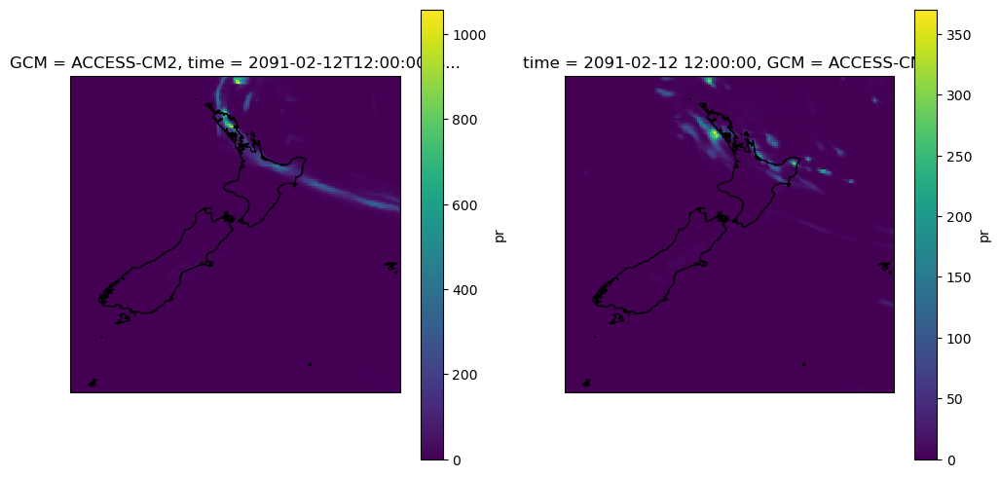

In [446]:
fig, ax = plt.subplots(1, 2, subplot_kw = dict(projection =ccrs.PlateCarree(central_longitude =171.77)), figsize = (12, 6))
df.isel(time = np.unique(indexes2[0])[4]).pr.plot(ax = ax[0],transform = ccrs.PlateCarree())
ax[0].coastlines('10m')
(df_true.sel(time = "2091-02-12")*86400).plot(ax = ax[1],transform = ccrs.PlateCarree())#.isel(GCM =0)
ax[1].coastlines('10m')

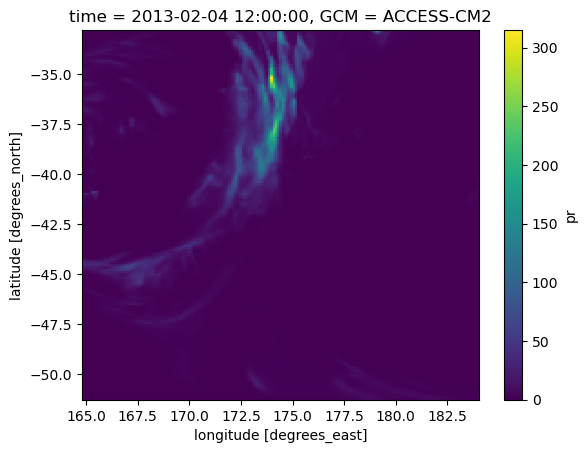

In [421]:
(df_true.sel(time = "2013-02-04")*86400).plot()#.isel(GCM =0)

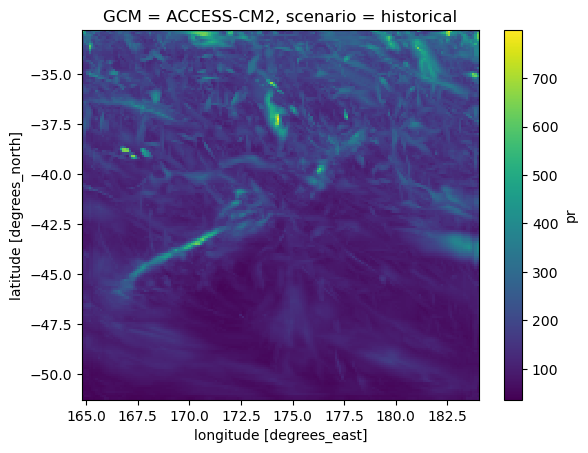

In [411]:
df_hist.max("time").pr.plot()

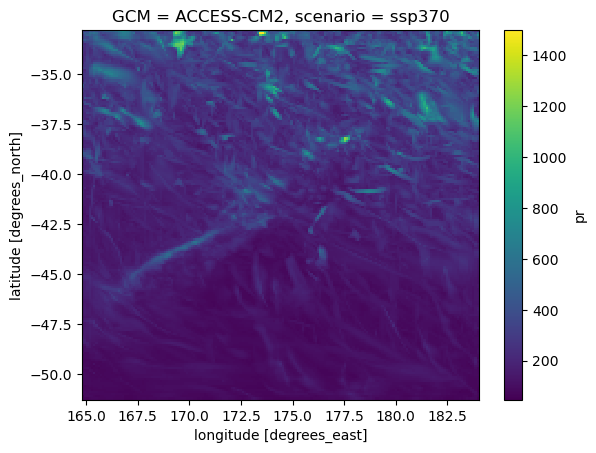

In [512]:
df.max("time").pr.plot()

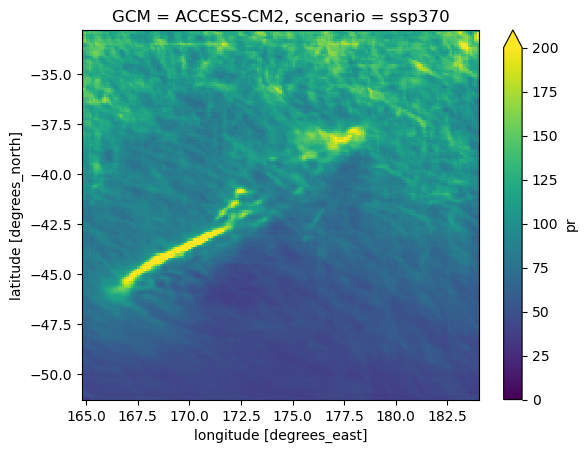

In [395]:
climo_max.pr.plot(vmin =0, vmax =200)

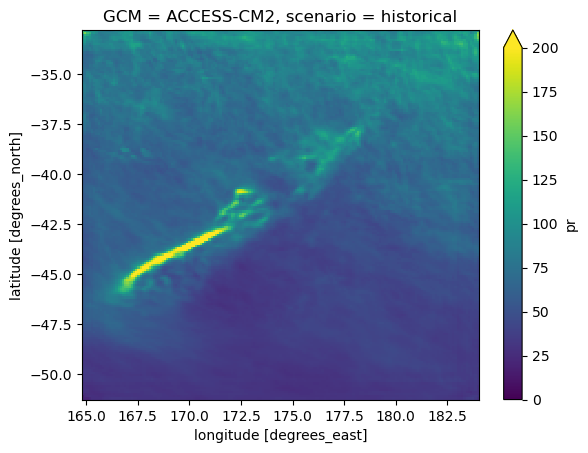

In [400]:
climo_max_hist.pr.plot(vmin =0, vmax =200)

In [88]:
climo_max_true = df_true.sel(time = slice("2080","2099")).groupby('time.year').max().mean("year") *86400

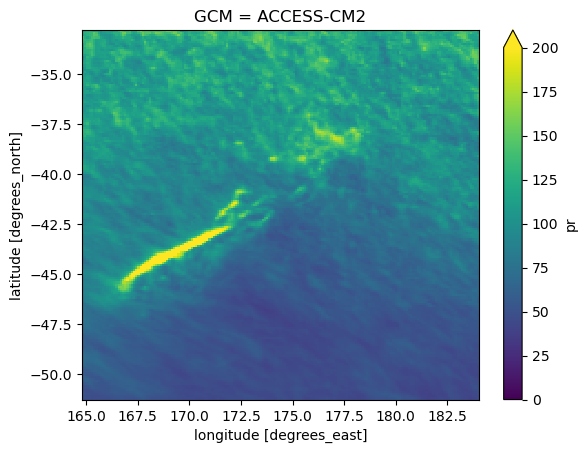

In [397]:
climo_max_true.plot(vmin =0, vmax =200)

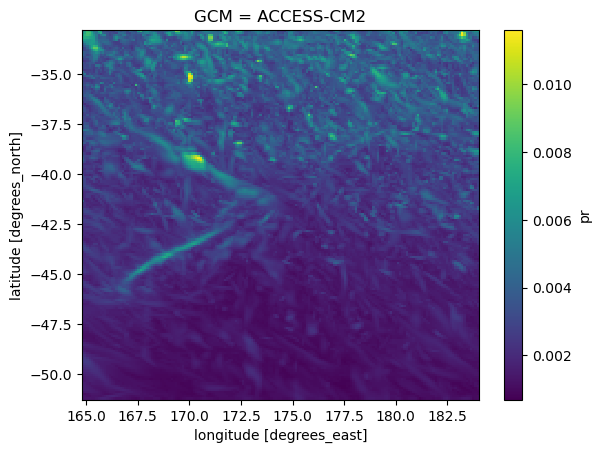

In [92]:
df_true.max("time").plot()

In [50]:
variance_AI = AI_indicators.Rx1day.sel(GCM_variant = gcm_variants).var("GCM_variant")

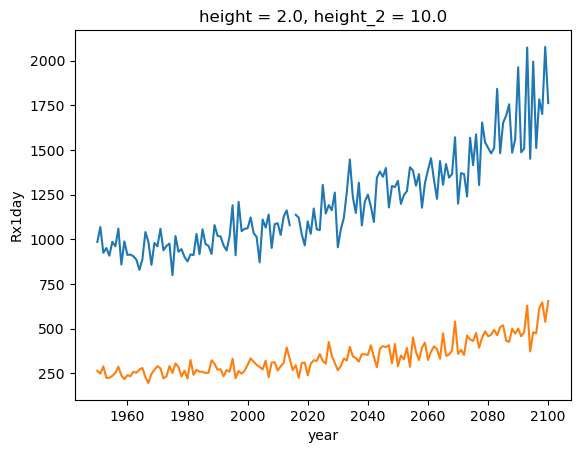

In [51]:
variance_AI.drop_duplicates("year").where(static_fields.orog>0, np.nan).mean(["lat","lon"]).plot()
variance.drop_duplicates("year").where(static_fields.orog>0, np.nan).mean(["lat","lon"]).plot()

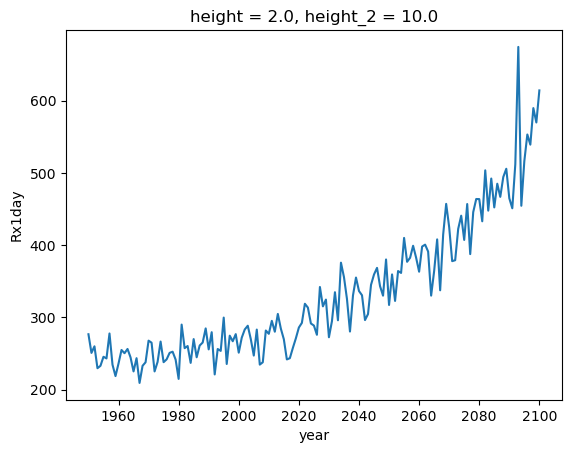

In [57]:
variance.drop_duplicates("year").mean(["lat","lon"]).plot()

In [26]:
ratio_of_variance = 100 *(variance_AI.drop_duplicates("year")  - variance )/variance 


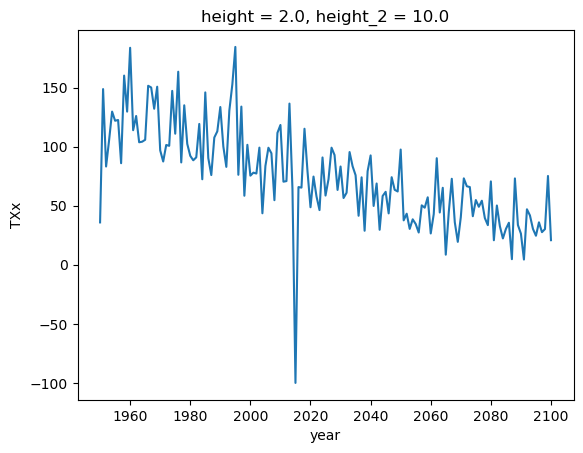

In [28]:
ratio_of_variance.mean(["lat","lon"]).plot()

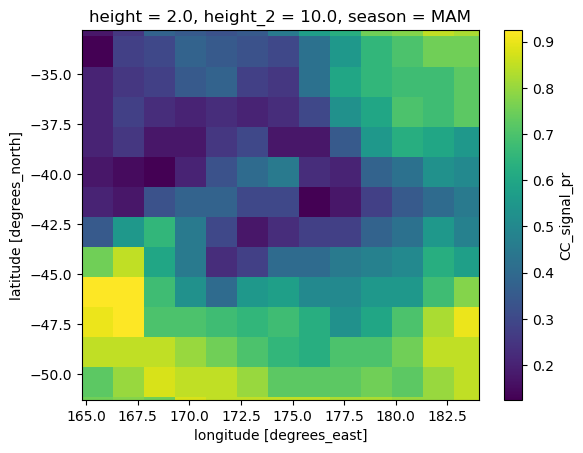

In [31]:
((merged_dset['CC_signal_pr'] >0).sum("GCM_variant")/40).isel(season =2).plot()

In [40]:
confidence = ((merged_dset['CC_signal_pr'] >0).sum("GCM_variant")/40).isel(season =3)

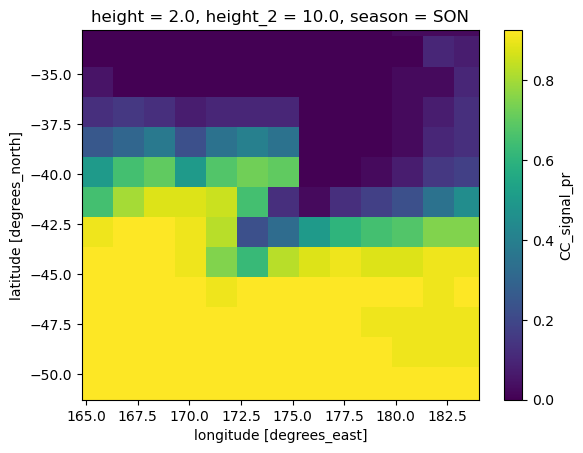

In [41]:
confidence.plot()

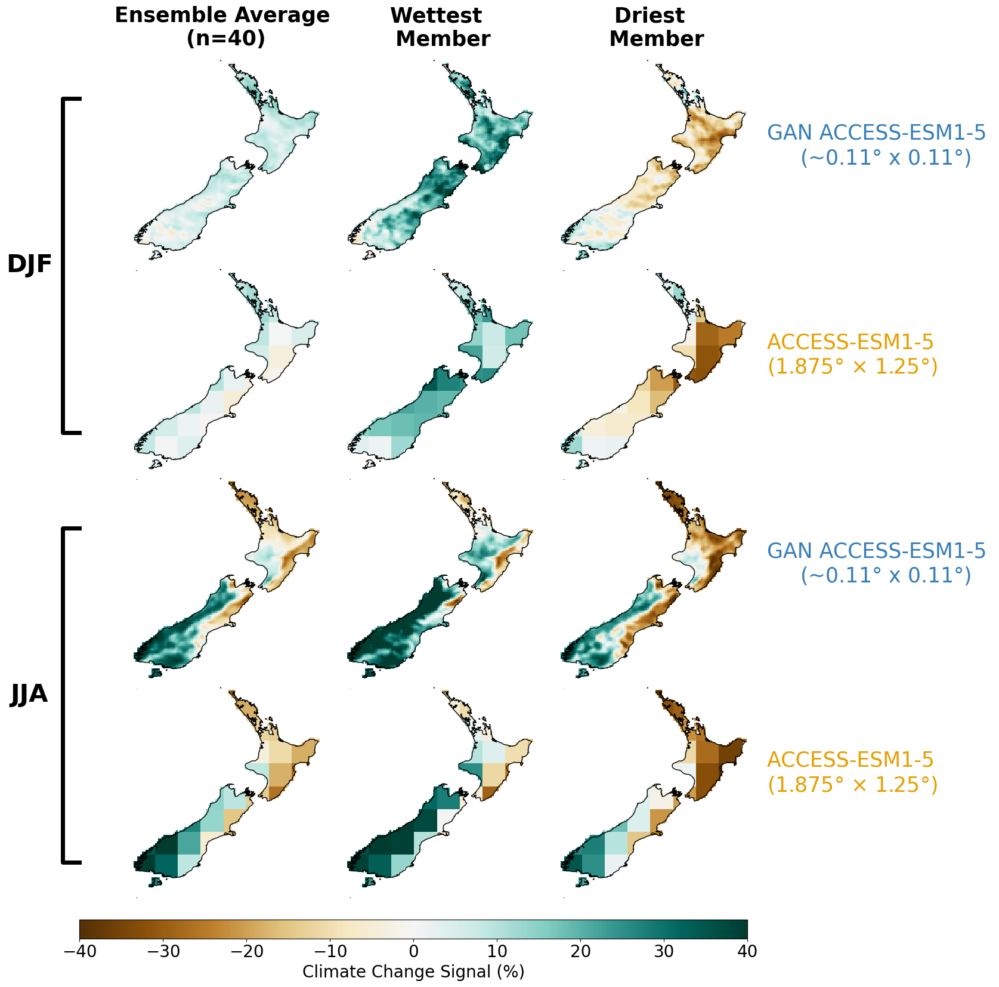

In [91]:
fig, ax = plt.subplots(4,3, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (14, 16),sharex=True,sharey=True)
#hillshade_dset.hillshade.plot(ax = ax[0,0], cmap ='Greys_r', alpha =0.25, levels =50, zorder =4, add_colorbar =False, transform =ccrs.PlateCarree())
access_esm.where(static_fields.orog>0, np.nan).mean("GCM_variant").isel(season =0).plot(ax = ax[0,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', zorder =3, alpha =1, vmin =-40, vmax =40)
access_esm.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest).isel(season =0).plot(ax = ax[0,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
merged_dset['CC_signal_pr'].sel(GCM_variant = access_esm.GCM_variant.values[wettest]).where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
merged_dset['CC_signal_pr'].mean("GCM_variant").where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)

# 

merged_dset['CC_signal_pr'].sel(GCM_variant = access_esm.GCM_variant.values[driest]).where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
access_esm.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest).isel(season =0).plot(ax = ax[0,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)


access_esm.where(static_fields.orog>0, np.nan).mean("GCM_variant").isel(season =1).plot(ax = ax[2,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
cs1 = access_esm.where(static_fields.orog>0, np.nan).isel(GCM_variant = wettest_jja).isel(season =1).plot(ax = ax[2,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
access_esm.where(static_fields.orog>0, np.nan).isel(GCM_variant = driest_jja).isel(season =1).plot(ax = ax[2,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
merged_dset['CC_signal_pr'].sel(GCM_variant = access_esm.GCM_variant.values[wettest_jja]).where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
merged_dset['CC_signal_pr'].mean("GCM_variant").where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
merged_dset['CC_signal_pr'].sel(GCM_variant = access_esm.GCM_variant.values[driest_jja]).where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='BrBG', vmin =-40, vmax =40)
[ax[i,j].set_title(' ') for i in range(4) for j in range(3)]
[ax[i,j].set_frame_on(False) for i in range(4) for j in range(3)]
ax[0,0].set_extent([165, 180, -48, -33.5], crs = ccrs.PlateCarree())
ax[0,0].set_title('Ensemble Average \n(n=40)', fontsize =25, weight ='bold')
ax[0,1].set_title('Wettest \n Member', fontsize =25, weight ='bold')
ax[0,2].set_title('Driest \n Member', fontsize =25, weight ='bold')

[ax[i,j].coastlines('10m', zorder =8) for i in range(4) for j in range(3)]

# Remove extra space


# Add text label ("JJA") on the left
fig.text(-0.01, 0.5 + (0.85 - 0.5)/2, "DJF", fontsize=30, va='center', ha='center', weight ='bold')

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.85, 0.85, 0.5, 0.5]  # Y-coordinates
ax5 = fig.add_axes([0, 0.5, 0.05, 0.4])

ax5.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax5.set_frame_on(False)
ax5.set_yticks([])
ax5.set_xticks([])


gan_color = "#377EB8"  # Blue for GAN ACCESS-ESM1-5
esm_color = "#E69F00"  # Orange for ACCESS-ESM1-5

fig.text(-0.01, 0.05 + (0.4 - 0.05)/2, "JJA", fontsize=30, va='center', ha='center', weight ='bold')

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.4, 0.4, 0.05, 0.05]  # Y-coordinates
ax6 = fig.add_axes([0, 0.05, 0.05, 0.4])

ax6.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax6.set_frame_on(False)
ax6.set_yticks([])
ax6.set_xticks([])
ax[0,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
plt.subplots_adjust(left=0.0125, right=0.95, top=0.9, bottom=0.0125, wspace=-0.4, hspace=-0.05)
ax[1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax[2,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
ax[-1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax7 = fig.add_axes([0.05, -0.03, 0.8, 0.02])
cbar = fig.colorbar(cs1, cax = ax7, orientation = 'horizontal')
cbar.set_label('Climate Change Signal (%)', fontsize =20)
cbar.ax.tick_params(labelsize =20)
#fig.tight_layout()
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots.png', dpi =500, bbox_inches ='tight')
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots.pdf', dpi =300, bbox_inches ='tight')

In [69]:
hottest_jja

3

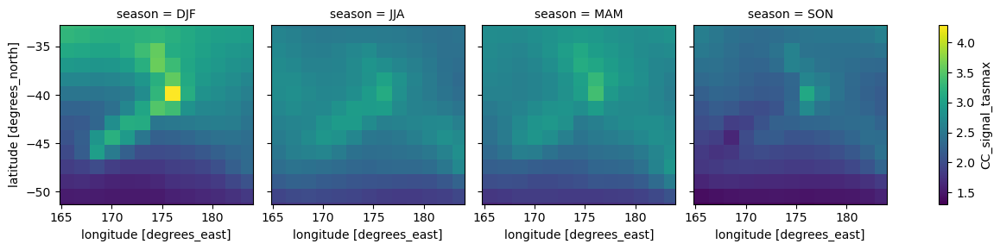

In [70]:
merged_dset['CC_signal_tasmax'].sel(GCM_variant = access_esm.GCM_variant.values[hottest_jja]).plot(col ="season")

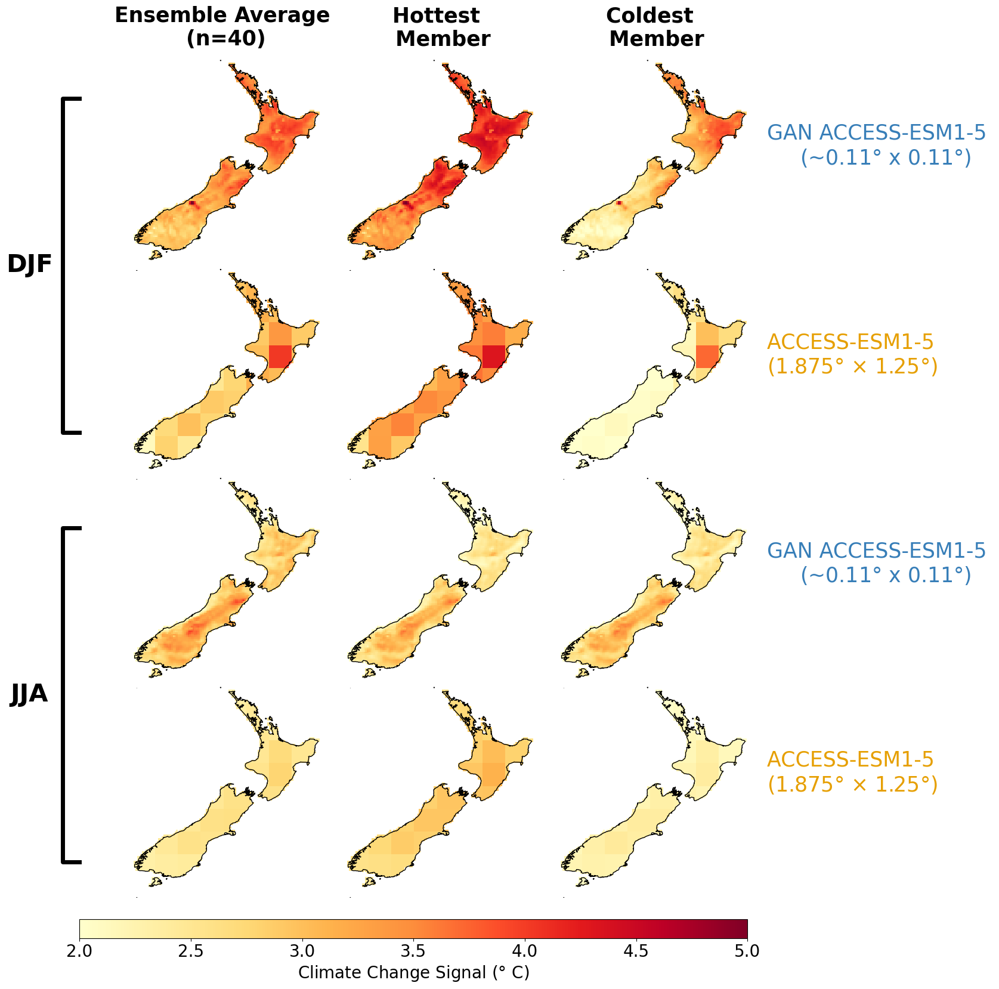

In [166]:
fig, ax = plt.subplots(4,3, subplot_kw = dict(projection = ccrs.PlateCarree(central_longitude =171.77)), figsize = (14, 16),sharex=True,sharey=True)
#hillshade_dset.hillshade.plot(ax = ax[0,0], cmap ='Greys_r', alpha =0.25, levels =50, zorder =4, add_colorbar =False, transform =ccrs.PlateCarree())
access_esm_tasmax.where(static_fields.orog>0, np.nan).mean("GCM_variant").isel(season =0).plot(ax = ax[0,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
access_esm_tasmax.where(static_fields.orog>0, np.nan).isel(GCM_variant = hottest).isel(season =0).plot(ax = ax[0,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
merged_dset['CC_signal_tasmax'].sel(GCM_variant = access_esm.GCM_variant.values[hottest]).where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
merged_dset['CC_signal_tasmax'].mean("GCM_variant").where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)

# 

merged_dset['CC_signal_tasmax'].sel(GCM_variant = access_esm.GCM_variant.values[coldest]).where(static_fields.orog>0, np.nan).isel(season =0).plot(ax = ax[1,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
access_esm_tasmax.where(static_fields.orog>0, np.nan).isel(GCM_variant = coldest).isel(season =0).plot(ax = ax[0,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)


access_esm_tasmax.where(static_fields.orog>0, np.nan).mean("GCM_variant").isel(season =1).plot(ax = ax[2,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
cs1 = access_esm_tasmax.where(static_fields.orog>0, np.nan).isel(GCM_variant = coldest_jja).isel(season =1).plot(ax = ax[2,1], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
access_esm_tasmax.where(static_fields.orog>0, np.nan).isel(GCM_variant = coldest_jja).isel(season =1).plot(ax = ax[2,2], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
merged_dset['CC_signal_tasmax'].sel(GCM_variant = access_esm.GCM_variant.values[hottest_jja]).where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,1],
transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
merged_dset['CC_signal_tasmax'].mean("GCM_variant").where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,0], transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd' , vmin =2, vmax =5)
merged_dset['CC_signal_tasmax'].sel(GCM_variant = access_esm.GCM_variant.values[coldest_jja]).where(static_fields.orog>0, np.nan).isel(season =1).plot(ax = ax[3,2],
transform = ccrs.PlateCarree(), add_colorbar =False, cmap ='YlOrRd', vmin =2, vmax =5)
[ax[i,j].set_title(' ') for i in range(4) for j in range(3)]
[ax[i,j].set_frame_on(False) for i in range(4) for j in range(3)]
ax[0,0].set_extent([165, 180, -48, -33.5], crs = ccrs.PlateCarree())
ax[0,0].set_title('Ensemble Average \n(n=40)', fontsize =25, weight ='bold')
ax[0,1].set_title('Hottest \n Member', fontsize =25, weight ='bold')
ax[0,2].set_title('Coldest \n Member', fontsize =25, weight ='bold')

[ax[i,j].coastlines('10m', zorder =8) for i in range(4) for j in range(3)]

# Remove extra space


# Add text label ("JJA") on the left
fig.text(-0.01, 0.5 + (0.85 - 0.5)/2, "DJF", fontsize=30, va='center', ha='center', weight ='bold')

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.85, 0.85, 0.5, 0.5]  # Y-coordinates
ax5 = fig.add_axes([0, 0.5, 0.05, 0.4])

ax5.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax5.set_frame_on(False)
ax5.set_yticks([])
ax5.set_xticks([])


gan_color = "#377EB8"  # Blue for GAN ACCESS-ESM1-5
esm_color = "#E69F00"  # Orange for ACCESS-ESM1-5

fig.text(-0.01, 0.05 + (0.4 - 0.05)/2, "JJA", fontsize=30, va='center', ha='center', weight ='bold')

# Add thick bracket-like symbol
bracket_x = [0.05, 0.03, 0.03, 0.05]  # X-coordinates
bracket_y = [0.4, 0.4, 0.05, 0.05]  # Y-coordinates
ax6 = fig.add_axes([0, 0.05, 0.05, 0.4])

ax6.plot(bracket_x, bracket_y, transform=fig.transFigure, lw=5, color='black', clip_on=False)
ax6.set_frame_on(False)
ax6.set_yticks([])
ax6.set_xticks([])
ax[0,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
plt.subplots_adjust(left=0.0125, right=0.95, top=0.9, bottom=0.0125, wspace=-0.4, hspace=-0.05)
ax[1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax[2,-1].text(180, -41, 'GAN ACCESS-ESM1-5 \n     (~0.11$\degree$ x 0.11$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color =gan_color)
ax[-1,-1].text(180, -41, 'ACCESS-ESM1-5 \n(1.875$\degree$ × 1.25$\degree$)', fontsize =25, transform = ccrs.PlateCarree(), color=esm_color)
ax7 = fig.add_axes([0.05, -0.03, 0.8, 0.02])
cbar = fig.colorbar(cs1, cax = ax7, orientation = 'horizontal')
cbar.set_label('Climate Change Signal ($\degree$ C)', fontsize =20)
cbar.ax.tick_params(labelsize =20)
#fig.tight_layout()
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots.png', dpi =500, bbox_inches ='tight')
#fig.savefig(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Deser_wettest_and_driest_plots.pdf', dpi =300, bbox_inches ='tight')

In [93]:
signal_true  = (merged_dset.Rx1day.sel(year = slice(2070,2100)).mean(["year"])*86400).where(static_fields.orog>0, np.nan) - (merged_dset.Rx1day.sel(year = slice(1980,2010)).mean(["year"])*86400).where(static_fields.orog>0, np.nan)#.plot(ax = ax[0], cmap ='BrBG', vmin =0, vmax =120, transform = ccrs.PlateCarree())
signal_true = 100 * signal_true / (merged_dset.Rx1day.sel(year = slice(1980,2010)).mean(["year"])*86400).where(static_fields.orog>0, np.nan)
signal_true_ccam_em = (AI_indicators.Rx1day.sel(year = slice(2070,2100)).mean(["year"])).where(static_fields.orog>0, np.nan) - (AI_indicators.Rx1day.sel(year = slice(1980,2010)).mean(["year"])).where(static_fields.orog>0, np.nan)
signal_true_ccam_em = 100*signal_true_ccam_em/(AI_indicators.Rx1day.sel(year = slice(1980,2010)).mean(["year"])).where(static_fields.orog>0, np.nan)#.plot(ax = ax[1], cmap ='BrBG', vmin =0, vmax =120, transform = ccrs.PlateCarree())


In [109]:
signal_true_ccam_em_mask = (signal_true_ccam_em.sel(GCM_variant =AI_indicators.GCM.isel(year=0)  =='ACCESS-ESM1-5')> 0).sum("GCM_variant")
signal_true_ccam_em_nan = (~signal_true_ccam_em.sel(GCM_variant =AI_indicators.GCM.isel(year=0) =='ACCESS-ESM1-5').isnull()).sum("GCM_variant")
confidence_ai = signal_true_ccam_em_mask /signal_true_ccam_em_nan 

In [110]:
signal_true_ccam_em_mask = (signal_true> 0).sum("GCM_variant")
signal_true_ccam_em_nan = (~signal_true.isnull()).sum("GCM_variant")
confidence_gcm = signal_true_ccam_em_mask /signal_true_ccam_em_nan 

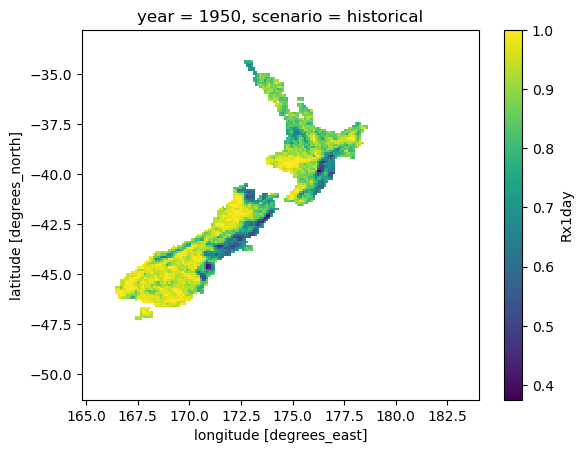

In [111]:
confidence_ai.plot()

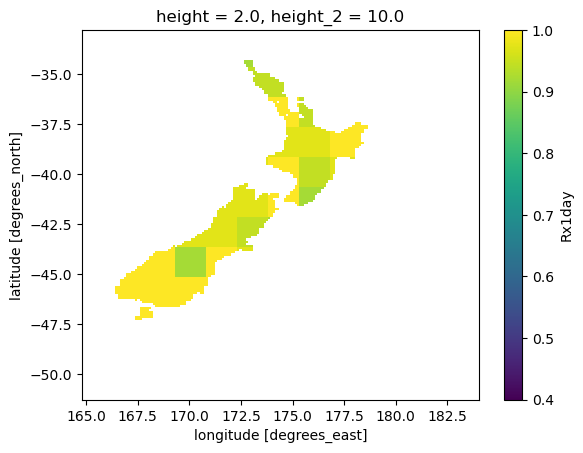

In [112]:
confidence_gcm.plot(vmin =0.4)

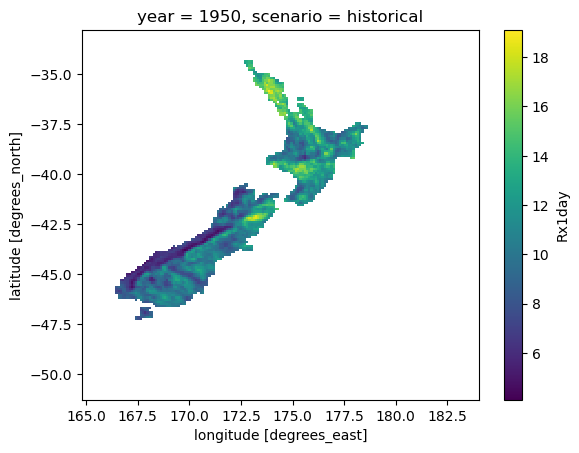

In [165]:
(signal_true_ccam_em.sel(GCM_variant =AI_indicators.GCM.isel(year=0) =='ACCESS-ESM1-5')).std("GCM_variant").plot()

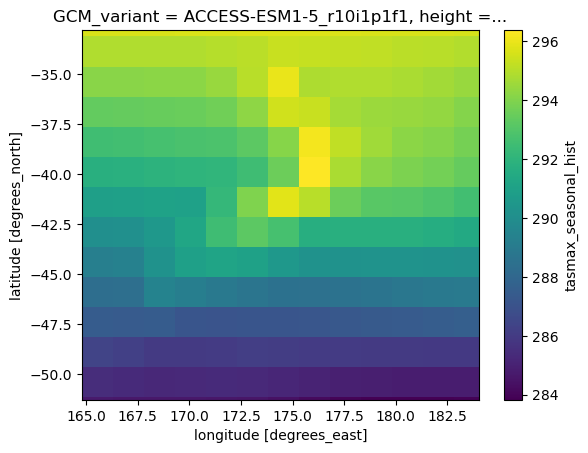

In [ ]:
(merged_dset.tasmax_seasonal_hist.isel(GCM_variant =0, season =0)).plot()#vmin =0, vmax =5, cmap ='BrBG')

In [209]:
signal_ml = (AI_indicators.sel(year = slice(2080, 2099)).mean("year") - AI_indicators.sel(year = slice(1986, 2005)).mean("year"))#.mean("GCM_variant")
signal = (merged_dset.sel(year = slice(2080, 2099)).mean("year") - merged_dset.sel(year = slice(1986, 2005)).mean("year"))#.mean("GCM_variant")

In [210]:
signal['Rx1day'].data = signal['Rx1day'].values/merged_dset.Rx1day.sel(year = slice(1986, 2005)).mean("year").values

In [211]:
signal_ml['Rx1day'].data = signal_ml['Rx1day'].values/AI_indicators.Rx1day.sel(year = slice(1986, 2005)).mean("year").values

In [215]:
latlon_mean1 = merged_dset.where(static_fields.orog>0, np.nan).mean(["lat","lon"])
latlon_mean_ml1 = AI_indicators.where(static_fields.orog>0, np.nan).mean(["lat","lon"])


In [353]:
gcm_variants = ['ACCESS-ESM1-5_r10i1p1f1', 'ACCESS-ESM1-5_r11i1p1f1',
       'ACCESS-ESM1-5_r12i1p1f1', 'ACCESS-ESM1-5_r13i1p1f1',
       'ACCESS-ESM1-5_r14i1p1f1', 'ACCESS-ESM1-5_r15i1p1f1',
       'ACCESS-ESM1-5_r16i1p1f1', 'ACCESS-ESM1-5_r17i1p1f1',
       'ACCESS-ESM1-5_r18i1p1f1', 'ACCESS-ESM1-5_r19i1p1f1',
       'ACCESS-ESM1-5_r1i1p1f1', 'ACCESS-ESM1-5_r20i1p1f1',
       'ACCESS-ESM1-5_r21i1p1f1', 'ACCESS-ESM1-5_r22i1p1f1',
       'ACCESS-ESM1-5_r23i1p1f1', 'ACCESS-ESM1-5_r24i1p1f1',
       'ACCESS-ESM1-5_r25i1p1f1', 'ACCESS-ESM1-5_r26i1p1f1',
       'ACCESS-ESM1-5_r27i1p1f1', 'ACCESS-ESM1-5_r28i1p1f1',
       'ACCESS-ESM1-5_r29i1p1f1', 'ACCESS-ESM1-5_r2i1p1f1',
       'ACCESS-ESM1-5_r30i1p1f1', 'ACCESS-ESM1-5_r31i1p1f1',
       'ACCESS-ESM1-5_r32i1p1f1', 'ACCESS-ESM1-5_r33i1p1f1',
       'ACCESS-ESM1-5_r34i1p1f1', 'ACCESS-ESM1-5_r35i1p1f1',
       'ACCESS-ESM1-5_r36i1p1f1', 'ACCESS-ESM1-5_r37i1p1f1',
       'ACCESS-ESM1-5_r38i1p1f1', 'ACCESS-ESM1-5_r39i1p1f1',
       'ACCESS-ESM1-5_r3i1p1f1', 'ACCESS-ESM1-5_r40i1p1f1',
       'ACCESS-ESM1-5_r4i1p1f1', 'ACCESS-ESM1-5_r5i1p1f1',
       'ACCESS-ESM1-5_r6i1p1f1', 'ACCESS-ESM1-5_r7i1p1f1',
       'ACCESS-ESM1-5_r8i1p1f1', 'ACCESS-ESM1-5_r9i1p1f1']

In [277]:

merged_dset2 = xr.open_dataset(r'/nesi/project/niwa00018/ML_downscaling_CCAM/AI_large_ensemble/Low_res_ACCESS-ESM1-5_ensemble.nc')
merged_dset2['CC_signal_pr'] = 100*(merged_dset2['pr_seasonal_future'] -merged_dset2['pr_seasonal_hist'])/merged_dset2['pr_seasonal_hist']
#merged_dset= merged_dset.interp(lat = static_fields.lat, lon = static_fields.lon, method ='nearest')
merged_dset2['CC_signal_tasmax'] = (merged_dset2['tasmax_seasonal_future'] -merged_dset2['tasmax_seasonal_hist'])#/merged_dset['pr_seasonal_hist']
merged_dset2= merged_dset2.interp(lat = static_fields.lat, lon = static_fields.lon, method ='linear', kwargs = dict(fill_value = 'extrapolate'))